# Inserimento pacchetti

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d
import statsmodels.api as sm
from scipy import stats
from scipy.stats import norm
from datetime import datetime
import yfinance as yf
import os
from scipy import stats
from arch import arch_model
from scipy.special import gamma
from arch.__future__ import reindexing
from tqdm.notebook import tqdm
from scipy.optimize import fmin

# Caricamento Dati

In [2]:
# Microsoft MSFT
name_msft = 'MSFT_yf_2000_12_31_2022.csv'

if not os.path.isfile(name_msft):
    data_msft = yf.download("MSFT", start='2000-01-01', end='2022-12-31')
    data_msft.to_csv(name_msft)
    
# MSFT
data_msft = pd.read_csv(name_msft, index_col='Date', parse_dates=True, dayfirst=True)
data_msft

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,58.687500,59.312500,56.000000,58.281250,36.282242,53228400
2000-01-04,56.781250,58.562500,56.125000,56.312500,35.056641,54119000
2000-01-05,55.562500,58.187500,54.687500,56.906250,35.426266,64059600
2000-01-06,56.093750,56.937500,54.187500,55.000000,34.239559,54976600
2000-01-07,54.312500,56.125000,53.656250,55.718750,34.686989,62013600
...,...,...,...,...,...,...
2022-12-23,236.110001,238.869995,233.940002,238.729996,237.614105,21207000
2022-12-27,238.699997,238.929993,235.830002,236.960007,235.852386,16688600
2022-12-28,236.889999,239.720001,234.169998,234.529999,233.433731,17457100


In [3]:
# Apple AAPL
name_apple = 'AAPL_yf_2000_12_31_2022.csv'

if not os.path.isfile(name_apple):
    data_apple = yf.download("AAPL", start='2000-01-01', end='2022-12-31')
    data_apple.to_csv(name_apple)
    
# AAPL
data_apple = pd.read_csv(name_apple, index_col='Date', parse_dates=True, dayfirst=True)
data_apple

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.849468,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.777850,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.789232,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.720933,767972800
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.755083,460734400
...,...,...,...,...,...,...
2022-12-23,130.919998,132.419998,129.639999,131.860001,131.477127,63814900
2022-12-27,131.380005,131.410004,128.720001,130.029999,129.652435,69007800
2022-12-28,129.669998,131.029999,125.870003,126.040001,125.674019,85438400


In [4]:
# Synchronise by date
date_common = data_msft.index.intersection(data_apple.index)
p_msft = data_msft.loc[date_common, 'Adj Close']
p_apple = data_apple.loc[date_common, 'Adj Close']
r_msft = 100 * np.log(p_msft).diff().dropna()
r_apple = 100 * np.log(p_apple).diff().dropna()

# Analisi esplorativa

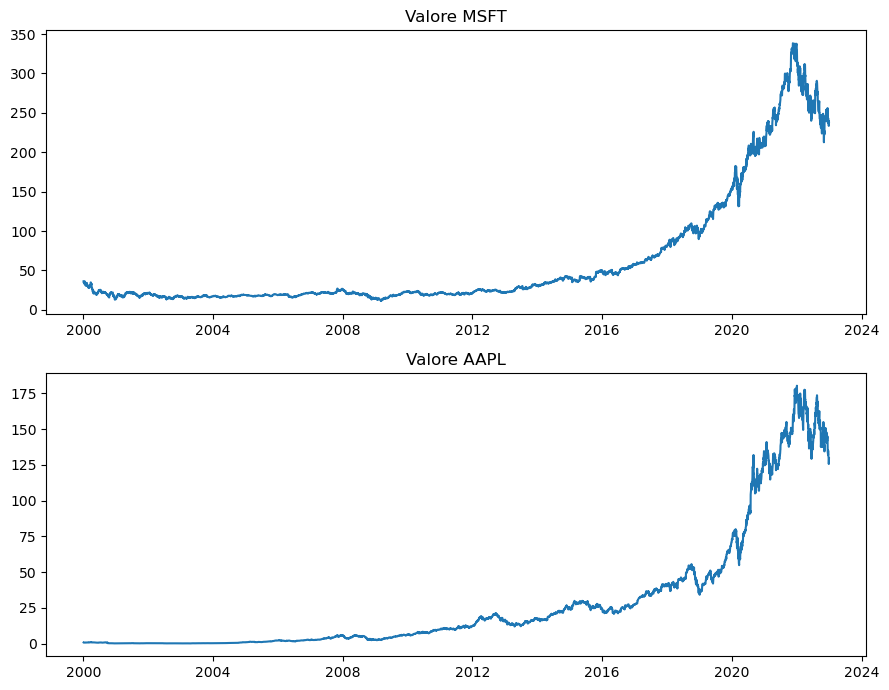

In [5]:
# Figura 1 MSFT+AAPL
fig, ax = plt.subplots(2, 1, figsize=(9, 7))
ax[0].plot(p_msft)
ax[0].set_title('Valore MSFT')
ax[1].plot(p_apple)
ax[1].set_title('Valore AAPL')
plt.tight_layout()
plt.show()

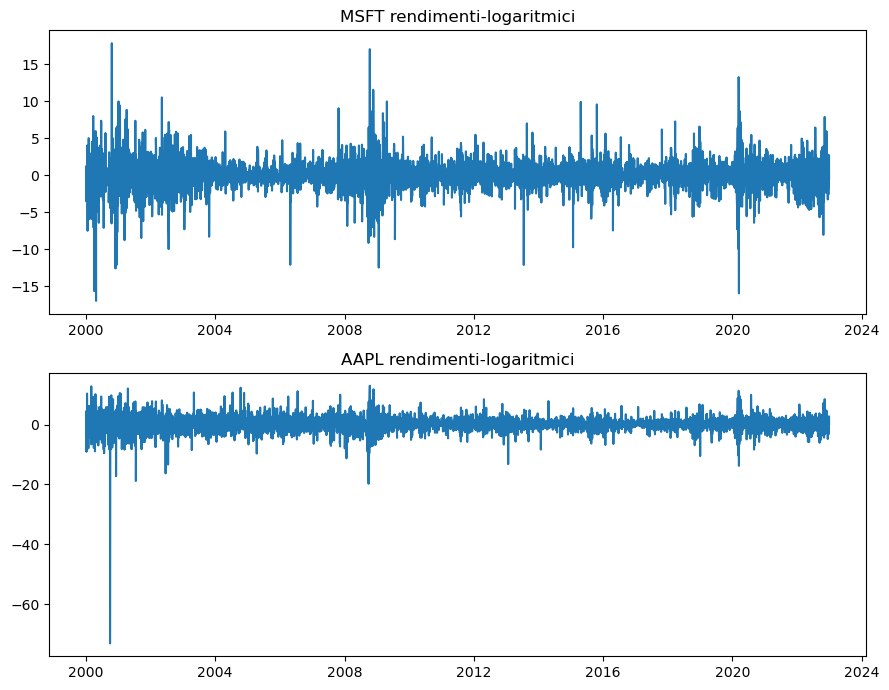

In [6]:
# Figura 2 MSFT+AAPL
fig, ax = plt.subplots(2, 1, figsize=(9, 7))
ax[0].plot(r_msft)
ax[0].set_title('MSFT rendimenti-logaritmici')
ax[1].plot(r_apple)
ax[1].set_title('AAPL rendimenti-logaritmici')
plt.tight_layout()
plt.show()

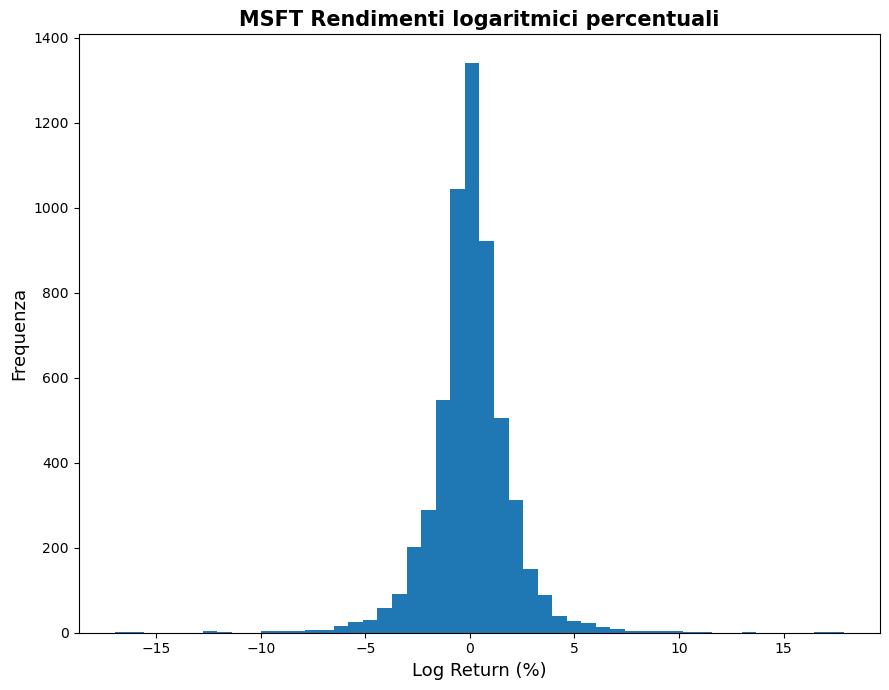

In [7]:
# Figura 1 MSFT
plt.figure(figsize=(9, 7))
plt.hist(r_msft, 50)
plt.xlabel('Log Return (%)', fontsize=13)
plt.ylabel('Frequenza', fontsize=13)
plt.title('MSFT Rendimenti logaritmici percentuali',fontsize=15, weight = 'bold')
plt.tight_layout()
plt.show()

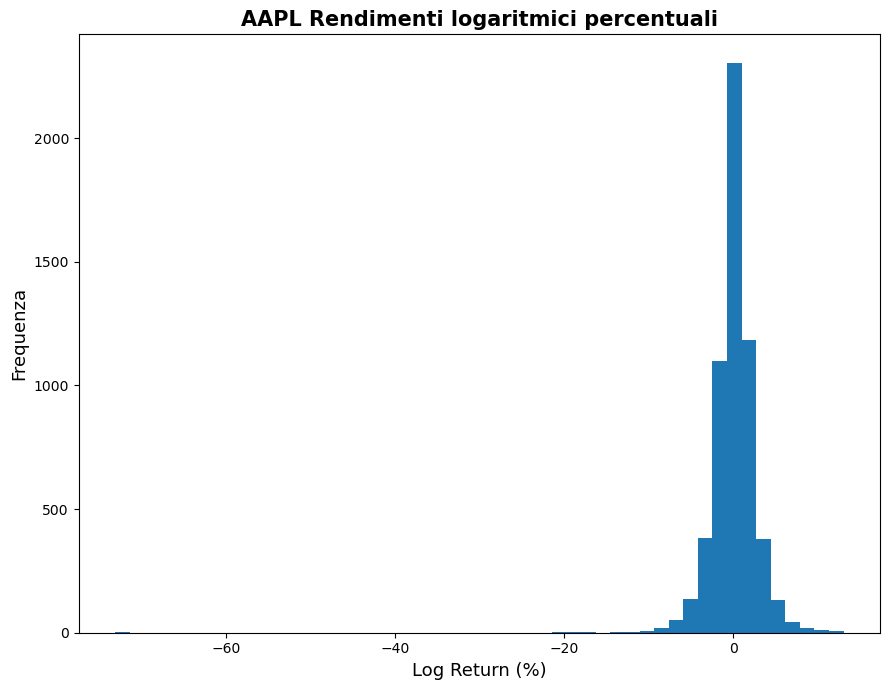

In [8]:
# Figura 1 AAPL
plt.figure(figsize=(9, 7))
plt.hist(r_apple, 50)
plt.xlabel('Log Return (%)', fontsize=13)
plt.ylabel('Frequenza', fontsize=13)
plt.title('AAPL Rendimenti logaritmici percentuali',fontsize=15, weight = 'bold')
plt.tight_layout()
plt.show()

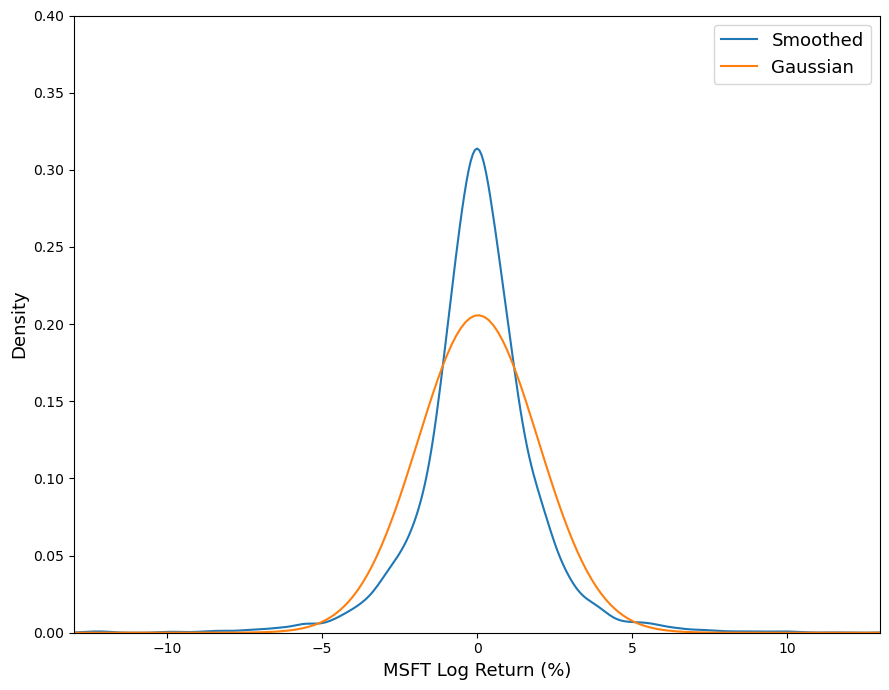

In [9]:
# Figura 2 MSFT
plt.figure(figsize=(9, 7))
r_msft.plot.kde(label='Smoothed')
x = np.linspace(-15, 15, 200)
f = lambda x: stats.norm.pdf(x, loc=r_msft.mean(), scale=r_msft.std())
plt.plot(x, f(x), label='Gaussian')
plt.axis([-13, 13, 0, 0.4])
plt.xlabel('MSFT Log Return (%)', fontsize=13)
plt.ylabel('Density', fontsize=13)
plt.legend(fontsize=13)
plt.tight_layout()
plt.show()

In [10]:
# Jarque-Bera test MSFT, per verificare se segue una distribuzione normale.
stats.jarque_bera(r_msft)

Jarque_beraResult(statistic=20888.939712133604, pvalue=0.0)

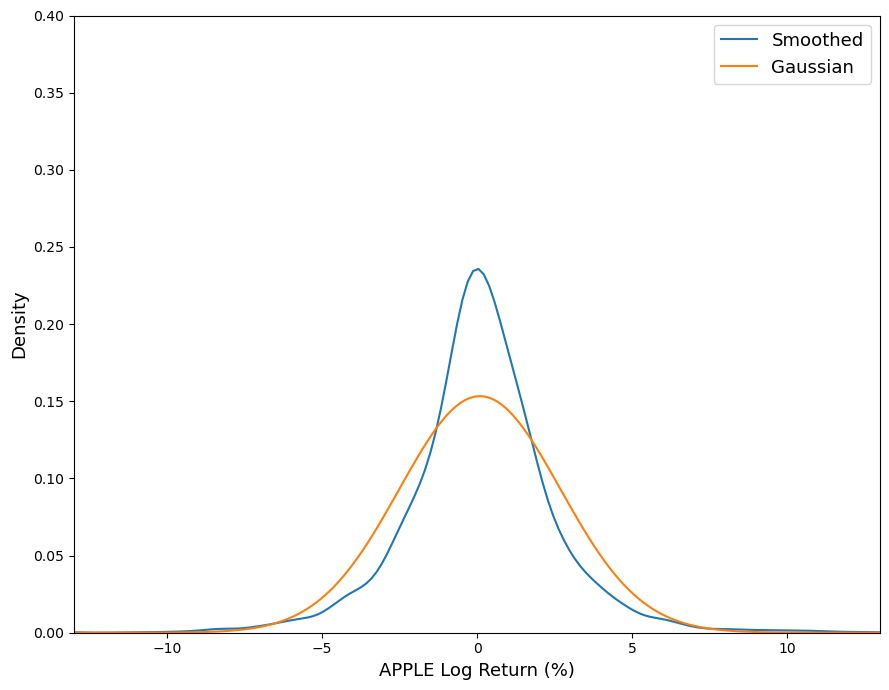

In [11]:
# Figure 2 AAPl
plt.figure(figsize=(9, 7))
r_apple.plot.kde(label='Smoothed')
x = np.linspace(-15, 15, 200)
f = lambda x: stats.norm.pdf(x, loc=r_apple.mean(), scale=r_apple.std())
plt.plot(x, f(x), label='Gaussian')
plt.axis([-13, 13, 0, 0.4])
plt.xlabel('APPLE Log Return (%)', fontsize=13)
plt.ylabel('Density', fontsize=13)
plt.legend(fontsize=13)
plt.tight_layout()
plt.show()

In [12]:
# Jarque-Bera test APPLE, per verificare se segue una distribuzione normale.
stats.jarque_bera(r_apple)

Jarque_beraResult(statistic=3006462.9186174977, pvalue=0.0)

In [13]:
#Summary statistics
def summarise(y):
    print('Mean:      ', np.mean(y))  # Calcola la media dei dati
    print('Median:    ', np.median(y))  # Calcola la mediana dei dati
    print('Stdev:     ', np.std(y))  # Calcola la deviazione standard dei dati
    print('Skewness:  ', stats.skew(y))  # Calcola l'asimmetria dei dati
    print('Kurtosis:  ', stats.kurtosis(y, fisher=False))  # Calcola la curtosi dei dati utilizzando la definizione di Pearson
    # un valore di 3 indica una distribuzione normale, >3 code pesanti, <3 code leggere
    print('Min:       ', np.min(y))  # Restituisce il valore minimo dei dati
    print('Max:       ', np.max(y))  # Restituisce il valore massimo dei dati

In [14]:
summarise(r_msft)

Mean:       0.032559194846787515
Median:     0.03471825308463128
Stdev:      1.9385992300783208
Skewness:   -0.15772259912822845
Kurtosis:   12.303044237718339
Min:        -16.957665321661164
Max:        17.869202125534667


In [15]:
summarise(r_apple)

Mean:       0.08688614501689503
Median:     0.08682567736595925
Stdev:      2.601906610060296
Skewness:   -3.9861514155840094
Kurtosis:   114.38707349573477
Min:        -73.12480957953815
Max:        13.019405390635086


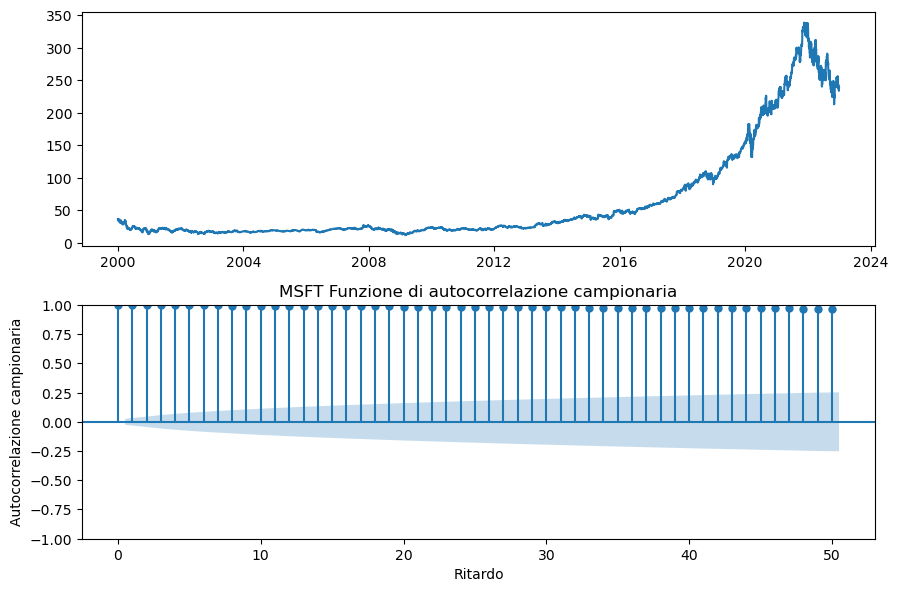

In [16]:
# Figura 3 MSFT
fig, ax = plt.subplots(2, 1, figsize=(9, 6))
ax[0].plot(p_msft)
sm.graphics.tsa.plot_acf(p_msft, ax=ax[1], lags=50, alpha=0.05)
ax[1].set_xlabel('Ritardo')
ax[1].set_ylabel('Autocorrelazione campionaria')
ax[1].set_title('MSFT Funzione di autocorrelazione campionaria')
plt.tight_layout()
plt.show()

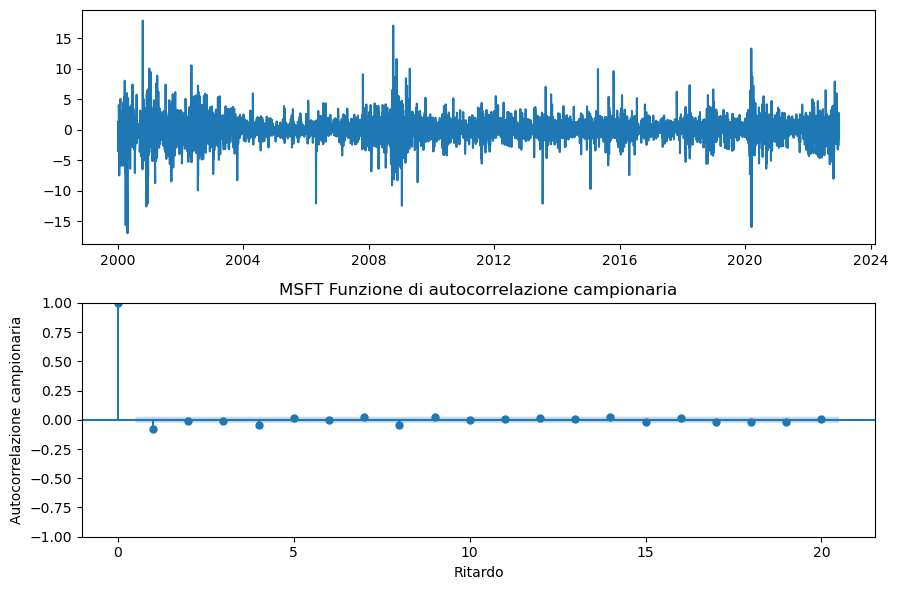

In [17]:
# Figura 4 MSFT
fig, ax = plt.subplots(2, 1, figsize=(9, 6))
ax[0].plot(r_msft)
sm.graphics.tsa.plot_acf(r_msft, ax=ax[1], lags=20, alpha=0.05)
ax[1].set_xlabel('Ritardo')
ax[1].set_ylabel('Autocorrelazione campionaria')
ax[1].set_title('MSFT Funzione di autocorrelazione campionaria')
plt.tight_layout()
plt.show()

In [18]:
## Ljung-Box test MSFT. NH is no autocorrelation; strongly rejected.
from statsmodels.stats.diagnostic import acorr_ljungbox
print( "Ljung-Box Q-statistic:" )
for p in [ 5, 10, 15 ]:
    Qstat, pValue = acorr_ljungbox( r_msft, lags=[p], return_df = False )
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print()    

Ljung-Box Q-statistic:
maxlag: 5. Q-stat: 49.800070. P-value: 0.000000
maxlag: 10. Q-stat: 69.107875. P-value: 0.000000
maxlag: 15. Q-stat: 76.892705. P-value: 0.000000



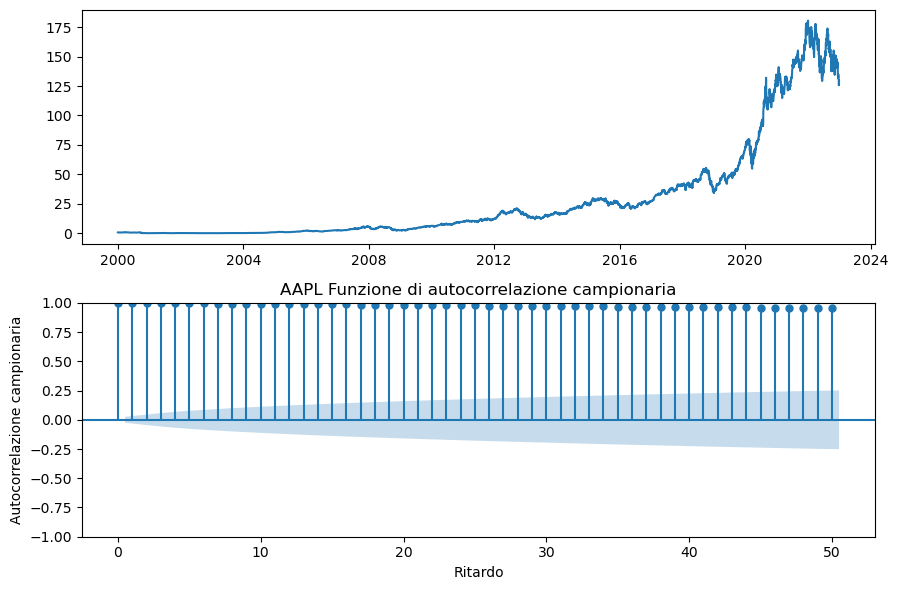

In [19]:
# Figura 3 AAPL
fig, ax = plt.subplots(2, 1, figsize=(9, 6))
ax[0].plot(p_apple)
sm.graphics.tsa.plot_acf(p_apple, ax=ax[1], lags=50, alpha=0.05)
ax[1].set_xlabel('Ritardo')
ax[1].set_ylabel('Autocorrelazione campionaria')
ax[1].set_title('AAPL Funzione di autocorrelazione campionaria')
plt.tight_layout()
plt.show()

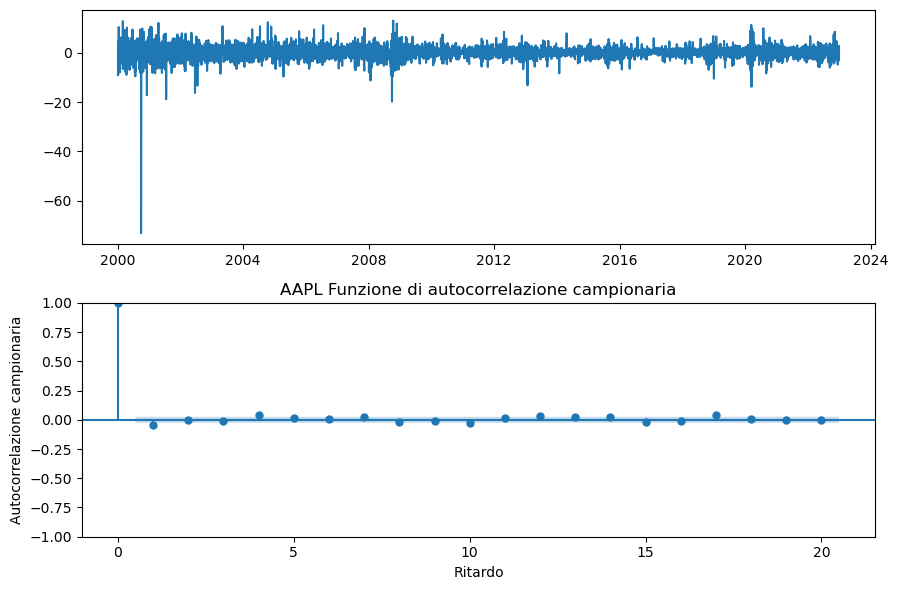

In [20]:
# Figura 4 MSFT
fig, ax = plt.subplots(2, 1, figsize=(9, 6))
ax[0].plot(r_apple)
sm.graphics.tsa.plot_acf(r_apple, ax=ax[1], lags=20, alpha=0.05)
ax[1].set_xlabel('Ritardo')
ax[1].set_ylabel('Autocorrelazione campionaria')
ax[1].set_title('AAPL Funzione di autocorrelazione campionaria')
plt.tight_layout()
plt.show()

In [21]:
## Ljung-Box test APPLE. NH is no autocorrelation; strongly rejected.
from statsmodels.stats.diagnostic import acorr_ljungbox
print( "Ljung-Box Q-statistic:" )
for p in [ 5, 10, 15 ]:
    Qstat, pValue = acorr_ljungbox( r_apple, lags=[p], return_df = False )
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print()    

Ljung-Box Q-statistic:
maxlag: 5. Q-stat: 24.399083. P-value: 0.000182
maxlag: 10. Q-stat: 38.071306. P-value: 0.000037
maxlag: 15. Q-stat: 54.581497. P-value: 0.000002



# Modelli GARCH

### GARCH-N per MSFT

In [22]:
garch1_msft = arch_model(r_msft, vol='GARCH', p=1, q=1, dist='normal')
garch1_msft_fit = garch1_msft.fit( disp= 'off' )
garch1_msft_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:              Adj Close   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -11132.8
Distribution:                  Normal   AIC:                           22273.6
Method:            Maximum Likelihood   BIC:                           22300.3
                                        No. Observations:                 5786
Date:                Tue, Aug 22 2023   Df Residuals:                     5785
Time:                        20:06:31   Df Model:                            1
                                Mean Model                                
==========================================================================
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu             0.0728  1.939e-02      3.755  1.736e-04 [3.480e-02,  0.111]
                             Volatility Model                             
==========================================================================
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
omega          0.0672  3.306e-02      2.032  4.214e-02 [2.385e-03,  0.132]
alpha[1]       0.0808  2.514e-02      3.214  1.309e-03 [3.153e-02,  0.130]
beta[1]        0.9015  3.028e-02     29.769 9.839e-195   [  0.842,  0.961]
==========================================================================

Covariance estimator: robust
"""

Il modello GARCH(1,1) per i dati MSFT può essere riscritto in questo modo:

$$ r_t = 0.0728 + \sigma_t \varepsilon_t \,\, ; \,\, \varepsilon_t \sim N(0,1) \\
\sigma_t^2 = 0.0672 + 0.0808 a_{t-1}^2 + 0.9015 \sigma_{t-1}^2
$$

$\text{Var}(r_t) = \frac{0.0672}{1-(0.0808+0.9015)} = 3.7966$

In [23]:
a0 = garch1_msft_fit.params['omega']    #obtain constant term from conditional vol equation
a1 = garch1_msft_fit.params['alpha[1]'] #obtain coefficient of a(t-1)^2 in cond. vol equation
b1 = garch1_msft_fit.params['beta[1]'] #obtain coefficient of volatility in cond. vol equation

fit_var = a0/(1-a1-b1)
sample_var = r_msft.var()

print( 'Model-based unconditional variance estimate: %g' % fit_var )
print( 'Sample variance: %g' % sample_var )

Model-based unconditional variance estimate: 3.80174
Sample variance: 3.75882


In [24]:
# volatility persistence
a1+b1

0.9823265371899501

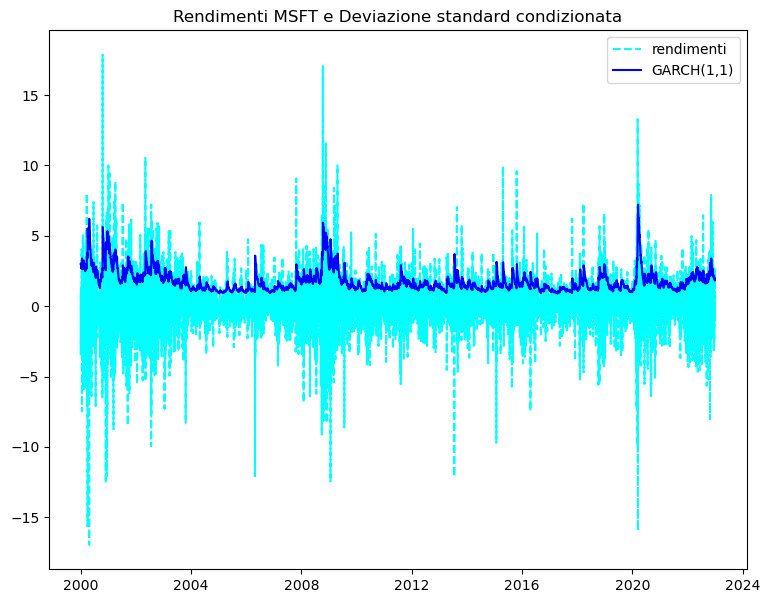

In [25]:
## Vado ad estrarre le deviazioni standard condizionate dal modello creato.
sg1_msft = garch1_msft_fit.conditional_volatility

# Figura 5 MSFT
fig = plt.figure(figsize=(9, 7))
plt.plot( r_msft, color = 'cyan', ls = '--', label = 'rendimenti')
plt.plot( sg1_msft, color = 'b', label = 'GARCH(1,1)')
plt.title( 'Rendimenti MSFT e Deviazione standard condizionata' )
plt.legend()
plt.show()

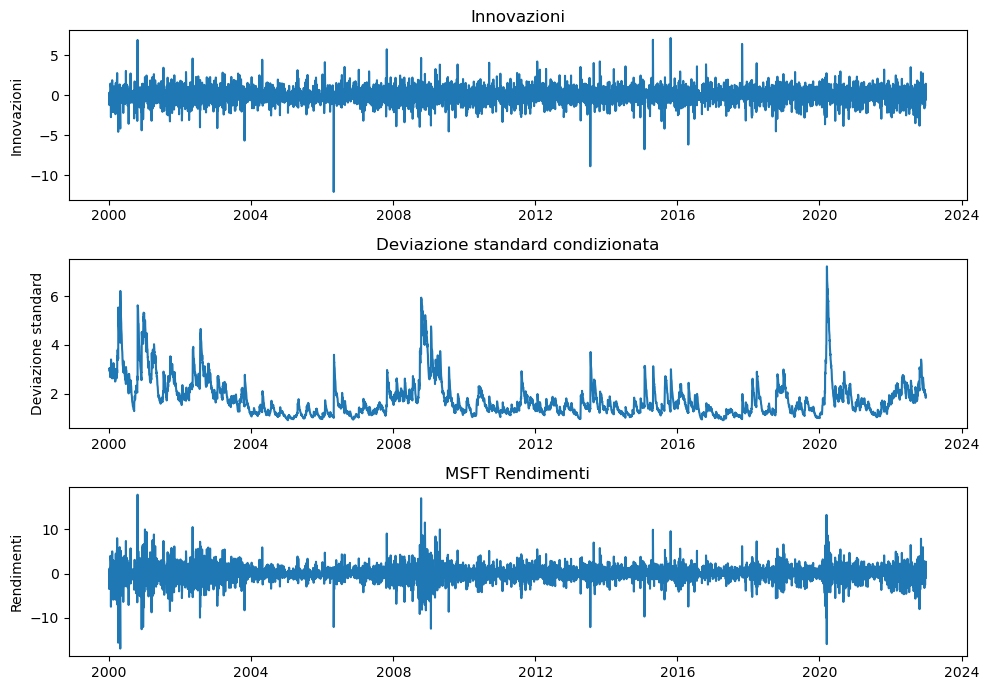

In [26]:
# Figure 6 MSFT
a = garch1_msft_fit.resid
sg1_msft = garch1_msft_fit.conditional_volatility
eg1_msft = garch1_msft_fit.std_resid

fig, ax = plt.subplots(3, 1, figsize=(10, 7))
ax[0].plot(eg1_msft)
ax[0].set_title('Innovazioni')
ax[0].set_ylabel('Innovazioni')
ax[1].plot(sg1_msft)
ax[1].set_title('Deviazione standard condizionata')
ax[1].set_ylabel('Deviazione standard')
ax[2].plot(r_msft)
ax[2].set_title('MSFT Rendimenti')
ax[2].set_ylabel('Rendimenti')
plt.tight_layout()
plt.show()

In [27]:
from statsmodels.stats.diagnostic import acorr_ljungbox
print( "Ljung-Box Q-statistic:" )
for p in [ 7, 12 ]:
    Qstat, pValue = acorr_ljungbox( eg1_msft, lags=[p], model_df=2, return_df = False)
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print()   

Ljung-Box Q-statistic:
maxlag: 7. Q-stat: 13.230913. P-value: 0.021308
maxlag: 12. Q-stat: 24.453288. P-value: 0.006484



In [28]:
print( "Ljung-Box Q-statistic:" )
for p in [ 7, 12 ]:
    Qstat, pValue = acorr_ljungbox( eg1_msft**2, lags=[p], model_df=2, return_df = False)
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print() 

Ljung-Box Q-statistic:
maxlag: 7. Q-stat: 0.784581. P-value: 0.978006
maxlag: 12. Q-stat: 2.613696. P-value: 0.989113



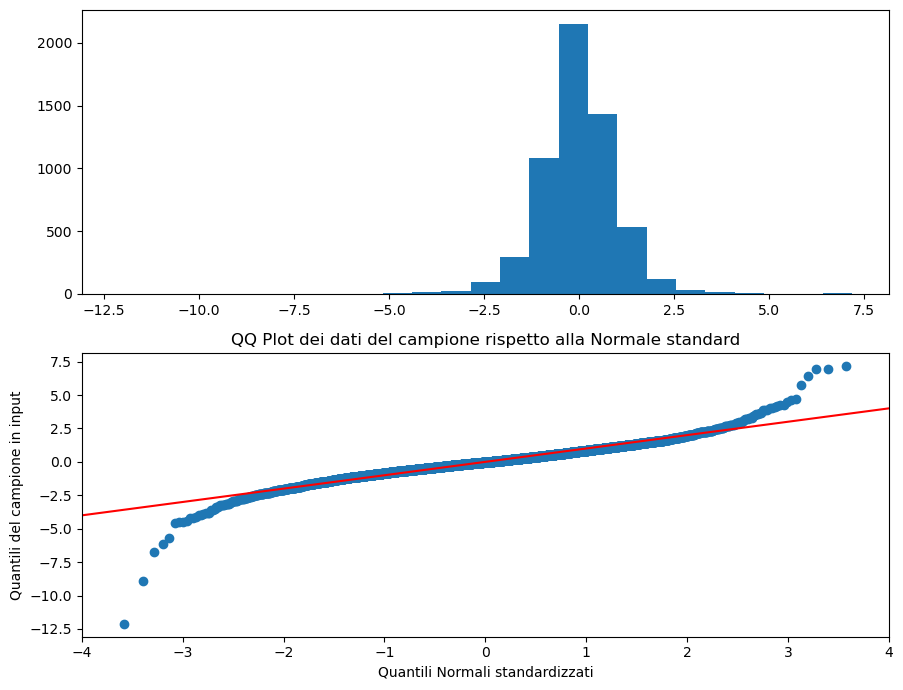

In [29]:
# Figura 7 MSFT
fig, ax = plt.subplots(2, 1, figsize=(9, 7))
ax[0].hist(eg1_msft, bins=25)
sm.qqplot(eg1_msft, ax=ax[1], line='45')
ax[1].set_xlim(-4, 4)
ax[1].set_xlabel('Quantili Normali standardizzati')
ax[1].set_ylabel('Quantili del campione in input')
ax[1].set_title('QQ Plot dei dati del campione rispetto alla Normale standard')
plt.tight_layout()
plt.show()

In [30]:
## Jarque-Bera test
from statsmodels.stats.stattools import jarque_bera
print( 'Skewness: {0:f}'.format( stats.skew( eg1_msft ) ) )
print( 'Kurtosis: {0:f}'.format( stats.kurtosis( eg1_msft ) + 3 ) )
JB_test_stat, JB_pvalue, _, _ = jarque_bera( eg1_msft )
print( 'JB test statistic: {0:f}. P-value {1:f}'.format( JB_test_stat, JB_pvalue ) )
print()

Skewness: -0.301052
Kurtosis: 11.417638
JB test statistic: 17169.751046. P-value 0.000000



### GARCH-N for AAPL

In [31]:
garch1_apple = arch_model(r_apple, vol='GARCH', p=1, q=1, dist='normal')
garch1_apple_fit = garch1_apple.fit( disp= 'off' )
print(garch1_apple_fit.summary())

                     Constant Mean - GARCH Model Results                      
Dep. Variable:              Adj Close   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -12666.6
Distribution:                  Normal   AIC:                           25341.1
Method:            Maximum Likelihood   BIC:                           25367.8
                                        No. Observations:                 5786
Date:                Tue, Aug 22 2023   Df Residuals:                     5785
Time:                        20:06:32   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu             0.1887  2.832e-02      6.661  2.725e-11 [  0.133,  0.24

The GARCH(1,1) model output suggests for AAPL:

$$ r_t = 0.1887 + \sigma_t \varepsilon_t \,\, ; \,\, \varepsilon_t \sim N(0,1) \\
\sigma_t^2 =  0.0897 + 0.1090 a_{t-1}^2 + 0.8847 \sigma_{t-1}^2
$$

$\text{Var}(r_t) = \frac{0.0897 }{1-(0.1090+0.8847)} = 14.238$

In [32]:
a0 = garch1_apple_fit.params['omega']    #obtain constant term from conditional vol equation
a1 = garch1_apple_fit.params['alpha[1]'] #obtain coefficient of a(t-1)^2 in cond. vol equation
b1 = garch1_apple_fit.params['beta[1]'] #obtain coefficient of volatility in cond. vol equation

fit_var = a0/(1-a1-b1)
sample_var = r_apple.var()

print( 'Model-based unconditional variance estimate: %g' % fit_var )
print( 'Sample variance: %g' % sample_var )

Model-based unconditional variance estimate: 14.3298
Sample variance: 6.77109


In [33]:
# volatility persistence
a1+b1

0.9937416853056302

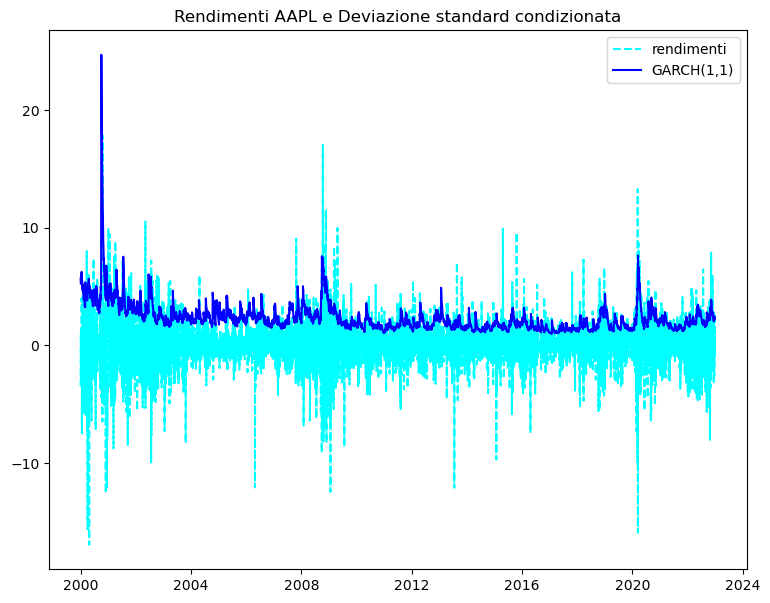

In [34]:
sg1_apple = garch1_apple_fit.conditional_volatility

# Figure 5 AAPL
fig = plt.figure(figsize=(9, 7))
plt.plot( r_msft, color = 'cyan', ls = '--', label = 'rendimenti')
plt.plot( sg1_apple, color = 'b', label = 'GARCH(1,1)')
plt.title( 'Rendimenti AAPL e Deviazione standard condizionata' )
plt.legend()
plt.show()

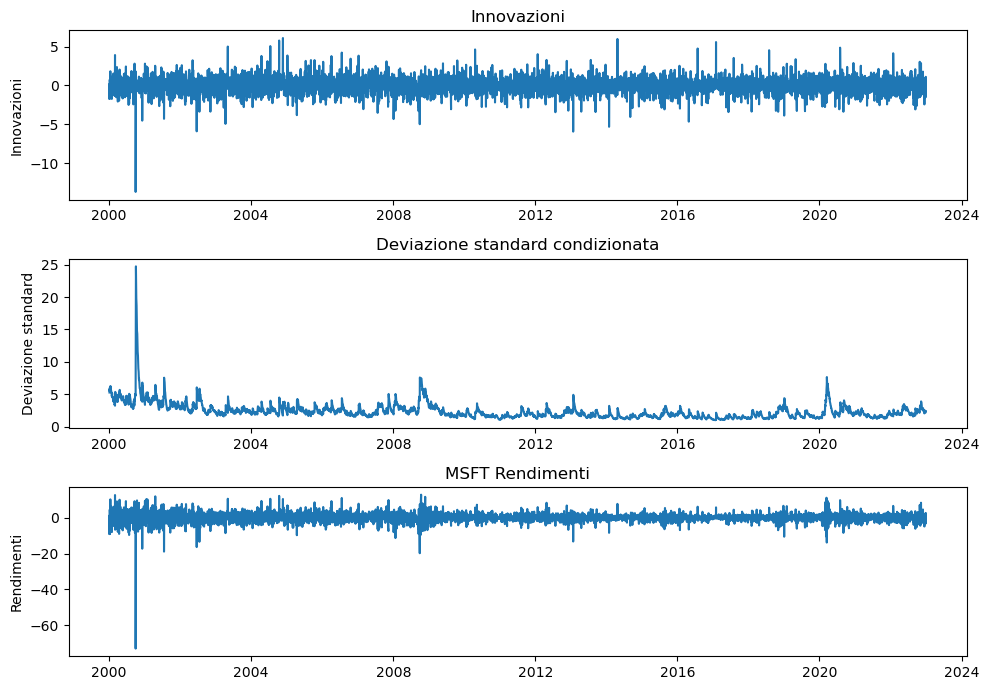

In [35]:
# Figure 6 AAPL
a = garch1_apple_fit.resid
sg1_apple = garch1_apple_fit.conditional_volatility
eg1_apple = garch1_apple_fit.std_resid

fig, ax = plt.subplots(3, 1, figsize=(10, 7))
ax[0].plot(eg1_apple)
ax[0].set_title('Innovazioni')
ax[0].set_ylabel('Innovazioni')
ax[1].plot(sg1_apple)
ax[1].set_title('Deviazione standard condizionata')
ax[1].set_ylabel('Deviazione standard')
ax[2].plot(r_apple)
ax[2].set_title('MSFT Rendimenti')
ax[2].set_ylabel('Rendimenti')
plt.tight_layout()
plt.show()

In [36]:
from statsmodels.stats.diagnostic import acorr_ljungbox
print( "Ljung-Box Q-statistic:" )
for p in [ 7, 12 ]:
    Qstat, pValue = acorr_ljungbox( eg1_apple, lags=[p], model_df=2, return_df = False)
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print()   

Ljung-Box Q-statistic:
maxlag: 7. Q-stat: 10.519677. P-value: 0.061780
maxlag: 12. Q-stat: 18.512596. P-value: 0.046908



In [37]:
from statsmodels.stats.diagnostic import acorr_ljungbox
print( "Ljung-Box Q-statistic:" )
for p in [ 7, 12 ]:
    Qstat, pValue = acorr_ljungbox( eg1_apple**2, lags=[p], model_df=2, return_df = False)
    print('maxlag: {0:d}. Q-stat: {1:f}. P-value: {2:f}'.format( p, Qstat[0], pValue[0] ) )
print()   

Ljung-Box Q-statistic:
maxlag: 7. Q-stat: 3.210014. P-value: 0.667644
maxlag: 12. Q-stat: 5.421089. P-value: 0.861335



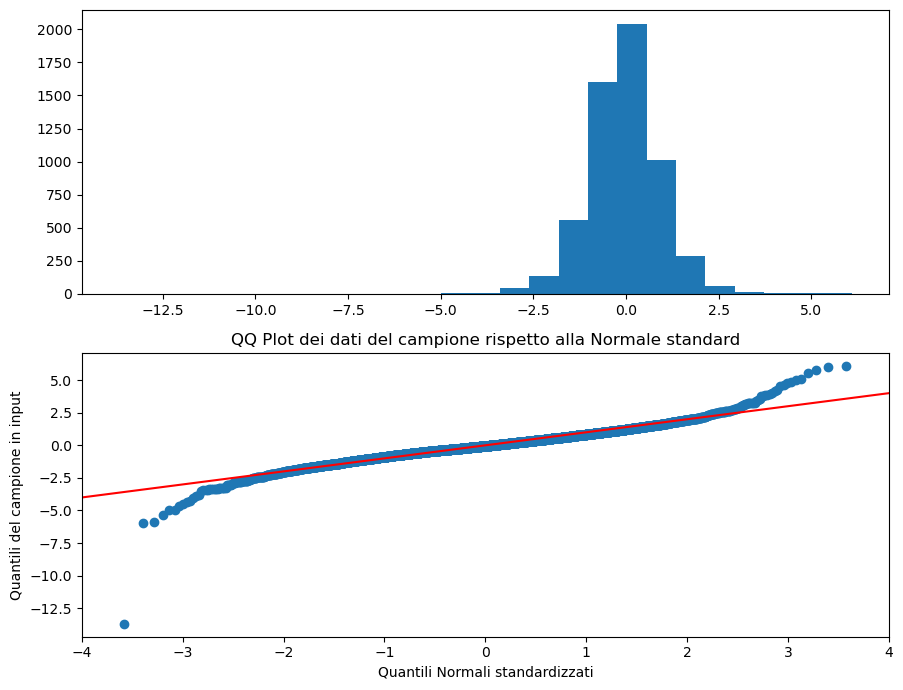

In [38]:
# Figura 7 AAPL
fig, ax = plt.subplots(2, 1, figsize=(9, 7))
ax[0].hist(eg1_apple, bins=25)
sm.qqplot(eg1_apple, ax=ax[1], line='45')
ax[1].set_xlim(-4, 4)
ax[1].set_xlabel('Quantili Normali standardizzati')
ax[1].set_ylabel('Quantili del campione in input')
ax[1].set_title('QQ Plot dei dati del campione rispetto alla Normale standard')
plt.tight_layout()
plt.show()

In [39]:
## Jarque-Bera test
from statsmodels.stats.stattools import jarque_bera
print( 'Skewness: {0:f}'.format( stats.skew( eg1_apple ) ) )
print( 'Kurtosis: {0:f}'.format( stats.kurtosis( eg1_apple ) + 3 ) )
JB_test_stat, JB_pvalue, _, _ = jarque_bera( eg1_apple )
print( 'JB test statistic: {0:f}. P-value {1:f}'.format( JB_test_stat, JB_pvalue ) )
print()

Skewness: -0.361982
Kurtosis: 11.768284
JB test statistic: 18661.518861. P-value 0.000000



## GARCH-t

In [40]:
garch1t_msft = arch_model(r_msft, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT')
garch1t_msft_fit = garch1t_msft.fit( disp= 'off' )
print (garch1t_msft_fit.summary())

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                    Adj Close   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -10730.9
Distribution:      Standardized Student's t   AIC:                           21471.9
Method:                  Maximum Likelihood   BIC:                           21505.2
                                              No. Observations:                 5786
Date:                      Tue, Aug 22 2023   Df Residuals:                     5785
Time:                              20:06:34   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu  

In [41]:
garch1t_apple = arch_model(r_apple, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT')
garch1t_apple_fit = garch1t_msft.fit( disp= 'off' )
print (garch1t_apple_fit.summary())

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                    Adj Close   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -10730.9
Distribution:      Standardized Student's t   AIC:                           21471.9
Method:                  Maximum Likelihood   BIC:                           21505.2
                                              No. Observations:                 5786
Date:                      Tue, Aug 22 2023   Df Residuals:                     5785
Time:                              20:06:34   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu  

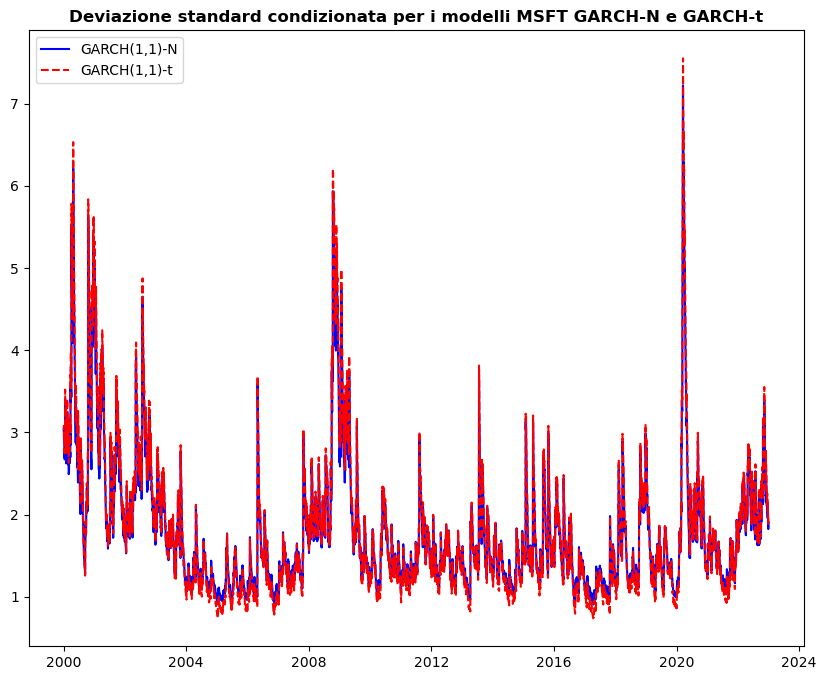

In [42]:
# Confronto per MSFT tra GARCH-N e GARCH-t
sgt_msft = garch1t_msft_fit.conditional_volatility
fig, axs = plt.subplots(1,1, figsize = (10,8))
axs.plot(sg1_msft, c = 'b', label = 'GARCH(1,1)-N')
axs.plot(sgt_msft, c = 'r', label = 'GARCH(1,1)-t', ls ='--')
axs.set_title('Deviazione standard condizionata per i modelli MSFT GARCH-N e GARCH-t', weight = 'bold')
axs.legend()
plt.show()

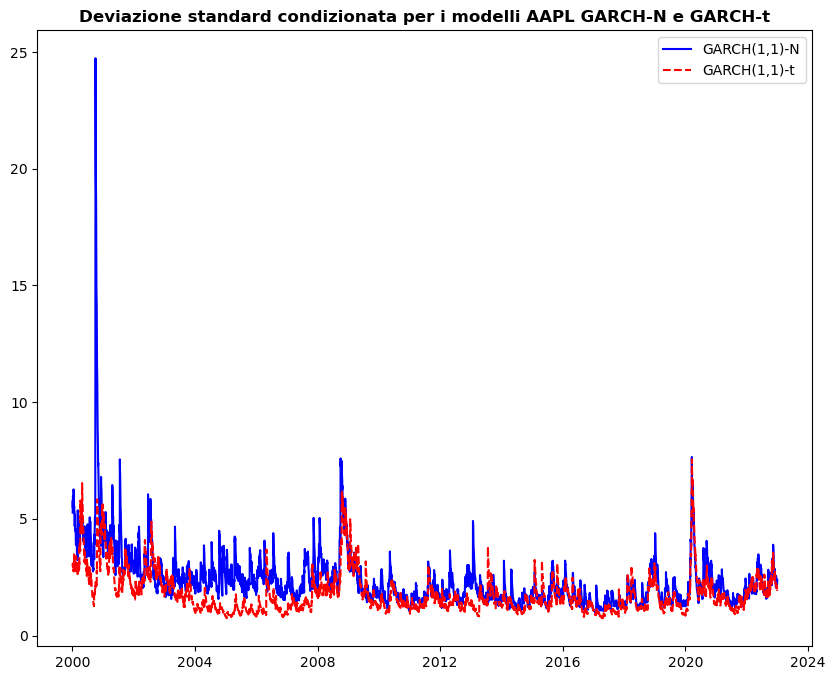

In [43]:
# Confronto per AAPL tra GARCH-N e GARCH-t
sgt_apple = garch1t_apple_fit.conditional_volatility
fig, axs = plt.subplots(1,1, figsize = (10,8))
axs.plot(sg1_apple, c = 'b', label = 'GARCH(1,1)-N')
axs.plot(sgt_apple, c = 'r', label = 'GARCH(1,1)-t', ls ='--')
axs.set_title('Deviazione standard condizionata per i modelli AAPL GARCH-N e GARCH-t', weight = 'bold')
axs.legend()
plt.show()

## VaR and ES per i modelli  GARCH

In [44]:
def VaR_n( p ):
    return stats.norm.ppf( p )
        
def ES_n( p ):
    return -stats.norm.pdf( stats.norm.ppf( p ) ) / p

def VaR_t( p, df ):
    return stats.t.ppf( p, df ) * np.sqrt( ( df - 2 ) / df )

def ES_t( p, df ):
    return -stats.t.pdf( stats.t.ppf( p, df ), df ) / p * ( df + stats.t.ppf( p, df )**2 ) / ( df - 1 ) * np.sqrt( ( df - 2 ) / df )


### MSFT

In [45]:
# Calcolo deviazione standard della volatilità futura per i modelli GARCH-N e GARCH-t
SFgt = np.sqrt( garch1t_msft_fit.forecast( horizon = 1 ).variance.values[-1, 0] ) 
SFgn = np.sqrt( garch1_msft_fit.forecast(horizon = 1).variance.values[-1, 0 ] ) 
print(SFgt.round(3), SFgn.round(3))

1.899 1.837


In [46]:
## Gradi di libertà 
dfgt = garch1t_msft_fit.params['nu']

# Calcolo quantile al livello di confidenza=1%
print(VaR_n(0.01), VaR_t(0.01, dfgt))

-2.3263478740408408 -2.6242568517969547


In [47]:
# Previsioni del VaR 1 passo avanti livello alpha = 0.025, 0.01
VaR1gn = garch1_msft_fit.params['mu'] + VaR_n(0.01) * SFgn
VaR25gn = garch1_msft_fit.params['mu'] + VaR_n(0.025) * SFgn
VaR1gt = garch1t_msft_fit.params['mu'] + VaR_t(0.01, dfgt ) * SFgt
VaR25gt = garch1t_msft_fit.params['mu'] + VaR_t(0.025, dfgt ) * SFgt

# Previsioni dell'ES 1 passo avanti
ES1gn = garch1_msft_fit.params['mu'] + ES_n(0.01) * SFgn
ES25gn = garch1_msft_fit.params['mu'] + ES_n(0.025) * SFgn
ES1gt = garch1t_msft_fit.params['mu'] + ES_t(0.01, dfgt ) * SFgt
ES25gt = garch1t_msft_fit.params['mu'] + ES_t(0.025, dfgt ) * SFgt

In [48]:
print(VaR25gn.round(5), VaR25gt.round(5))

-3.52733 -3.70087


In [49]:
print(ES25gn.round(5), ES25gt.round(5))

-4.22136 -5.17825


In [50]:
print(VaR1gn.round(5), VaR1gt.round(5))

-4.20032 -4.91584


In [51]:
print(ES1gn.round(5), ES1gt.round(5))

-4.82276 -6.63924


### AAPL

In [52]:
# Calcolo deviazione standard della volatilità futura per i modelli GARCH-N e GARCH-t
SFgt = np.sqrt( garch1t_apple_fit.forecast( horizon = 1 ).variance.values[-1, 0] ) 
SFgn = np.sqrt( garch1_apple_fit.forecast(horizon = 1).variance.values[-1, 0 ] ) 
print(SFgt.round(3), SFgn.round(3))

1.899 2.264


In [53]:
## Gradi di libertà 
dfgt = garch1t_apple_fit.params['nu']

# Calcolo al livello di confidenza=1%
print(VaR_n(0.01), VaR_t(0.01, dfgt))

-2.3263478740408408 -2.6242568517969547


In [54]:
# Previsioni del VaR 1 passo avanti livello alpha = 0.025, 0.01
VaR1gn = garch1_apple_fit.params['mu'] + VaR_n(0.01) * SFgn
VaR25gn = garch1_apple_fit.params['mu'] + VaR_n(0.025) * SFgn
VaR1gt = garch1t_apple_fit.params['mu'] + VaR_t(0.01, dfgt ) * SFgt
VaR25gt = garch1t_apple_fit.params['mu'] + VaR_t(0.025, dfgt ) * SFgt

# Previsioni dell'ES 1 passo avanti
ES1gn = garch1_apple_fit.params['mu'] + ES_n(0.01) * SFgn
ES25gn = garch1_apple_fit.params['mu'] + ES_n(0.025) * SFgn
ES1gt = garch1t_apple_fit.params['mu'] + ES_t(0.01, dfgt ) * SFgt
ES25gt = garch1t_apple_fit.params['mu'] + ES_t(0.025, dfgt ) * SFgt

In [55]:
print(VaR25gn.round(5), VaR25gt.round(5))

-4.24853 -3.70087


In [56]:
print(ES25gn.round(5), ES25gt.round(5))

-5.10392 -5.17825


In [57]:
print(VaR1gn.round(5), VaR1gt.round(5))

-5.07799 -4.91584


In [58]:
print(ES1gn.round(5), ES1gt.round(5))

-5.84515 -6.63924


    
   ## Divisione dataset

In [59]:
# Vado ad impostare le previsioni così da considerare gli ultimi 1000 giorni della serie di dati.
last_in = '2019-01-11'
frst_fc = '2019-01-12'
r_msft[frst_fc:]

Date
2019-01-14   -0.732256
2019-01-15    2.859281
2019-01-16    0.351710
2019-01-17    0.699767
2019-01-18    1.487199
                ...   
2022-12-23    0.226453
2022-12-27   -0.744182
2022-12-28   -1.030790
2022-12-29    2.725490
2022-12-30   -0.494970
Name: Adj Close, Length: 1000, dtype: float64

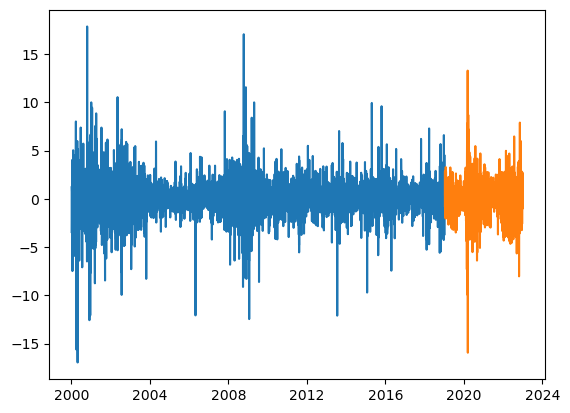

In [60]:
plt.plot(r_msft[:last_in])
plt.plot(r_msft[frst_fc:], label='Forecasting Period')

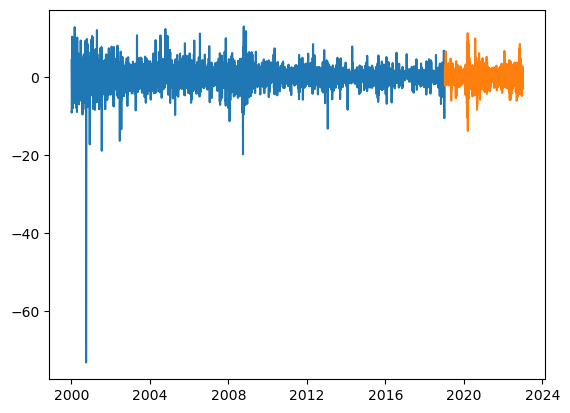

In [61]:
plt.plot(r_apple[:last_in])
plt.plot(r_apple[frst_fc:], label='Forecasting Period')

In [62]:
# Test copertura incondizionata
def uctest(hit, a):
    n = len(hit)
    p = np.sum(hit) / n
    z = (p - a) / np.sqrt(a * (1 - a) / n)
    pval = 2 * stats.norm.sf(np.abs(z))
    return pval, p

# Test indipendenza
def indtest(hits):
    n = len(hits)

    r5 = hits.values[1:]
    r51 = hits.values[:-1]
    i11 = r5*r51
    i01 = r5*(1-r51)
    i10 = (1-r5)*r51
    i00 = (1-r5)*(1-r51)

    t00 = np.sum(i00)
    t01 = np.sum(i01)
    t10 = np.sum(i10)
    t11 = np.sum(i11)
    p01 = t01/(t00+t01)
    p11 = t11/(t10+t11)
    p1 = (t01+t11)/n

    ll1 = t00 * np.log(1-p01) + (p01>0) * t01 * np.log(p01) + t10 * np.log(1-p11)
    if p11>0:
        ll1=ll1+t11*np.log(p11)
  
    ll0=(t10+t00)*np.log(1-p1)+(t01+t11)*np.log(p1)

    lrind=2*(ll1-ll0)
    pcc=1-stats.chi2.cdf(lrind,1)
    return pcc, lrind

# Dynamic quantile test
def dqtest(y,f,a,lag):
    n = len(y)
    hits = ((y<f)*1)*(1-a)
    hits = (hits)*1+(y>f)*(-a)
    q=2+lag
    
    if np.sum((y<f)*1) > 0:
        ns = n - lag
        xmat = np.column_stack([np.ones((ns,1)), f[lag:n+1]])
        for k in range(1,lag+1):
            lk = lag-k
            xmat = np.column_stack([xmat, hits[lk:n-k]])
    
        hx = np.dot((hits[lag:n+1]), xmat)
        xtx = np.linalg.lstsq(np.matmul(xmat.T, xmat), np.eye(q), rcond = None)[0]
        dq = np.dot(np.dot(hx, xtx), hx.T)
        dq = dq/(a*(1-a))
        pdq = 1 - stats.chi2.cdf(dq,q)
    else:
        pdq = np.nan
        dq = np.nan
    return pdq, dq

# Funzione quantile loss 
def qloss(q,r,p):
    q = np.array(q)
    x1 = r[r > q]
    x2 = r[r < q]
    f1 = q[r > q]
    f2 = q[r < q]
    l = p * np.sum(x1-f1) + (1-p) * np.sum(f2-x2)
    return l

# Verifica accuratezza
def check_var_fc(var_fc, r, p):
    hit = r < var_fc
    n_hit = np.sum(hit)
    pval_uc, p_hat = uctest(hit, p)
    pval_ind = indtest(hit)[0]
    pval_dq = dqtest(r, var_fc, p, 4)[0]
    qtl_loss = qloss(var_fc, r, p)
    return [n_hit, p_hat, p_hat / p, pval_uc, pval_ind, pval_dq, qtl_loss]

# Serie quantile loss 
def qloss_t(q,r,p):
    ql = pd.Series(index=r.index, dtype='float64')
    for t in range(len(r)):
        ql[t] = (r[t]-q[t])
        if r[t]<q[t]:
            ql[t] = ql[t] * (p-1)
        else:
            ql[t] = ql[t] * p
            
    return ql.values

## Modelli GARCH basati sulla divisione del dataset

### Microsoft in-sample

In [63]:
## Stima in-sample

r=r_msft[:last_in]

garch_fit = arch_model(r, mean='Constant', vol='GARCH', p=1, q=1, dist='Normal').fit( disp="off")
garch_t_fit = arch_model(r, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT').fit( disp="off")

# GARCH-N in-sample
mu_g = garch_fit.params['mu']
s_g = garch_fit.conditional_volatility
var25_g_is = mu_g  + s_g * VaR_n(0.025)
var1_g_is = mu_g  + s_g * VaR_n(0.01)
es25_g_is = mu_g  + s_g * ES_n(0.025)
es1_g_is = mu_g  + s_g * ES_n(0.01)

# GARCH-t in-sample
mu_gt = garch_t_fit.params['mu']
s_gt = garch_t_fit.conditional_volatility
var25_gt_is = mu_gt  + s_gt * VaR_t(0.025, garch_t_fit.params['nu'])
var1_gt_is = mu_gt  + s_gt * VaR_t(0.01, garch_t_fit.params['nu'])
es25_gt_is = mu_gt  + s_gt * ES_t(0.025, garch_t_fit.params['nu'])
es1_gt_is = mu_gt  + s_gt * ES_t(0.01, garch_t_fit.params['nu'])

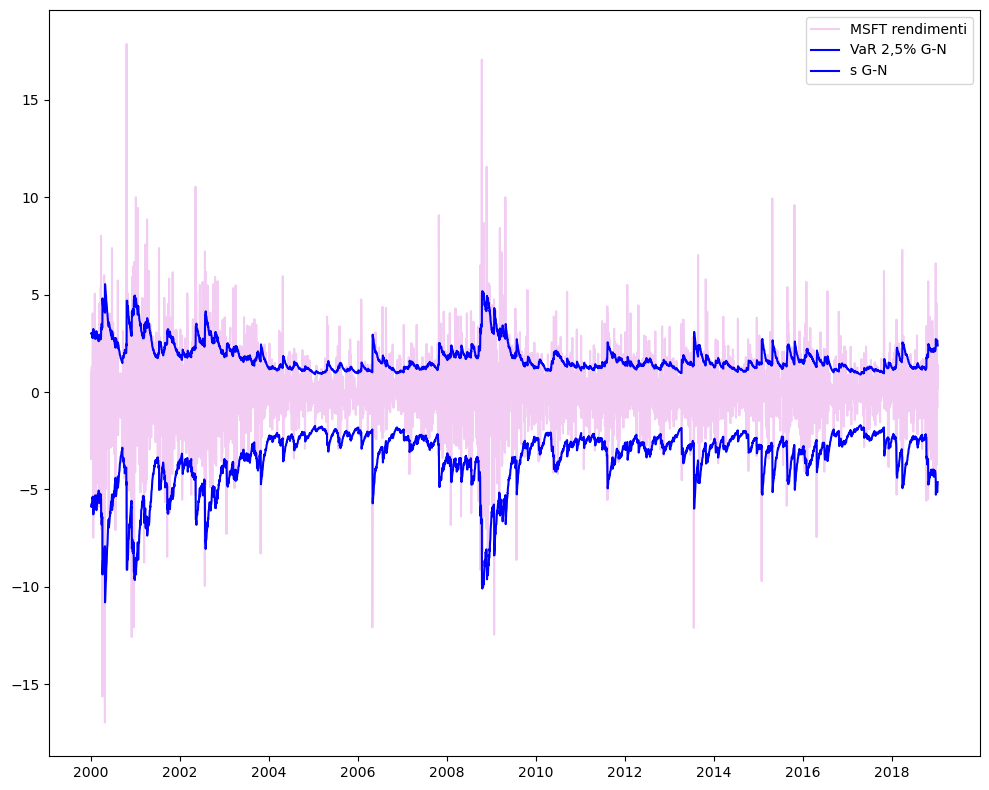

In [64]:
# Figura 8 MSFT
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_g_is, 'b', label='VaR 2,5% G-N')
plt.plot(s_g, 'b', label='s G-N')
plt.legend()
plt.tight_layout()
plt.show()

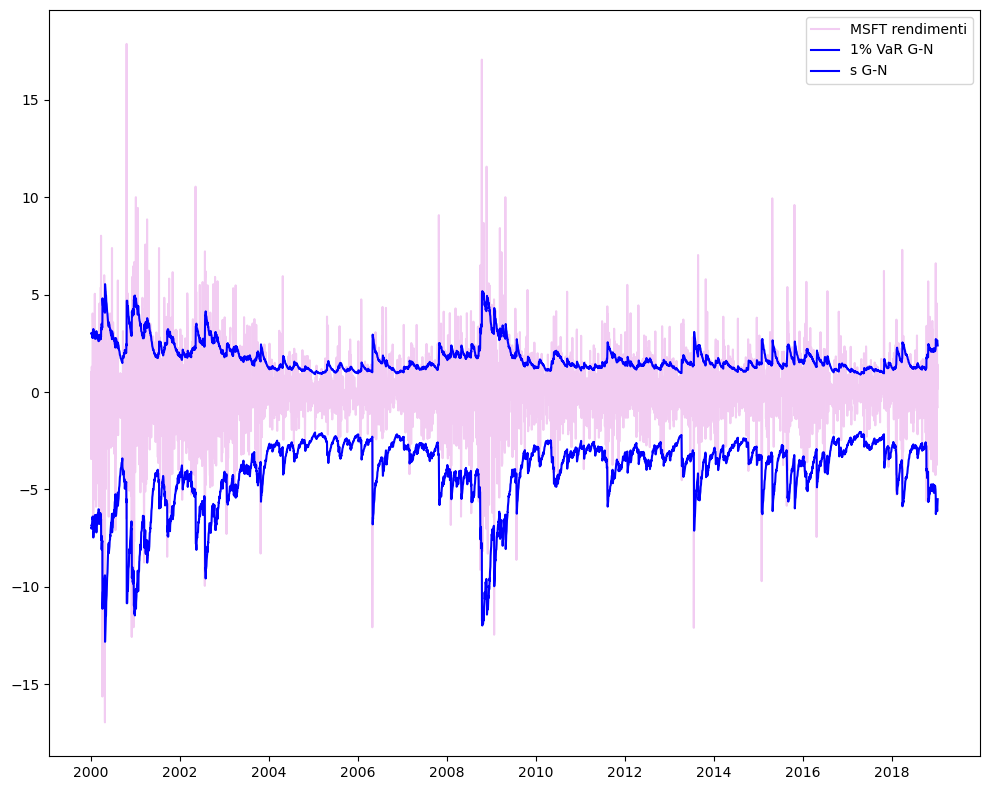

In [65]:
# Figura 9 MSFT
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_g_is, 'b', label='1% VaR G-N')
plt.plot(s_g, 'b', label='s G-N')
plt.legend()
plt.tight_layout()
plt.show()

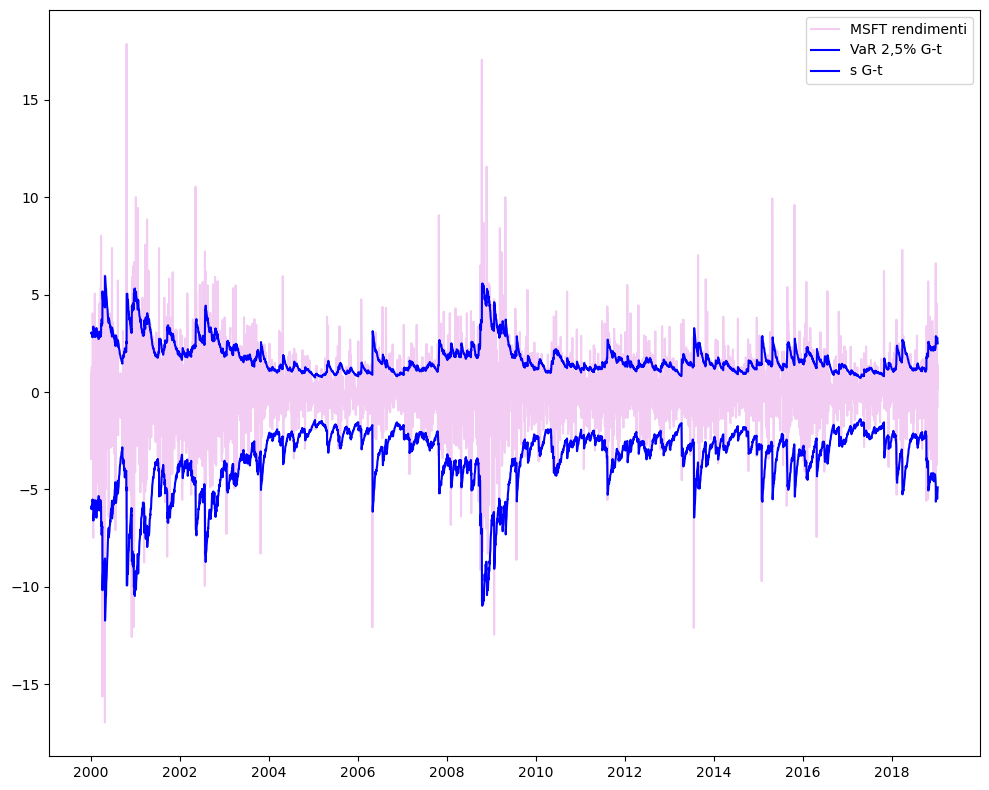

In [66]:
# Figura 10 MSFT
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_gt_is, 'b', label='VaR 2,5% G-t')
plt.plot(s_gt, 'b', label='s G-t')
plt.legend()
plt.tight_layout()
plt.show()

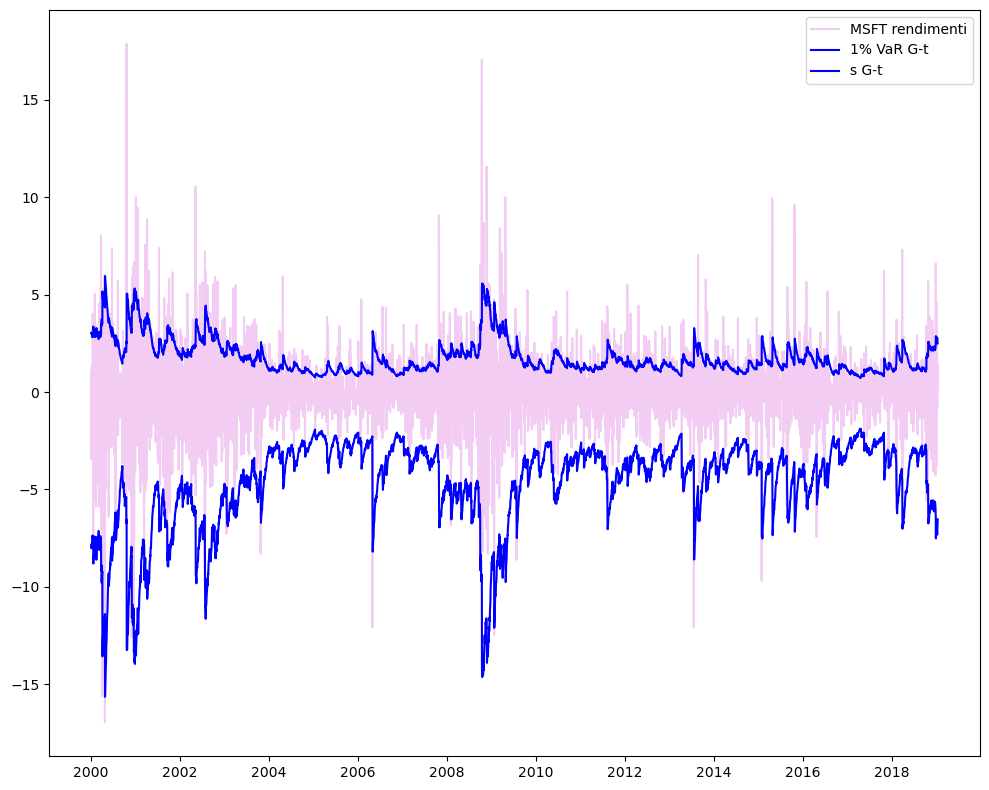

In [67]:
# Figura 11 MSFT
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_gt_is, 'b', label='1% VaR G-t')
plt.plot(s_gt, 'b', label='s G-t')
plt.legend()
plt.tight_layout()
plt.show()

In [68]:
ES_t(0.01, garch_t_fit.params['nu'])/VaR_t(0.01, garch_t_fit.params['nu'])

1.3625476992965726

In [69]:
ES_n(0.01)/VaR_n(0.01)

1.1456645199483257

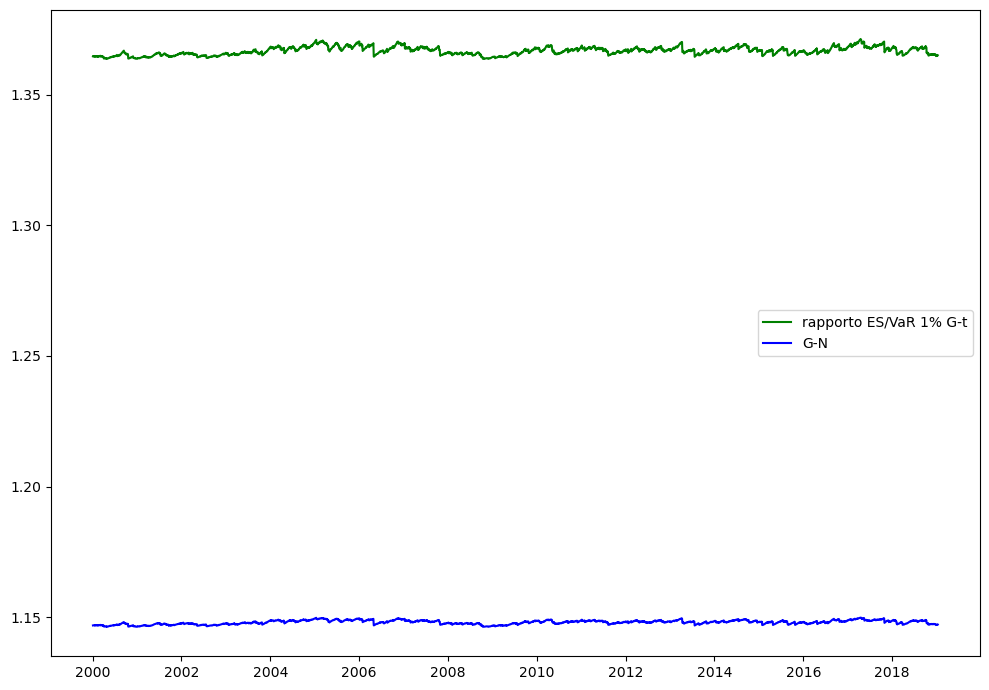

In [70]:
# Figura 12 MSFT
plt.figure(figsize=(10, 7))
plt.plot(es1_gt_is/var1_gt_is, 'g', label='rapporto ES/VaR 1% G-t')
plt.plot(es1_g_is/var1_g_is, 'b', label='G-N')
plt.legend()
plt.tight_layout()
plt.show()

In [71]:
ES_t(0.01, garch_t_fit.params['nu'])-VaR_t(0.01, garch_t_fit.params['nu'])

-0.955295367548743

In [72]:
ES_n(0.01)-VaR_n(0.01)

-0.33886634630496726

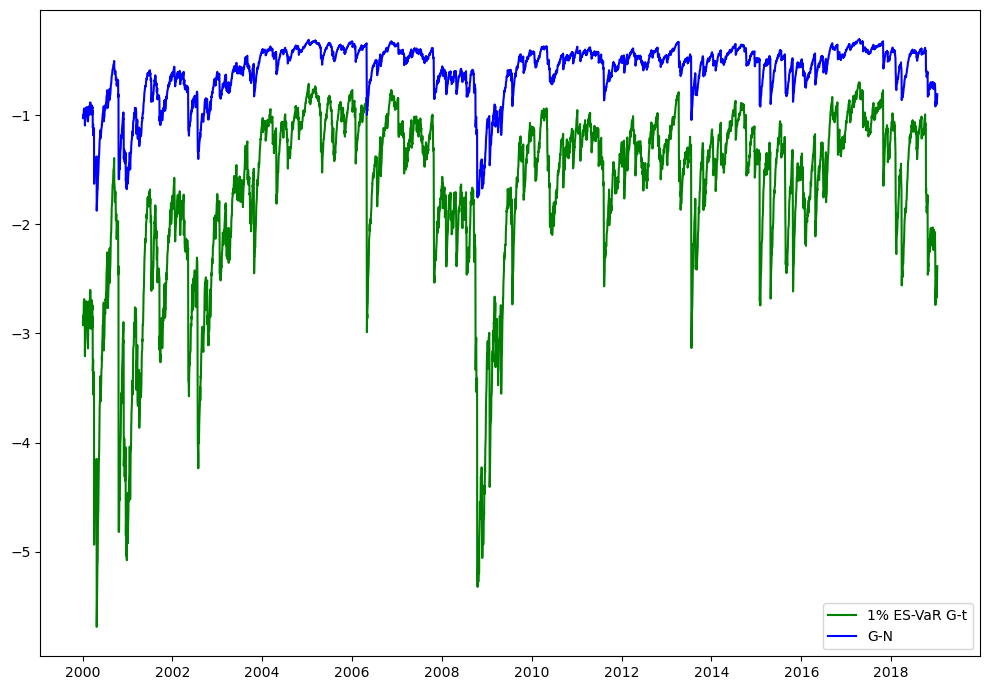

In [73]:
# Figura 13 MSFT
plt.figure(figsize=(10, 7))
plt.plot(es1_gt_is-var1_gt_is, 'g', label='1% ES-VaR G-t')
plt.plot(es1_g_is-var1_g_is, 'b', label='G-N')
plt.legend()
plt.tight_layout()
plt.show()

In [74]:
print(qloss(var25_g_is,r,0.025), qloss(var25_gt_is,r,0.025))
print(qloss(var1_g_is,r,0.01), qloss(var1_gt_is,r,0.01))

588.6955837889176 588.6464923463159
318.19473780141277 313.41824790250666


### Apple in-sample

In [75]:
## Stima in-sample

r=r_apple[:last_in]

garch_fit_a = arch_model(r, mean='Constant', vol='GARCH', p=1, q=1, dist='Normal').fit( disp="off")
garch_t_fit_a = arch_model(r, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT').fit( disp="off")

# GARCH-N in-sample
mu_g_a = garch_fit_a.params['mu']
s_g_a = garch_fit_a.conditional_volatility
var25_g_is_a = mu_g_a  + s_g_a * VaR_n(0.025)
var1_g_is_a = mu_g_a  + s_g_a * VaR_n(0.01)
es25_g_is_a = mu_g_a  + s_g_a * ES_n(0.025)
es1_g_is_a = mu_g_a  + s_g_a * ES_n(0.01)

# GARCH-t in-sample
mu_gt_a = garch_t_fit_a.params['mu']
s_gt_a = garch_t_fit_a.conditional_volatility
var25_gt_is_a = mu_gt_a  + s_gt_a * VaR_t(0.025, garch_t_fit_a.params['nu'])
var1_gt_is_a = mu_gt_a  + s_gt_a * VaR_t(0.01, garch_t_fit_a.params['nu'])
es25_gt_is_a = mu_gt_a  + s_gt_a * ES_t(0.025, garch_t_fit_a.params['nu'])
es1_gt_is_a = mu_gt_a  + s_gt_a * ES_t(0.01, garch_t_fit_a.params['nu'])

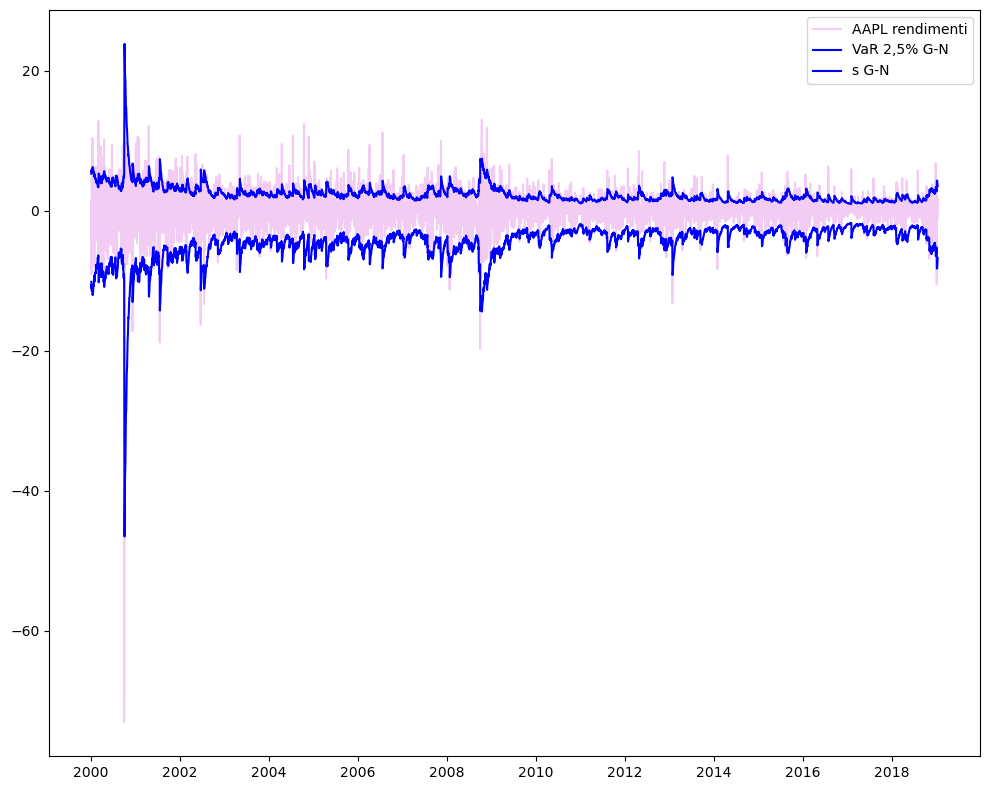

In [76]:
# Figura 8 Apple
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_g_is_a, 'b', label='VaR 2,5% G-N')
plt.plot(s_g_a, 'b', label='s G-N')
plt.legend()
plt.tight_layout()
plt.show()

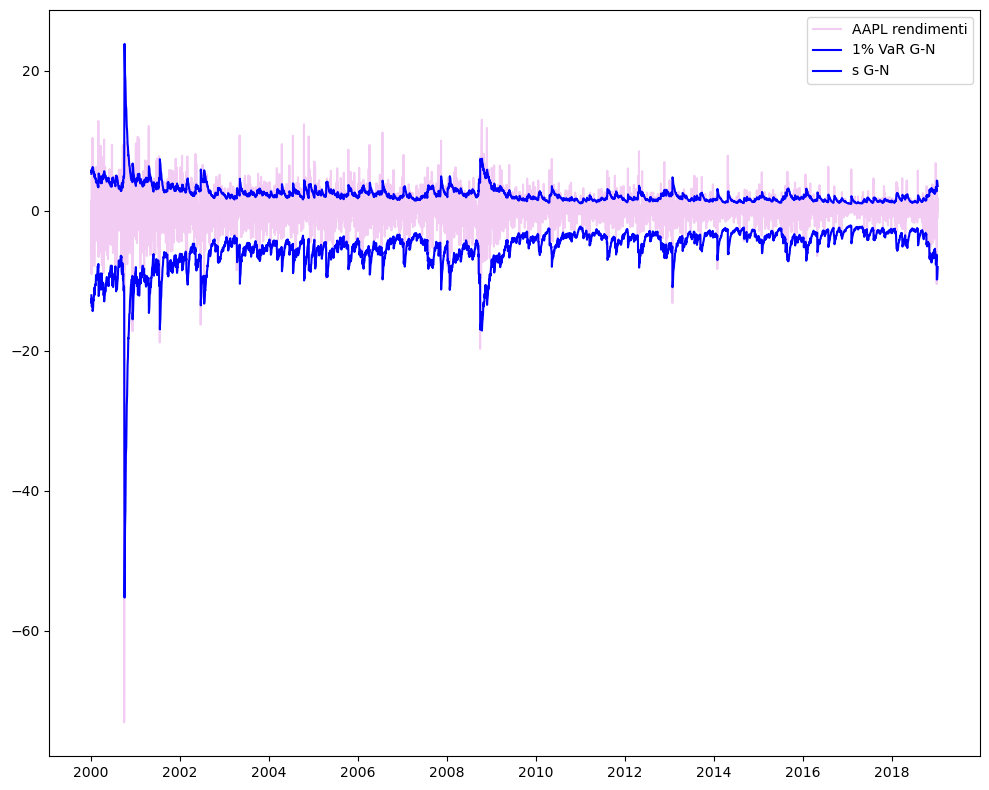

In [77]:
# Figura 9 Apple
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_g_is_a, 'b', label='1% VaR G-N')
plt.plot(s_g_a, 'b', label='s G-N')
plt.legend()
plt.tight_layout()
plt.show()

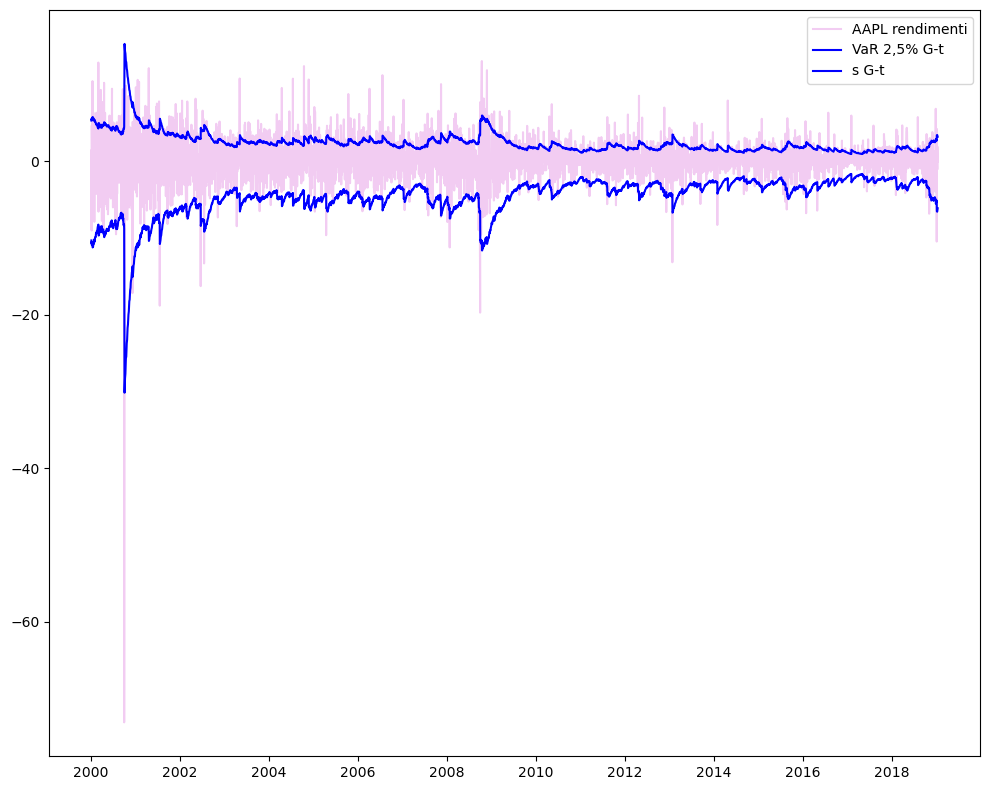

In [78]:
# Figura 10 Apple
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_gt_is_a, 'b', label='VaR 2,5% G-t')
plt.plot(s_gt_a, 'b', label='s G-t')
plt.legend()
plt.tight_layout()
plt.show()

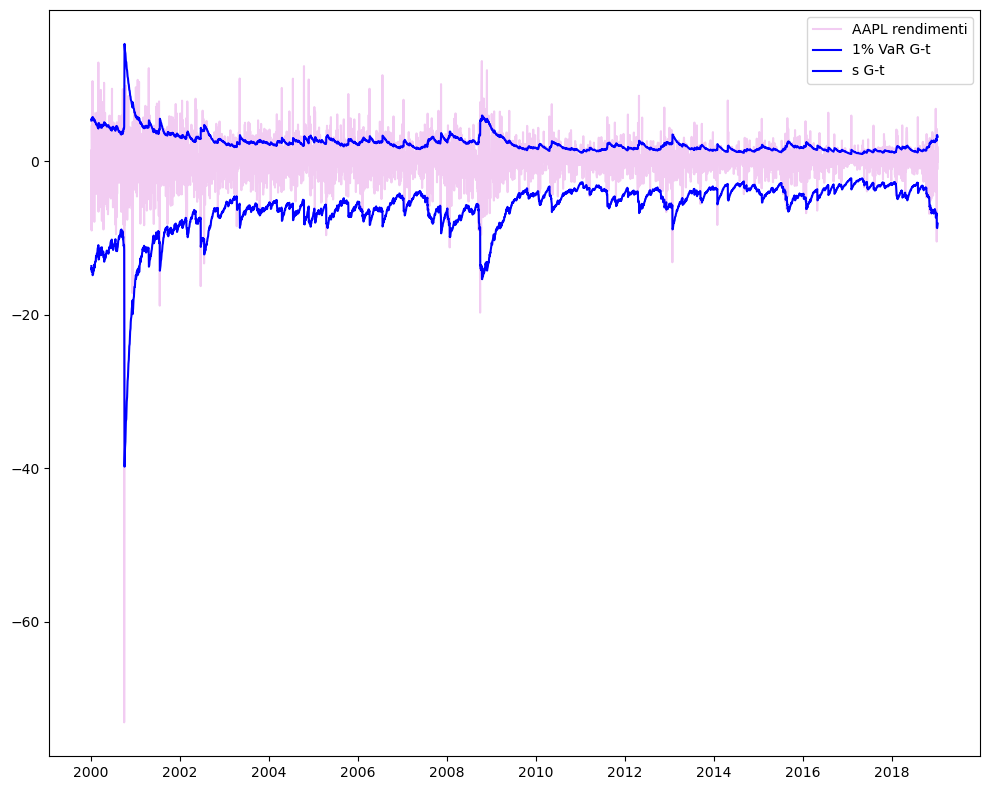

In [79]:
# Figura 11 Apple
plt.figure(figsize=(10, 8))
plt.plot(r, 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_gt_is_a, 'b', label='1% VaR G-t')
plt.plot(s_gt_a, 'b', label='s G-t')
plt.legend()
plt.tight_layout()
plt.show()

In [80]:
ES_t(0.01, garch_t_fit_a.params['nu'])/VaR_t(0.01, garch_t_fit_a.params['nu'])

1.3381163521934911

In [81]:
ES_n(0.01)/VaR_n(0.01)

1.1456645199483257

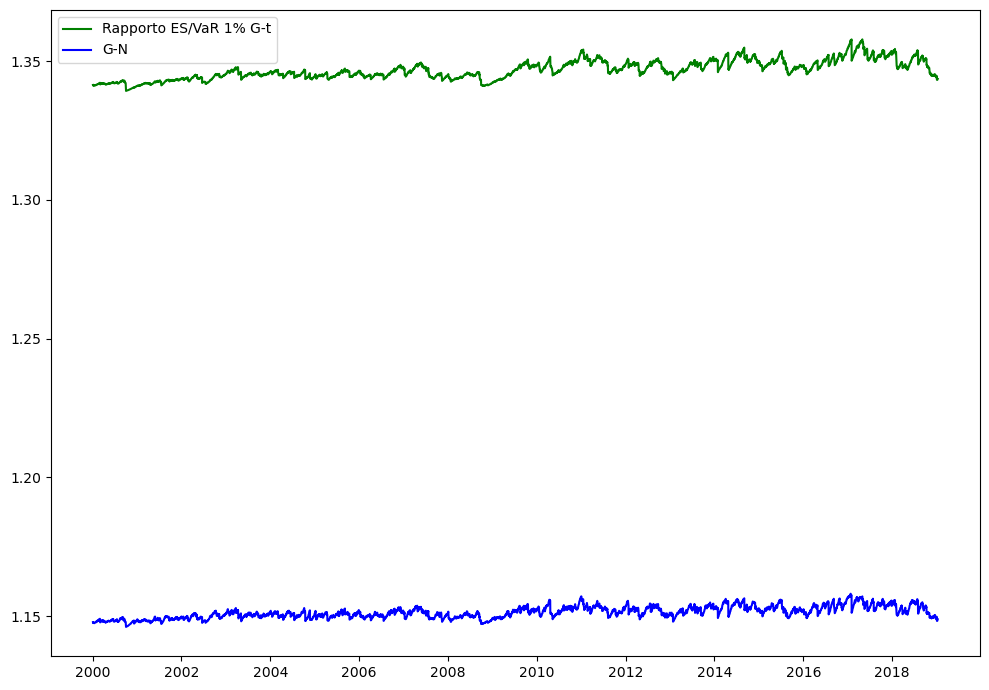

In [82]:
# Figura 12 Apple
plt.figure(figsize=(10, 7))
plt.plot(es1_gt_is_a/var1_gt_is_a, 'g', label='Rapporto ES/VaR 1% G-t')
plt.plot(es1_g_is_a/var1_g_is_a, 'b', label='G-N')
plt.legend()
plt.tight_layout()
plt.show()

In [83]:
ES_t(0.01, garch_t_fit_a.params['nu'])-VaR_t(0.01, garch_t_fit_a.params['nu'])

-0.885383761047287

In [84]:
ES_n(0.01)-VaR_n(0.01)

-0.33886634630496726

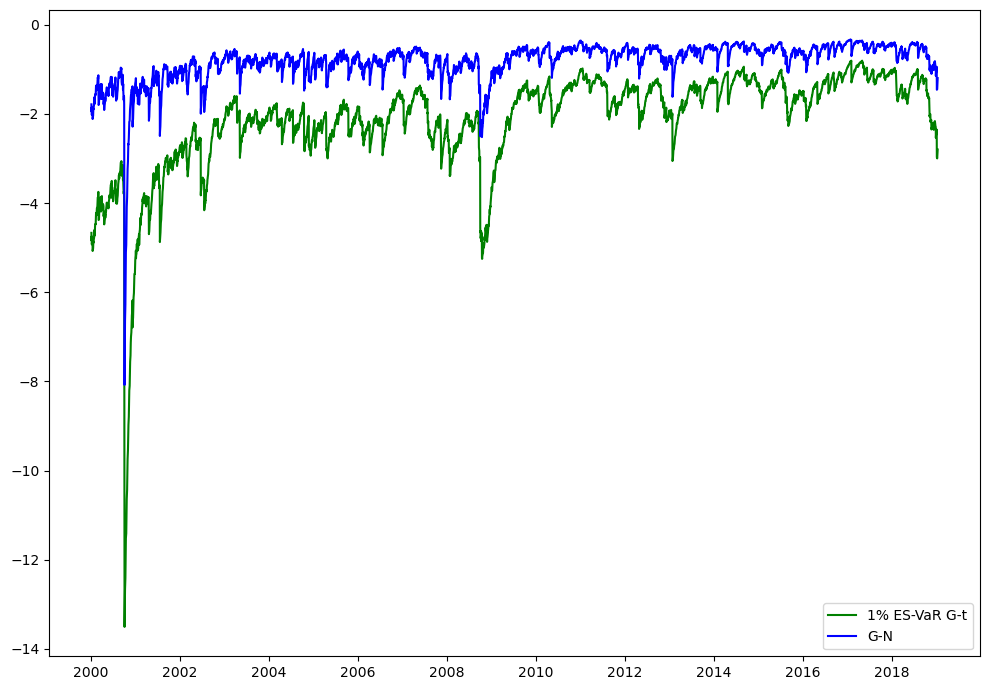

In [85]:
# Figura 13 Apple
plt.figure(figsize=(10, 7))
plt.plot(es1_gt_is_a-var1_gt_is_a, 'g', label='1% ES-VaR G-t')
plt.plot(es1_g_is_a-var1_g_is_a, 'b', label='G-N')
plt.legend()
plt.tight_layout()
plt.show()

In [86]:
print(qloss(var25_g_is_a,r,0.025), qloss(var25_gt_is_a,r,0.025))
print(qloss(var1_g_is_a,r,0.01), qloss(var1_gt_is_a,r,0.01))

813.7624134481786 816.0108211566197
449.8926149736849 452.6413050131924


## Previsioni

### Previsioni MSFT aggiornando i parametri

In [87]:
'''# Previsioni del VaR un passo avanti per MSFT, aggiornando i parametri ogni 10 giorni
n_fore = len(r_msft[frst_fc:])

# VaR
var25_garch = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_garch = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var25_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

# ES
es25_garch = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es1_garch = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es25_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es1_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

# Volatilità
s_garch = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
s_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

# Stima dei g.d.l. per i modelli con errori t
df_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

# Inizializzazione modelli GARCH
garch = arch_model(r_msft, mean='Constant', vol='GARCH', p=1, q=1, dist='Normal')
garch_t = arch_model(r_msft, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT')

n_wind = len(r_msft[:last_in])
for i in tqdm(range(n_fore)):
    if i % 10 == 0:
        garch_fit = garch.fit(first_obs=i, last_obs=i + n_wind, disp="off")
        garch_t_fit = garch_t.fit(first_obs=i, last_obs=i + n_wind, disp="off")
        v0 = np.var(r_msft[i:(i + n_wind)])
        r1 = r_msft[i:(i + n_wind)]
        
    
    # GARCH
    fc = garch_fit.forecast(horizon=1, align='target', reindex=False)
    s = np.sqrt(fc.variance)
    var25 = fc.mean + s * VaR_n(0.025)
    var1 = fc.mean + s * VaR_n(0.01)
    var25_garch[i] = var25.loc[var25_garch.index[i]]
    var1_garch[i] = var1.loc[var1_garch.index[i]]
    es25 = fc.mean + s * ES_n(0.025)
    es1 = fc.mean + s * ES_n(0.01)
    es25_garch[i] = es25.loc[es25_garch.index[i]]
    es1_garch[i] = es1.loc[es1_garch.index[i]]
    s_garch[i] = s.loc[s_garch.index[i]]
    
    # GARCH-t
    fc = garch_t_fit.forecast(horizon=1, align='target', reindex=False)
    s = np.sqrt(fc.variance)
    var25 = fc.mean + s * VaR_t(0.025, garch_t_fit.params['nu'])
    var1 = fc.mean + s * VaR_t(0.01, garch_t_fit.params['nu'])
    var25_garch_t[i] = var25.loc[var25_garch_t.index[i]]
    var1_garch_t[i] = var1.loc[var1_garch_t.index[i]]
    es25 = fc.mean + s * ES_t(0.025, garch_t_fit.params['nu'])
    es1 = fc.mean + s * ES_t(0.01, garch_t_fit.params['nu'])
    es25_garch_t[i] = es25.loc[es25_garch_t.index[i]]
    es1_garch_t[i] = es1.loc[es1_garch_t.index[i]]
    s_garch_t[i] = s.loc[s_garch_t.index[i]]
    df_garch_t[i] = garch_t_fit.params['nu']'''

'# Previsioni del VaR un passo avanti per MSFT, aggiornando i parametri ogni 10 giorni\nn_fore = len(r_msft[frst_fc:])\n\n# VaR\nvar25_garch = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nvar1_garch = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nvar25_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nvar1_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\n\n# ES\nes25_garch = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nes1_garch = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nes25_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\nes1_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\n\n# Volatilità\ns_garch = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\ns_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'float64\')\n\n# Stima dei g.d.l. per i modelli con errori t\ndf_garch_t = pd.Series(index=r_msft[frst_fc:].index, dtype=\'flo

In [88]:
'''# Saving the forecasts and then re-importing them (needed in Sessions 2 and 3)
data_msft_agrm25 = pd.DataFrame({'s_garch': s_garch, 'var25_garch': var25_garch, 'es25_garch': es25_garch,  's_garch_t': s_garch_t, 'var25_garch_t': var25_garch_t, 'es25_garch_t': es25_garch_t}) 
data_msft_agrm25.to_csv("msft_agrm_data25.csv")

data_msft_agrm1 = pd.DataFrame({'var1_garch': var1_garch, 'es1_garch': es1_garch,  'var1_garch_t': var1_garch_t, 'es1_garch_t': es1_garch_t}) 
data_msft_agrm1.to_csv("msft_agrm_data1.csv")'''

'# Saving the forecasts and then re-importing them (needed in Sessions 2 and 3)\ndata_msft_agrm25 = pd.DataFrame({\'s_garch\': s_garch, \'var25_garch\': var25_garch, \'es25_garch\': es25_garch,  \'s_garch_t\': s_garch_t, \'var25_garch_t\': var25_garch_t, \'es25_garch_t\': es25_garch_t}) \ndata_msft_agrm25.to_csv("msft_agrm_data25.csv")\n\ndata_msft_agrm1 = pd.DataFrame({\'var1_garch\': var1_garch, \'es1_garch\': es1_garch,  \'var1_garch_t\': var1_garch_t, \'es1_garch_t\': es1_garch_t}) \ndata_msft_agrm1.to_csv("msft_agrm_data1.csv")'

In [89]:
# Per reimportare i dati 
data_msft_agrm25 = pd.read_csv("msft_agrm_data25.csv", index_col = 'Date')
s_garch = pd.Series(data=data_msft_agrm25.loc[:,'s_garch'].values, index=r_msft[frst_fc:].index, dtype='float64')
s_garch_t = pd.Series(data=data_msft_agrm25.loc[:,'s_garch_t'].values, index=r_msft[frst_fc:].index, dtype='float64')
var25_garch = pd.Series(data=data_msft_agrm25.loc[:,'var25_garch'].values, index=r_msft[frst_fc:].index, dtype='float64')
var25_garch_t = pd.Series(data=data_msft_agrm25.loc[:,'var25_garch_t'].values, index=r_msft[frst_fc:].index, dtype='float64')
es25_garch = pd.Series(data=data_msft_agrm25.loc[:,'es25_garch'].values, index=r_msft[frst_fc:].index, dtype='float64')
es25_garch_t = pd.Series(data=data_msft_agrm25.loc[:,'es25_garch_t'].values, index=r_msft[frst_fc:].index, dtype='float64')

data_msft_agrm1 = pd.read_csv("msft_agrm_data1.csv", index_col = 'Date')
var1_garch = pd.Series(data=data_msft_agrm1.loc[:,'var1_garch'].values, index=r_msft[frst_fc:].index, dtype='float64')
var1_garch_t = pd.Series(data=data_msft_agrm1.loc[:,'var1_garch_t'].values, index=r_msft[frst_fc:].index, dtype='float64')
es1_garch = pd.Series(data=data_msft_agrm1.loc[:,'es1_garch'].values, index=r_msft[frst_fc:].index, dtype='float64')
es1_garch_t = pd.Series(data=data_msft_agrm1.loc[:,'es1_garch_t'].values, index=r_msft[frst_fc:].index, dtype='float64')

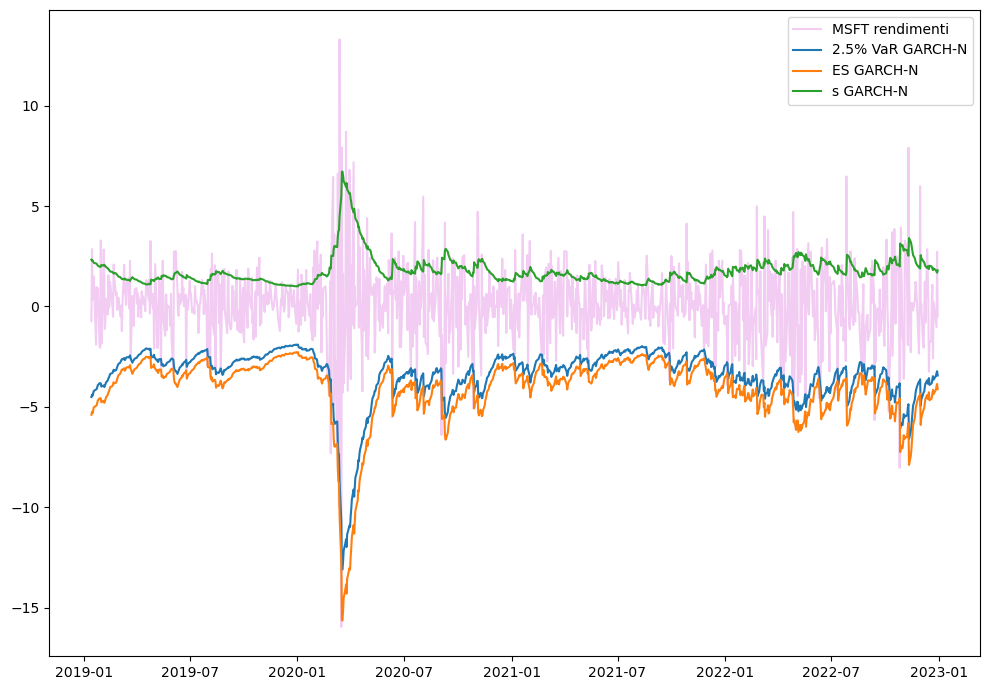

In [90]:
# Figura 14 MSFT
plt.figure(figsize=(10,7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_garch, '-', label='2.5% VaR GARCH-N')
plt.plot(es25_garch, '-', label='ES GARCH-N')
plt.plot(s_garch, '-', label='s GARCH-N')
plt.legend()
plt.tight_layout()
plt.show()

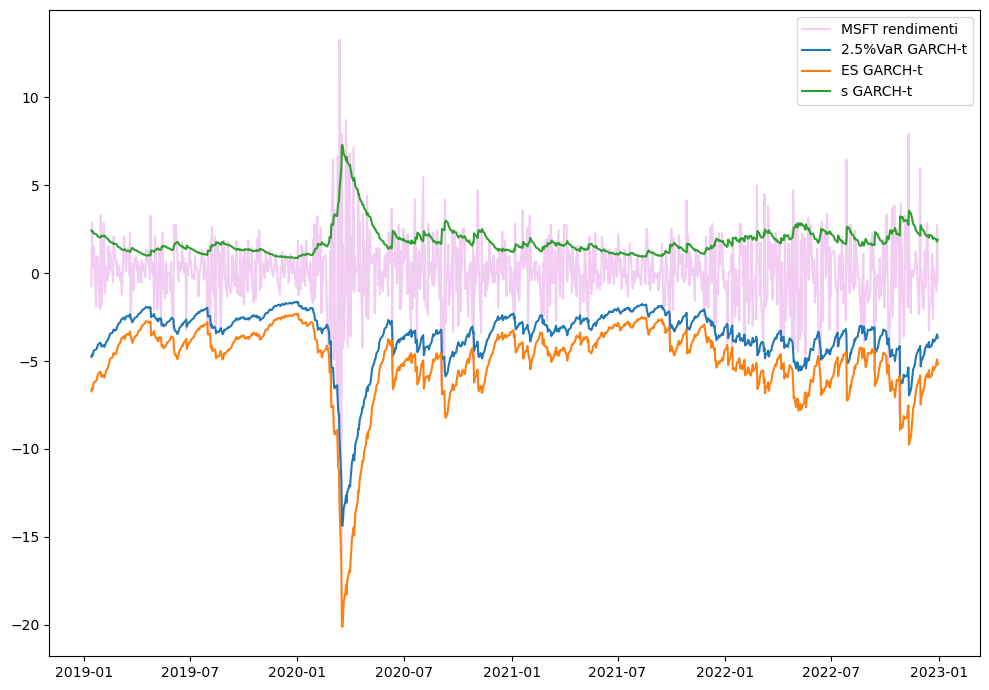

In [91]:
# Figura 15 MSFT
plt.figure(figsize=(10,7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_garch_t, '-', label='2.5%VaR GARCH-t')
plt.plot(es25_garch_t, '-', label='ES GARCH-t')
plt.plot(s_garch_t, '-', label='s GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

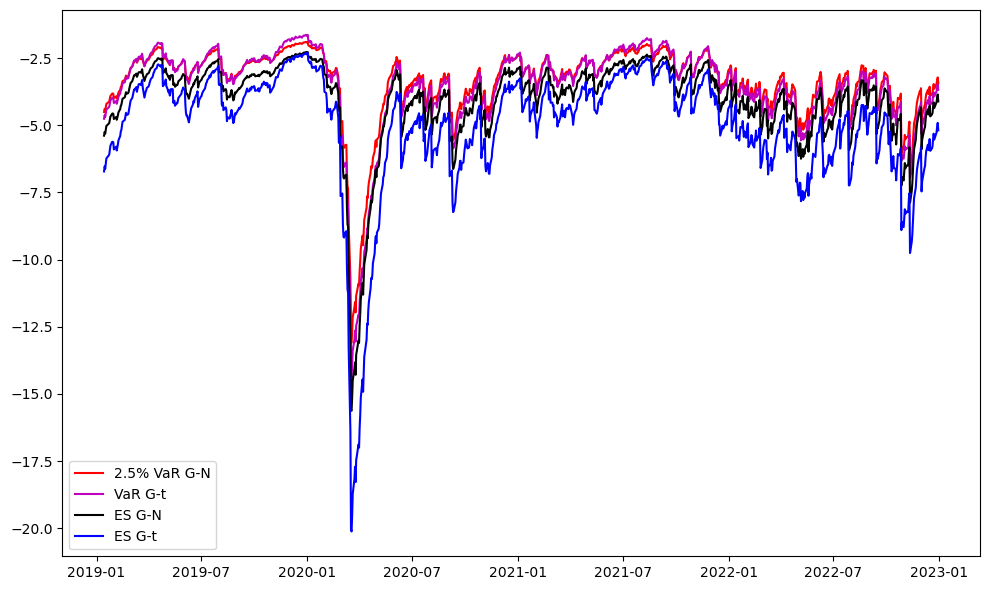

In [92]:
# Figura 16 MSFT
plt.figure(figsize=(10, 6))
#plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_garch, 'r-', label='2.5% VaR G-N')
plt.plot(var25_garch_t, 'm-', label='VaR G-t')
plt.plot(es25_garch, 'k-', label='ES G-N')
plt.plot(es25_garch_t, 'b-', label='ES G-t')
plt.legend()
plt.tight_layout()
plt.show()

#### Previsioni al 2.5%

In [93]:
# 2.5% previsioni VaR verifica accuratezza
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch, r_msft[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t, r_msft[frst_fc:], 0.025),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t
Viol.(25),43.000,36.000
$\hat{p}$,0.043,0.036
$\hat{p}/p$,1.720,1.440
UC,0.000,0.026
Ind,0.910,0.778
DQ,0.003,0.023
Loss,135.394,132.593


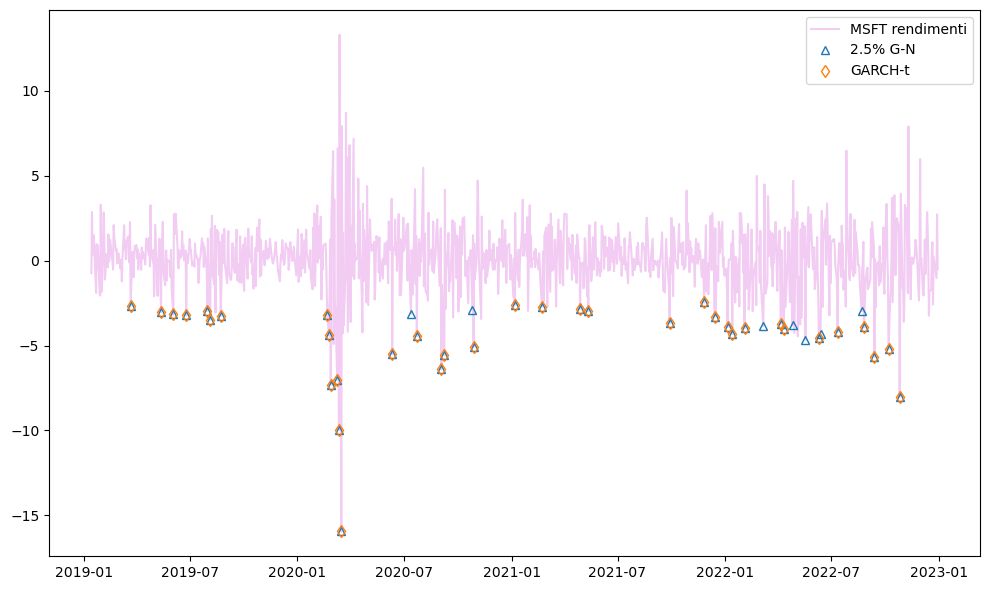

In [94]:
# Figura 17 MSFT violazioni VaR al 2.5%
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_garch], '^', mfc='none', label='2.5% G-N')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_garch_t], 'd', mfc='none', label='GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

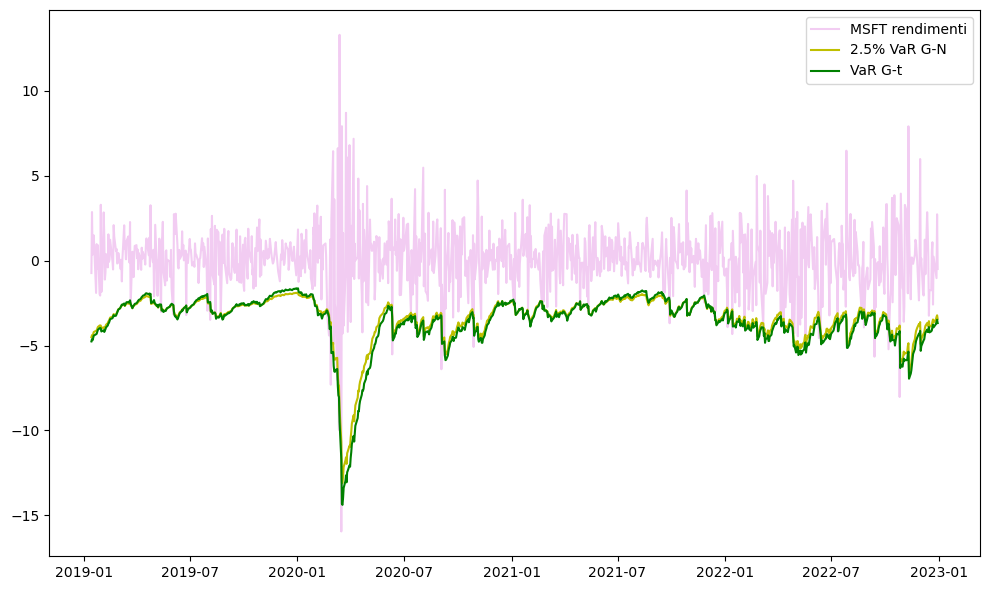

In [95]:
# Figura 18 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_garch, 'y-', label='2.5% VaR G-N')
plt.plot(var25_garch_t, 'g-', label='VaR G-t')
plt.legend()
plt.tight_layout()
plt.show()

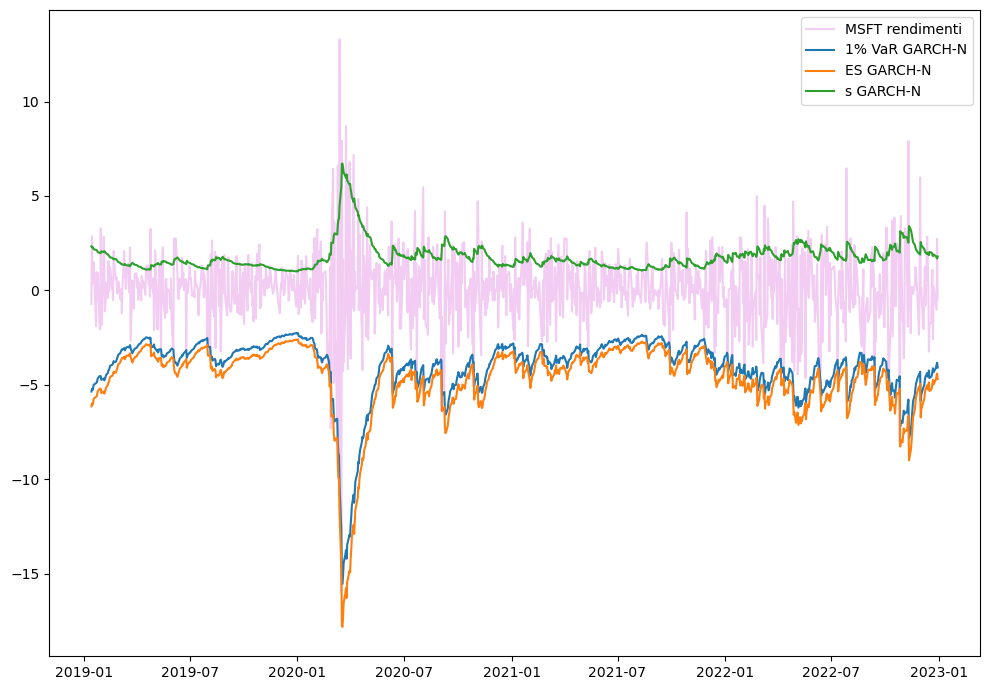

In [96]:
# Figura 19 MSFT
plt.figure(figsize=(10,7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_garch, '-', label='1% VaR GARCH-N')
plt.plot(es1_garch, '-', label='ES GARCH-N')
plt.plot(s_garch, '-', label='s GARCH-N')
plt.legend()
plt.tight_layout()
plt.show()

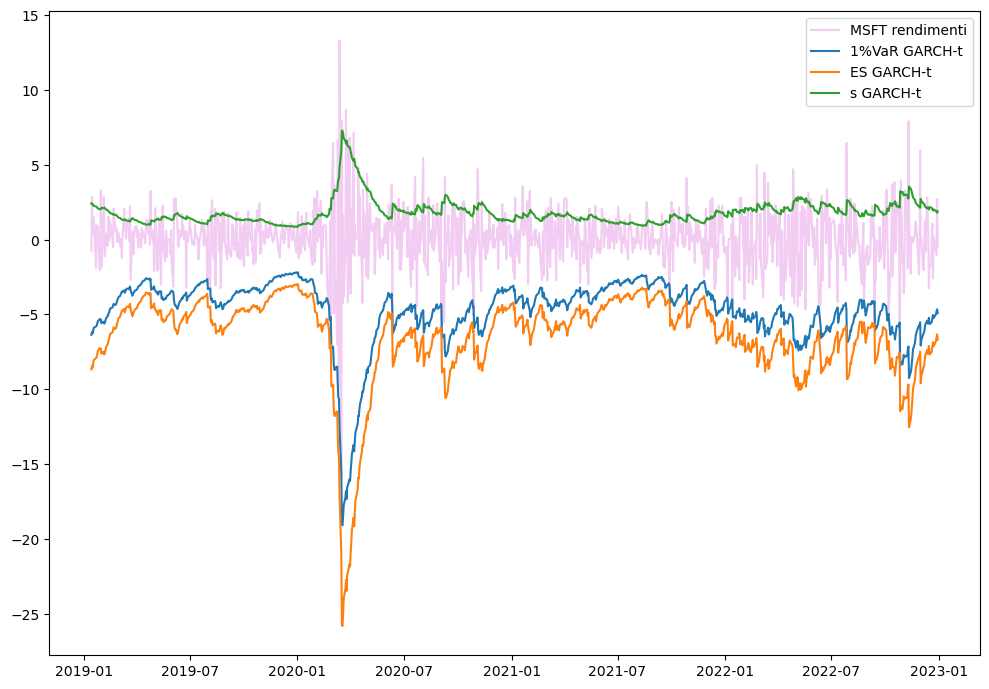

In [97]:
# Figura 20 MSFT
plt.figure(figsize=(10,7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_garch_t, '-', label='1%VaR GARCH-t')
plt.plot(es1_garch_t, '-', label='ES GARCH-t')
plt.plot(s_garch_t, '-', label='s GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

#### Previsioni 1%

In [98]:
# 1% VaR forecast accuracy checks
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch, r_msft[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t, r_msft[frst_fc:], 0.01),
    },
    index=['Viol.(10)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t
Viol.(10),25.000,12.000
$\hat{p}$,0.025,0.012
$\hat{p}/p$,2.500,1.200
UC,0.000,0.525
Ind,0.257,0.589
DQ,0.000,0.283
Loss,67.375,60.193


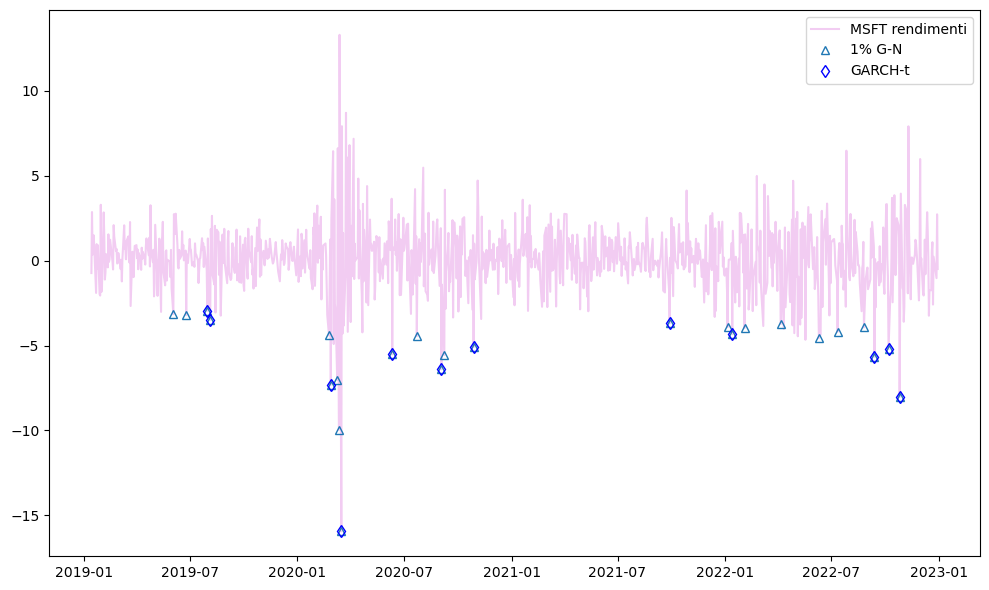

In [99]:
# Figure 21 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_garch], '^', mfc='none', label='1% G-N')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_garch_t], 'db', mfc='none', label='GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

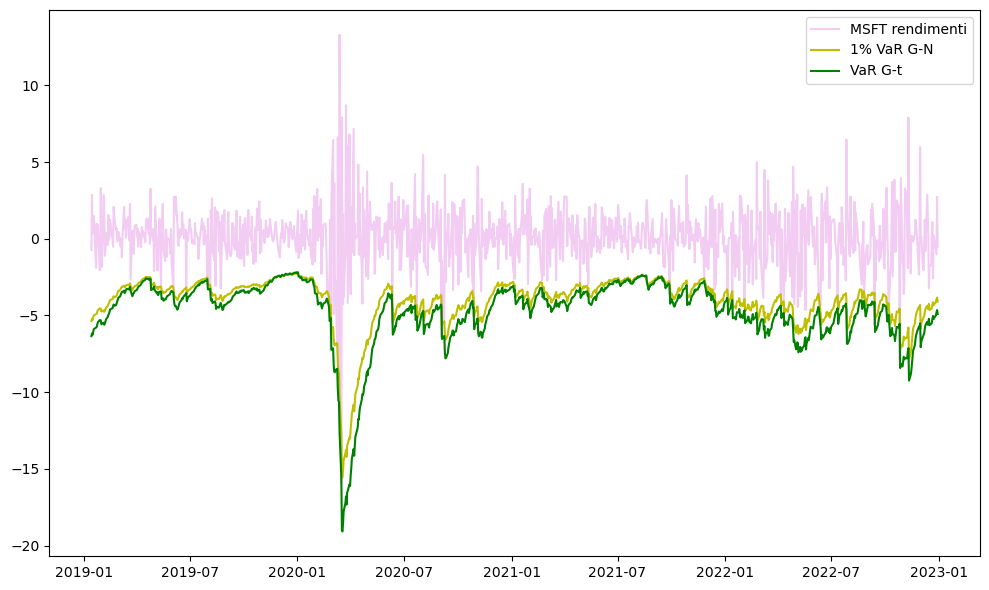

In [100]:
# Figura 22 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_garch, 'y-', label='1% VaR G-N')
plt.plot(var1_garch_t, 'g-', label='VaR G-t')
plt.legend()
plt.tight_layout()
plt.show()

### Previsioni Apple aggiornando i parametri

In [101]:
'''# Previsioni del VaR un passo avanti per Apple, aggiornando i parametri ogni 10 giorni
n_fore = len(r_apple[frst_fc:])

# VaR
var25_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var25_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

# ES
es25_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es1_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es25_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es1_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

# Volatilità
s_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
s_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

# Stima dei g.d.l. per i modelli con errori t
df_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

# Inizializzazione modelli GARCH
garch = arch_model(r_apple, mean='Constant', vol='GARCH', p=1, q=1, dist='Normal')
garch_t = arch_model(r_apple, mean='Constant', vol='GARCH', p=1, q=1, dist='StudentsT')

n_wind = len(r_apple[:last_in])
for i in tqdm(range(n_fore)):
    if i % 10 == 0:
        garch_fit = garch.fit(first_obs=i, last_obs=i + n_wind, disp="off")
        garch_t_fit = garch_t.fit(first_obs=i, last_obs=i + n_wind, disp="off")
        v0 = np.var(r_apple[i:(i + n_wind)])
        r1 = r_apple[i:(i + n_wind)]
        
    
    # GARCH
    fc = garch_fit.forecast(horizon=1, align='target', reindex=False)
    s = np.sqrt(fc.variance)
    var25 = fc.mean + s * VaR_n(0.025)
    var1 = fc.mean + s * VaR_n(0.01)
    var25_garch_a[i] = var25.loc[var25_garch_a.index[i]]
    var1_garch_a[i] = var1.loc[var1_garch_a.index[i]]
    es25 = fc.mean + s * ES_n(0.025)
    es1 = fc.mean + s * ES_n(0.01)
    es25_garch_a[i] = es25.loc[es25_garch_a.index[i]]
    es1_garch_a[i] = es1.loc[es1_garch_a.index[i]]
    s_garch_a[i] = s.loc[s_garch_a.index[i]]

    # GARCH-t
    fc = garch_t_fit.forecast(horizon=1, align='target', reindex=False)
    s = np.sqrt(fc.variance)
    var25 = fc.mean + s * VaR_t(0.025, garch_t_fit.params['nu'])
    var1 = fc.mean + s * VaR_t(0.01, garch_t_fit.params['nu'])
    var25_garch_t_a[i] = var25.loc[var25_garch_t_a.index[i]]
    var1_garch_t_a[i] = var1.loc[var1_garch_t_a.index[i]]
    es25 = fc.mean + s * ES_t(0.025, garch_t_fit.params['nu'])
    es1 = fc.mean + s * ES_t(0.01, garch_t_fit.params['nu'])
    es25_garch_t_a[i] = es25.loc[es25_garch_t_a.index[i]]
    es1_garch_t_a[i] = es1.loc[es1_garch_t_a.index[i]]
    s_garch_t_a[i] = s.loc[s_garch_t_a.index[i]]
    df_garch_t_a[i] = garch_t_fit.params['nu']'''

'# Previsioni del VaR un passo avanti per Apple, aggiornando i parametri ogni 10 giorni\nn_fore = len(r_apple[frst_fc:])\n\n# VaR\nvar25_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nvar1_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nvar25_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nvar1_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\n\n# ES\nes25_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nes1_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nes25_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\nes1_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\n\n# Volatilità\ns_garch_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\ns_garch_t_a = pd.Series(index=r_apple[frst_fc:].index, dtype=\'float64\')\n\n# Stima dei g.d.l. per i modelli con errori t\ndf_garch_t_a = pd.Series(index=r

In [102]:
'''# Saving the forecasts and then re-importing them (needed in Sessions 2 and 3)
data_apple_agrm25 = pd.DataFrame({'s_garch': s_garch_a, 'var25_garch': var25_garch_a, 'es25_garch': es25_garch_a,  's_garch_t': s_garch_t_a, 'var25_garch_t': var25_garch_t_a, 'es25_garch_t': es25_garch_t_a}) 
data_apple_agrm25.to_csv("apple_agrm_data25.csv")

data_apple_agrm1 = pd.DataFrame({'var1_garch': var1_garch_a, 'es1_garch': es1_garch_a,  'var1_garch_t': var1_garch_t_a, 'es1_garch_t': es1_garch_t_a}) 
data_apple_agrm1.to_csv("apple_agrm_data1.csv")'''

'# Saving the forecasts and then re-importing them (needed in Sessions 2 and 3)\ndata_apple_agrm25 = pd.DataFrame({\'s_garch\': s_garch_a, \'var25_garch\': var25_garch_a, \'es25_garch\': es25_garch_a,  \'s_garch_t\': s_garch_t_a, \'var25_garch_t\': var25_garch_t_a, \'es25_garch_t\': es25_garch_t_a}) \ndata_apple_agrm25.to_csv("apple_agrm_data25.csv")\n\ndata_apple_agrm1 = pd.DataFrame({\'var1_garch\': var1_garch_a, \'es1_garch\': es1_garch_a,  \'var1_garch_t\': var1_garch_t_a, \'es1_garch_t\': es1_garch_t_a}) \ndata_apple_agrm1.to_csv("apple_agrm_data1.csv")'

In [103]:
# Per reimportare i dati 
data_apple_agrm25 = pd.read_csv("apple_agrm_data25.csv", index_col = 'Date')
s_garch_a = pd.Series(data=data_apple_agrm25.loc[:,'s_garch'].values, index=r_apple[frst_fc:].index, dtype='float64')
s_garch_t_a = pd.Series(data=data_apple_agrm25.loc[:,'s_garch_t'].values, index=r_apple[frst_fc:].index, dtype='float64')
var25_garch_a = pd.Series(data=data_apple_agrm25.loc[:,'var25_garch'].values, index=r_apple[frst_fc:].index, dtype='float64')
var25_garch_t_a = pd.Series(data=data_apple_agrm25.loc[:,'var25_garch_t'].values, index=r_apple[frst_fc:].index, dtype='float64')
es25_garch_a = pd.Series(data=data_apple_agrm25.loc[:,'es25_garch'].values, index=r_apple[frst_fc:].index, dtype='float64')
es25_garch_t_a = pd.Series(data=data_apple_agrm25.loc[:,'es25_garch_t'].values, index=r_apple[frst_fc:].index, dtype='float64')

data_apple_agrm1 = pd.read_csv("apple_agrm_data1.csv", index_col = 'Date')
var1_garch_a = pd.Series(data=data_apple_agrm1.loc[:,'var1_garch'].values, index=r_apple[frst_fc:].index, dtype='float64')
var1_garch_t_a = pd.Series(data=data_apple_agrm1.loc[:,'var1_garch_t'].values, index=r_apple[frst_fc:].index, dtype='float64')
es1_garch_a = pd.Series(data=data_apple_agrm1.loc[:,'es1_garch'].values, index=r_apple[frst_fc:].index, dtype='float64')
es1_garch_t_a = pd.Series(data=data_apple_agrm1.loc[:,'es1_garch_t'].values, index=r_apple[frst_fc:].index, dtype='float64')

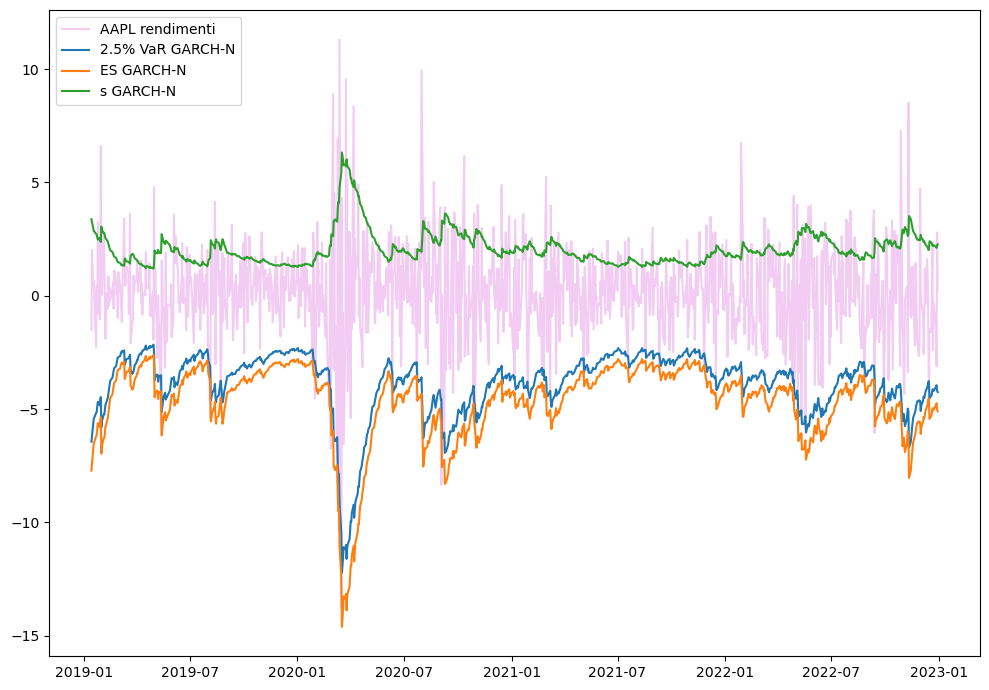

In [104]:
# Figura 14 Apple
plt.figure(figsize=(10,7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_garch_a, '-', label='2.5% VaR GARCH-N')
plt.plot(es25_garch_a, '-', label='ES GARCH-N')
plt.plot(s_garch_a, '-', label='s GARCH-N')
plt.legend()
plt.tight_layout()
plt.show()

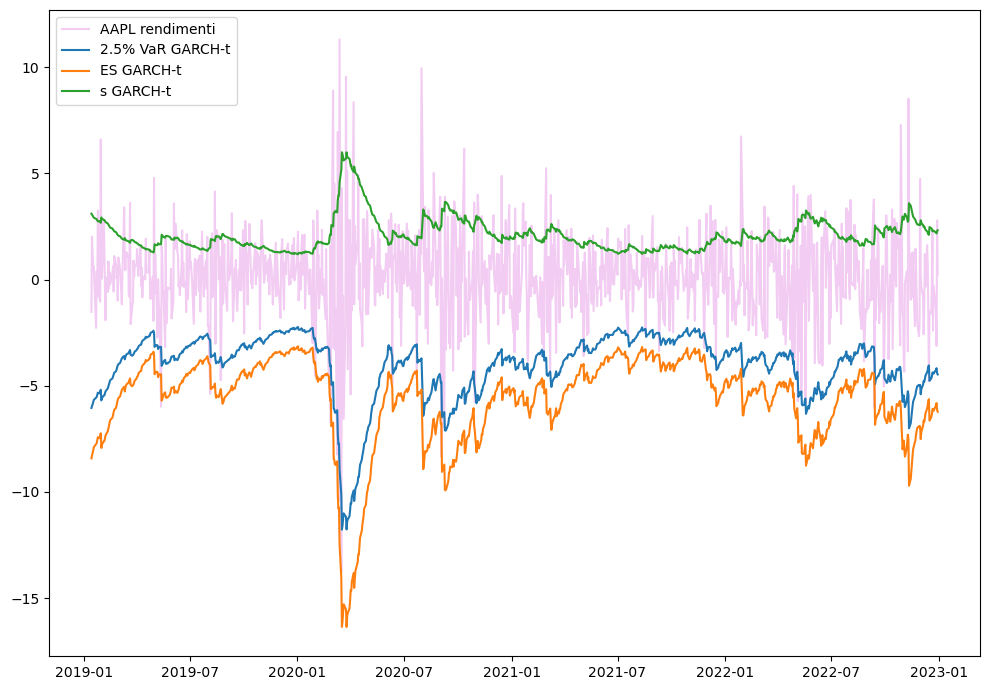

In [105]:
# Figura 15 Apple
plt.figure(figsize=(10,7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_garch_t_a, '-', label='2.5% VaR GARCH-t')
plt.plot(es25_garch_t_a, '-', label='ES GARCH-t')
plt.plot(s_garch_t_a, '-', label='s GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

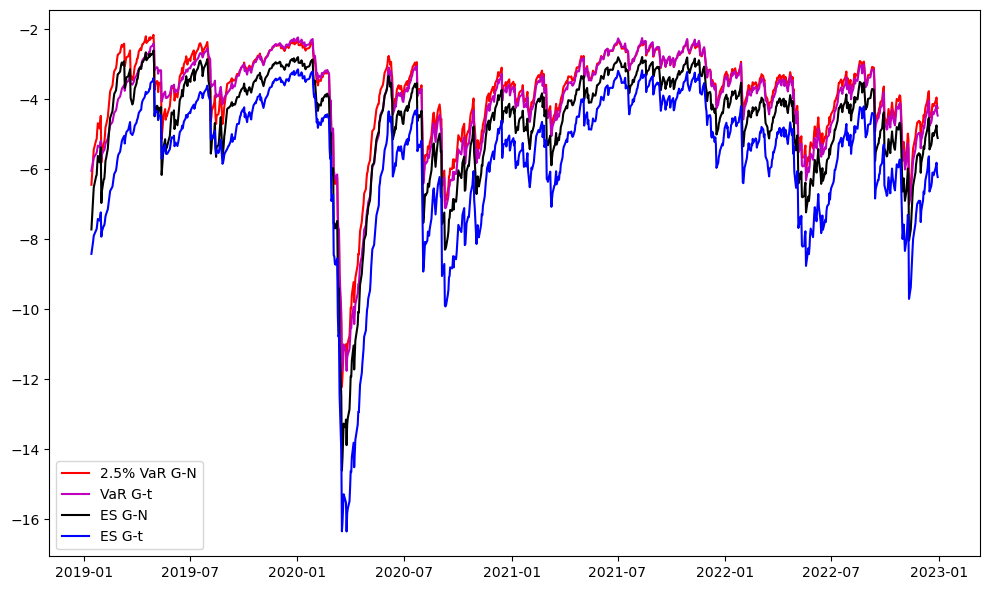

In [106]:
# Figura 16 Apple
plt.figure(figsize=(10, 6))
#plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='CBA returns')
plt.plot(var25_garch_a, 'r-', label='2.5% VaR G-N')
plt.plot(var25_garch_t_a, 'm-', label='VaR G-t')
plt.plot(es25_garch_a, 'k-', label='ES G-N')
plt.plot(es25_garch_t_a, 'b-', label='ES G-t')
plt.legend()
plt.tight_layout()
plt.show()

#### Previsioni 2.5%

In [107]:
# 2.5% previsioni VaR verifica accuratezza
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch_a, r_apple[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t_a, r_apple[frst_fc:], 0.025),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t
Viol.(25),32.000,31.000
$\hat{p}$,0.032,0.031
$\hat{p}/p$,1.280,1.240
UC,0.156,0.224
Ind,0.146,0.159
DQ,0.079,0.075
Loss,141.143,143.817


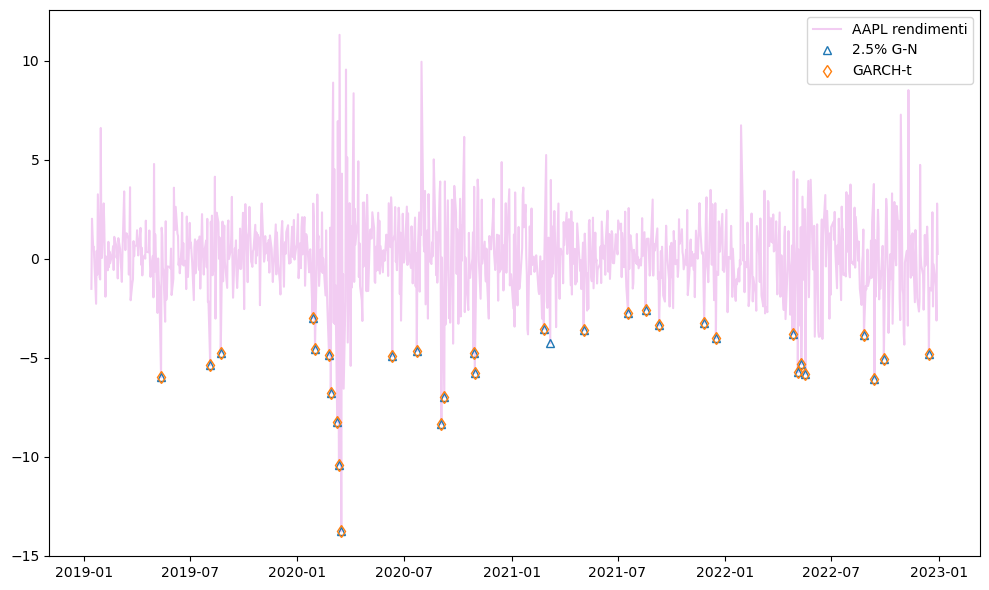

In [108]:
# Figura 17 Apple violazioni VaR al 2.5%
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_garch_a], '^', mfc='none', label='2.5% G-N')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_garch_t_a], 'd', mfc='none', label='GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

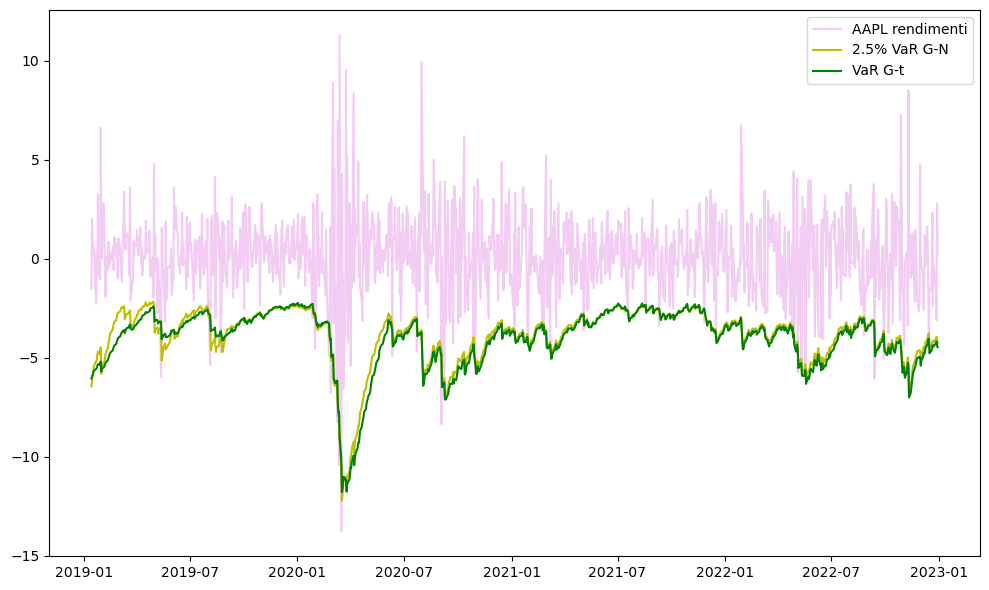

In [109]:
# Figura 18 Apple
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_garch_a, 'y-', label='2.5% VaR G-N')
plt.plot(var25_garch_t_a, 'g-', label='VaR G-t')
plt.legend()
plt.tight_layout()
plt.show()

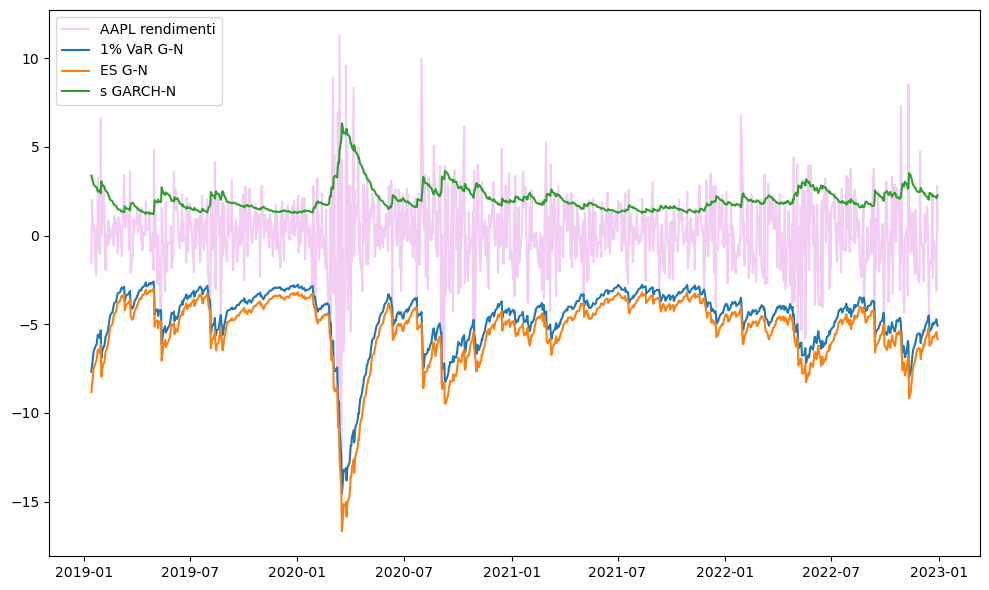

In [110]:
# Figura 19 Apple
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_garch_a, '-', label='1% VaR G-N')
plt.plot(es1_garch_a, '-', label='ES G-N')
plt.plot(s_garch_a, '-', label='s GARCH-N')
plt.legend()
plt.tight_layout()
plt.show()

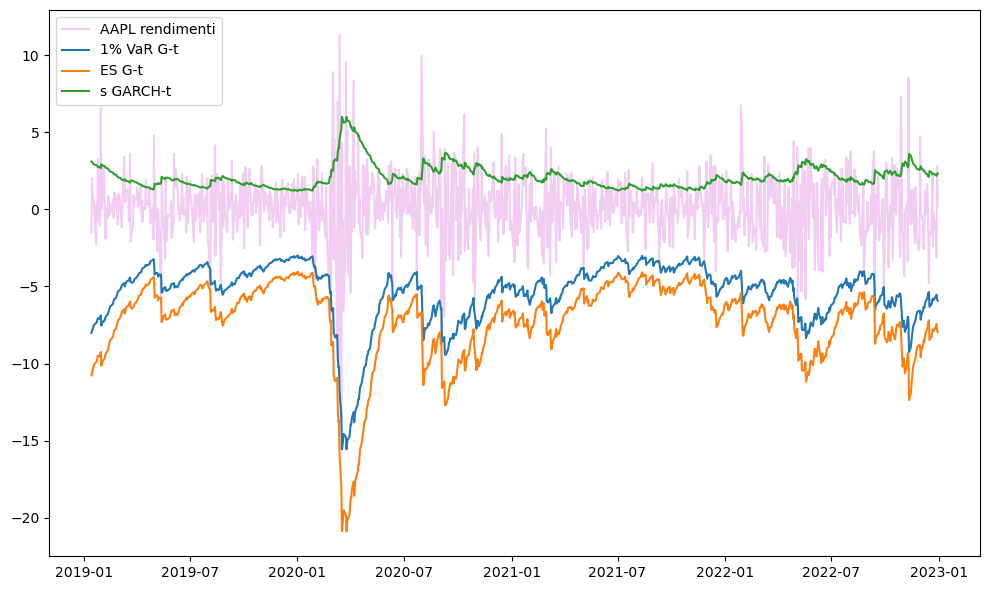

In [111]:
# Figura 20 Apple
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_garch_t_a, '-', label='1% VaR G-t')
plt.plot(es1_garch_t_a, '-', label='ES G-t')
plt.plot(s_garch_t_a, '-', label='s GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

#### Previsioni 1%

In [112]:
# 1% VaR forecast accuracy checks
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch_a, r_apple[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t_a, r_apple[frst_fc:], 0.01),
    },
    index=['Viol.(10)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t
Viol.(10),22.000,14.000
$\hat{p}$,0.022,0.014
$\hat{p}/p$,2.200,1.400
UC,0.000,0.204
Ind,0.320,0.528
DQ,0.000,0.000
Loss,67.513,65.473


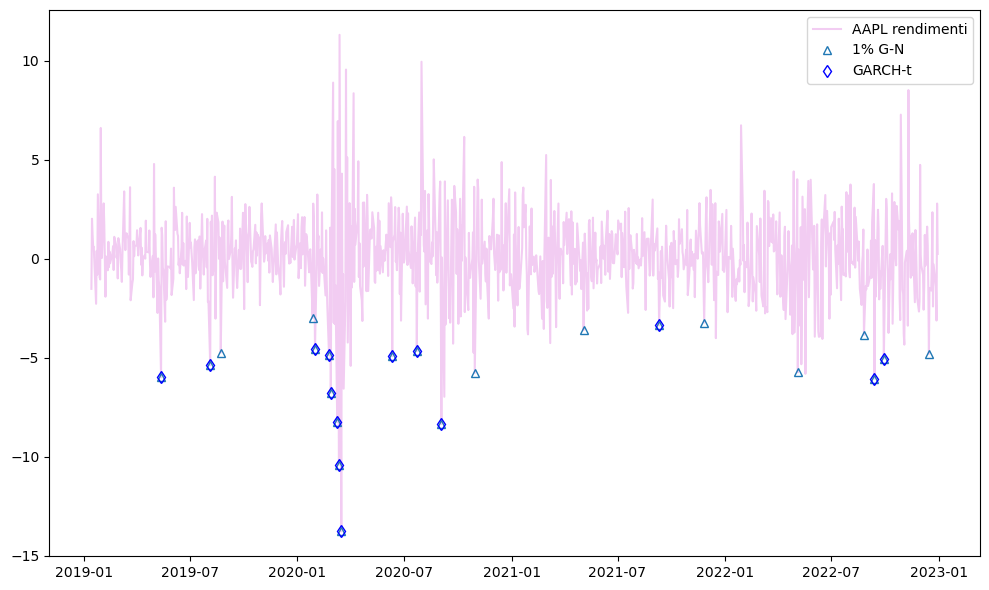

In [113]:
# Figure 21 Apple
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_garch_a], '^', mfc='none', label='1% G-N')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_garch_t_a], 'db', mfc='none', label='GARCH-t')
plt.legend()
plt.tight_layout()
plt.show()

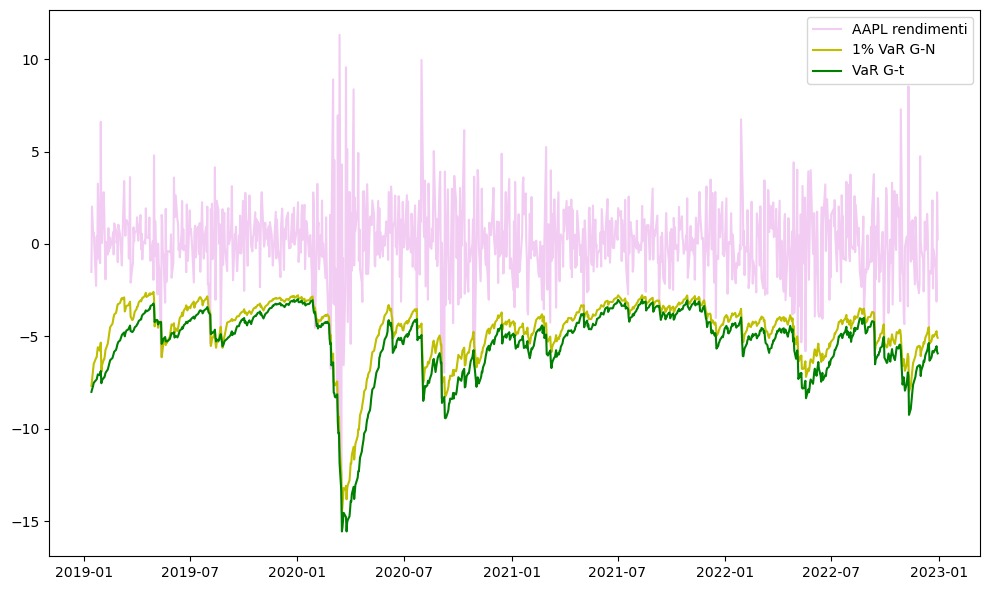

In [114]:
# Figura 22 Apple
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_garch_a, 'y-', label='1% VaR G-N')
plt.plot(var1_garch_t_a, 'g-', label='VaR G-t')
plt.legend()
plt.tight_layout()
plt.show()

### Valutazioni previsioni ES

In [115]:
# ES residuals  Calcola i residui ES e ES standardizzati
def es_resid(es, var, s, r):
    xi = r[r < var] - es
    return (xi.dropna(), (xi / s).dropna())

# t-test ES media residui = 0
def ttest(x, mu):
    n = len(x)
    xbar = np.mean(x)
    s = np.std(x, ddof=1)
    t = (xbar - mu) / (s / np.sqrt(n))
    pval = 2 * stats.t.sf(np.abs(t), df=(n - 1))
    return pval, t

# Joint loss function
def jointloss(es,q,r,p):
    m = len(r)
    q = np.array(q)
    es = np.array(es)
    i1 = (r < q).astype(int)
    aes = es ** (-1) * (p-1)
    ees = (r-q) * (p - i1)
    l =  np.sum(-np.log(aes)) - np.sum(ees / es) / p
    l = l / m
    return l

# Joint loss series
def jloss_t(q,es,r,p):
    jl = pd.Series(index=r.index, dtype='float64')
    for t in range(len(r)):
        jl[t] = -np.log((p-1)/es[t])
        if r[t]<q[t]:
            jl[t] = jl[t] - (r[t]-q[t]) * (p-1) / (p * es[t])
        else:
            jl[t] = jl[t] - (r[t]-q[t]) / es[t]
            
    return jl.values

# Accuracy checks for ES
def check_es_fc(es, var, s, r, p):
    hit = r < var
    n_hit = np.sum(hit)
    xi, xis = es_resid(es, var, s, r)
    t_xi = ttest(xi, 0)[1]
    t_xis = ttest(xis, 0)[1]
    p_xis = ttest(xis, 0)[0]
    vloss = qloss(var, r, p)
    jloss = jointloss(es, var, r, p)
    rmse = np.sqrt(np.mean(xi ** 2))
    mad = np.mean(np.abs(xi))
    return [n_hit, vloss, jloss, np.mean(xi), np.mean(xis), t_xis, p_xis, rmse, mad]

# More accuracy checks for ES
def check_es_fc_ex(es, var, s, r, p):
    xi = es_resid(es, var, s, r)[0]
    rmse = np.sqrt(np.mean(xi ** 2))
    mad = np.mean(np.abs(xi))
    lst = check_var_fc2(es, r, p)
    lst.append(rmse)
    lst.append(mad)
    return lst

#### Verifica previsioni ES MSFT

In [116]:
# MSFT controllo accuratezza previsioni ES 2.5% 
tbl_es25 = pd.DataFrame({
    'G': check_es_fc(es25_garch, var25_garch, s_garch, r_msft[frst_fc:], 0.025),
    'G-t': check_es_fc(es25_garch_t, var25_garch_t, s_garch_t, r_msft[frst_fc:], 0.025),
    },
    index=['VaR Viol. (25)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es25.round(3)

,G,G-t
VaR Viol. (25),43.000,36.000
Q loss,135.394,132.593
Joint loss,2.682,2.621
Mean xi,-0.443,0.293
Mean xsi/s,-0.221,0.172
t-stat,-2.636,2.055
p-val,0.012,0.047
RMSE,1.134,0.951
MAD,0.736,0.787


In [117]:
# 1% ES 
tbl_es1 = pd.DataFrame({
    'G': check_es_fc(es1_garch, var1_garch, s_garch, r_msft[frst_fc:], 0.01),
    'G-t': check_es_fc(es1_garch_t, var1_garch_t, s_garch_t, r_msft[frst_fc:], 0.01),
},
    index=['VaR Viol. (10)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es1.round(3)

,G,G-t
VaR Viol. (10),25.000,12.000
Q loss,67.375,60.193
Joint loss,2.904,2.741
Mean xi,-0.384,0.860
Mean xsi/s,-0.206,0.381
t-stat,-1.962,3.038
p-val,0.061,0.011
RMSE,1.031,1.661
MAD,0.697,1.077


#### Verifica previsioni ES Apple 

In [118]:
# Apple controllo accuratezza previsioni ES 2.5% 
tbl_es25 = pd.DataFrame({
    'G': check_es_fc(es25_garch_a, var25_garch_a, s_garch_a, r_apple[frst_fc:], 0.025),
    'G-t': check_es_fc(es25_garch_t_a, var25_garch_t_a, s_garch_t_a, r_apple[frst_fc:], 0.025),
    },
    index=['VaR Viol. (25)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es25.round(3)

,G,G-t
VaR Viol. (25),32.000,31.000
Q loss,141.143,143.817
Joint loss,2.722,2.732
Mean xi,-0.474,0.337
Mean xsi/s,-0.230,0.136
t-stat,-3.088,1.602
p-val,0.004,0.120
RMSE,0.980,1.014
MAD,0.741,0.846


In [119]:
# 1% ES 
tbl_es1 = pd.DataFrame({
    'G': check_es_fc(es1_garch_a, var1_garch_a, s_garch_a, r_apple[frst_fc:], 0.01),
    'G-t': check_es_fc(es1_garch_t_a, var1_garch_t_a, s_garch_t_a, r_apple[frst_fc:], 0.01),
},
    index=['VaR Viol. (10)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es1.round(3)

,G,G-t
VaR Viol. (10),22.000,14.000
Q loss,67.513,65.473
Joint loss,2.906,2.860
Mean xi,-0.173,1.263
Mean xsi/s,-0.101,0.483
t-stat,-1.345,4.801
p-val,0.193,0.000
RMSE,0.741,1.792
MAD,0.579,1.321


## CAViaR

In [120]:
'''
CaViaR-SAV loss function
More efficient than qregCaViaR
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: scalar, loss function value.
'''
def caviar_loss(b, r, p, q0):
    if b[1] >= 1:
        return np.inf
    
    n = len(r)
    q = np.empty(n)
    q[0] = q0
    for t in range(1, n):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
    
    x1 = r[r > q]
    x2 = r[r < q]
    f1 = q[r > q]
    f2 = q[r < q]
    
    return p * np.sum(x1 - f1) + (1 - p) * np.sum(f2 - x2)

'''
CaViaR-SAV update function
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def caviar_update(b, r, p, q0):
    q = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    for t in range(1, len(r)):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
    return q

In [121]:
'''
CaViaR-AS loss function
More efficient than qregCaViaR
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: scalar, loss function value.
'''
def caviar_as_loss(b, r, p, q0):
    
    if b[1] >= 1:
        return np.inf
    
    n = len(r)
    q = np.empty(n)
    q[0] = q0
    for t in range(1, n): 
        if r[t-1]<0:
            q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        else:
            q[t] = b[0] + b[1] * q[t - 1] + b[3] * np.abs(r[t - 1])
    
    x1 = r[r > q]
    x2 = r[r < q]
    f1 = q[r > q]
    f2 = q[r < q]
    
    return p * np.sum(x1 - f1) + (1 - p) * np.sum(f2 - x2)

'''
CaViaR-AS update function
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def caviar_as_update(b, r, p, q0):
    q = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    for t in range(1, len(r)):
        if r[t-1]<0:
            q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        else:
            q[t] = b[0] + b[1] * q[t - 1] + b[3] * np.abs(r[t - 1])
    return q

In [122]:
'''
CaViaR-IG loss function

b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: scalar, loss function value.
'''
def caviar_ig_loss(b, r, p, q0):
    
    if b[0] < 0:
        return np.inf
    
    if b[1] < 0:
        return np.inf
    
    if b[2] < 0:
        return np.inf
    
    if b[1] >= 1:
        return np.inf
    
    n = len(r)
    q = np.empty(n)
    q[0] = q0
    for t in range(1, n):
        q[t] = -np.sqrt(b[0] + b[1] * q[t - 1] ** 2 + b[2] * r[t - 1] ** 2)
    
    x1 = r[r > q]
    x2 = r[r < q]
    f1 = q[r > q]
    f2 = q[r < q]
    
    return p * np.sum(x1 - f1) + (1 - p) * np.sum(f2 - x2)

'''
CaViaR-IG update function
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def caviar_ig_update(b, r, p, q0):
    q = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    for t in range(1, len(r)):
        q[t] = -np.sqrt(b[0] + b[1] * q[t - 1] ** 2 + b[2] * r[t - 1] ** 2)
    return q

### CAViaR Microsoft

In [123]:
# Stima del modello CAViaR-SAV in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead, il quale non si basa sulle derivate

r = r_msft[:last_in]
b01 = [-0.1, 0.4, -0.1]
b02 = [-0.15, 0.8, -0.2]
b03 = [-0.2, 0.6, -0.3]
b04 = [-0.25, 0.9, -0.25]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviar25_par1 = fmin(caviar_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviar25_par2 = fmin(caviar_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviar25_par3 = fmin(caviar_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviar25_par4 = fmin(caviar_loss, x0=b04, args=(r, 0.025, q025), disp=True)
caviar1_par1 = fmin(caviar_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviar1_par2 = fmin(caviar_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviar1_par3 = fmin(caviar_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviar1_par4 = fmin(caviar_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviar25_par1.round(4))
print(caviar25_par2.round(4))
print(caviar25_par3.round(4))
print(caviar25_par4.round(4))
print('=' * 37)
print(caviar1_par1.round(4))
print(caviar1_par2.round(4))
print(caviar1_par3.round(4))
print(caviar1_par4.round(4))

Optimization terminated successfully.
         Current function value: 578.896562
         Iterations: 146
         Function evaluations: 255
Optimization terminated successfully.
         Current function value: 578.804383
         Iterations: 105
         Function evaluations: 189
Optimization terminated successfully.
         Current function value: 578.823761
         Iterations: 94
         Function evaluations: 173
Optimization terminated successfully.
         Current function value: 578.804550
         Iterations: 97
         Function evaluations: 171
Optimization terminated successfully.
         Current function value: 305.873685
         Iterations: 90
         Function evaluations: 162
Optimization terminated successfully.
         Current function value: 305.729453
         Iterations: 255
         Function evaluations: 443
Optimization terminated successfully.
         Current function value: 306.139029
         Iterations: 101
         Function evaluations: 187
Optimizat

Qui si sta andando a stimare i parametri del modello CAViaR-SAV, dati i parametri con la loss inferiore si ottiene:

$$
Q_{t, 0.025} = -0.0744 + 0.8621 Q_{t-1, 0.025} - 0.3032 |r_{t-1}| \\
Q_{t, 0.01} = -0.0339 + 0.8705 Q_{t-1, 0.01} - 0.4377 |r_{t-1}|
$$

In [124]:
# Stima del modello CAViaR-AS in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead

r = r_msft[:last_in]
b01 = [-0.15, 0.85, -0.25, -0.25]
b02 = [-0.15, 0.8, -0.2, -0.1]
b03 = [-0.2, 0.6, -0.3, -0.2]
b04 = [-0.05, 0.9, -0.25, -0.1]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviaras25_par1 = fmin(caviar_as_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviaras25_par2 = fmin(caviar_as_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviaras25_par3 = fmin(caviar_as_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviaras25_par4 = fmin(caviar_as_loss, x0=b04, args=(r, 0.025, q025), disp=True)
caviaras1_par1 = fmin(caviar_as_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviaras1_par2 = fmin(caviar_as_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviaras1_par3 = fmin(caviar_as_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviaras1_par4 = fmin(caviar_as_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviaras25_par1.round(4))
print(caviaras25_par2.round(4))
print(caviaras25_par3.round(4))
print(caviaras25_par4.round(4))
print('=' * 37)
print(caviaras1_par1.round(4))
print(caviaras1_par2.round(4))
print(caviaras1_par3.round(4))
print(caviaras1_par4.round(4))

Optimization terminated successfully.
         Current function value: 578.686220
         Iterations: 98
         Function evaluations: 171
Optimization terminated successfully.
         Current function value: 578.927567
         Iterations: 81
         Function evaluations: 152
Optimization terminated successfully.
         Current function value: 578.686203
         Iterations: 276
         Function evaluations: 464
Optimization terminated successfully.
         Current function value: 578.483959
         Iterations: 254
         Function evaluations: 426
Optimization terminated successfully.
         Current function value: 305.726909
         Iterations: 116
         Function evaluations: 205
Optimization terminated successfully.
         Current function value: 306.327703
         Iterations: 207
         Function evaluations: 343
Optimization terminated successfully.
         Current function value: 307.322958
         Iterations: 154
         Function evaluations: 268
Optimiza

Dati i valori delle loss, il modello CAViaR-AS sarà:

$$
Q_{t, 0.025} = -0.0519 + 0.9024 Q_{t-1, 0.025} - 0.244 |r_{t-1}|I^{-}_{t-1} - 0.187 |r_{t-1}|I^{+}_{t-1} \\
Q_{t, 0.01} = -0.0281 + 0.8741 Q_{t-1, 0.01} - 0.4438 |r_{t-1}|I^{-}_{t-1} - 0.4098 |r_{t-1}|I^{+}_{t-1}
$$

In [125]:
# Stima del modello CAViaR-IG in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead

r = r_msft[:last_in]
b01 = [0.1, 0.4, 0.3]
b02 = [0.05, 0.8, 0.1]
b03 = [0.02, 0.6, 0.3]
b04 = [0.15, 0.9, 0.05]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviarig25_par1 = fmin(caviar_ig_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviarig25_par2 = fmin(caviar_ig_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviarig25_par3 = fmin(caviar_ig_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviarig25_par4 = fmin(caviar_ig_loss, x0=b04, args=(r, 0.025, q025), disp=True)
b01 = [0.1, 0.7, 0.4]
b02 = [0.05, 0.8, 0.6]
b03 = [0.02, 0.6, 0.3]
b04 = [0.15, 0.9, 0.5]
caviarig1_par1 = fmin(caviar_ig_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviarig1_par2 = fmin(caviar_ig_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviarig1_par3 = fmin(caviar_ig_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviarig1_par4 = fmin(caviar_ig_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviarig25_par1)
print(caviarig25_par2)
print(caviarig25_par3)
print(caviarig25_par4)
print('=' * 37)
print(caviarig1_par1)
print(caviarig1_par2)
print(caviarig1_par3)
print(caviarig1_par4)

Optimization terminated successfully.
         Current function value: 588.710757
         Iterations: 69
         Function evaluations: 129
Optimization terminated successfully.
         Current function value: 588.709539
         Iterations: 171
         Function evaluations: 302
Optimization terminated successfully.
         Current function value: 589.830979
         Iterations: 96
         Function evaluations: 172
Optimization terminated successfully.
         Current function value: 588.709519
         Iterations: 163
         Function evaluations: 291
Optimization terminated successfully.
         Current function value: 310.793735
         Iterations: 172
         Function evaluations: 310
Optimization terminated successfully.
         Current function value: 310.454557
         Iterations: 222
         Function evaluations: 399
Optimization terminated successfully.
         Current function value: 311.531339
         Iterations: 217
         Function evaluations: 404
Optimiza

Il modello CAViaR-IG sarà:

$$
Q_{t, 0.025} = - \sqrt{0.09894245 + 0.92369857 Q_{t-1, 0.025}^2 + 0.26159441 r_{t-1}^2} \\
Q_{t, 0.01} = -\sqrt{0.35378979 + 0.82312417  Q_{t-1, 0.01}^2 + 1.14393569 r_{t-1}^2}
$$

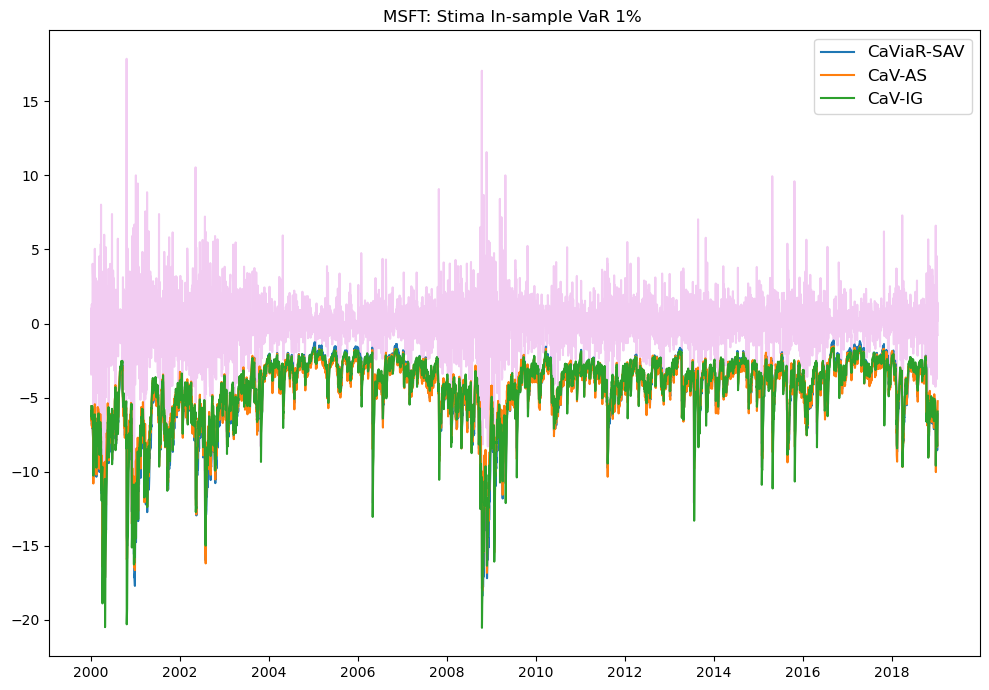

In [126]:
# Figura 23 MSFT
q01 = np.quantile(r, 0.01)
cav1_is = caviar_update(caviar1_par2, r, 0.01, q01)
cav1_ig_is = caviar_ig_update(caviarig1_par4, r, 0.01, q01)
cav1_as_is = caviar_as_update(caviaras1_par2, r, 0.01, q01)

q025 = np.quantile(r, 0.025)
cav25_is = caviar_update(caviar25_par2, r, 0.025, q025)
cav25_ig_is = caviar_ig_update(caviarig25_par4, r, 0.025, q025)
cav25_as_is = caviar_as_update(caviaras25_par4, r, 0.025, q025)


plt.figure(figsize=(10, 7))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(cav1_is, label='CaViaR-SAV')
plt.plot(cav1_as_is, label='CaV-AS')
plt.plot(cav1_ig_is, label='CaV-IG')
plt.title('MSFT: Stima In-sample VaR 1% ')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

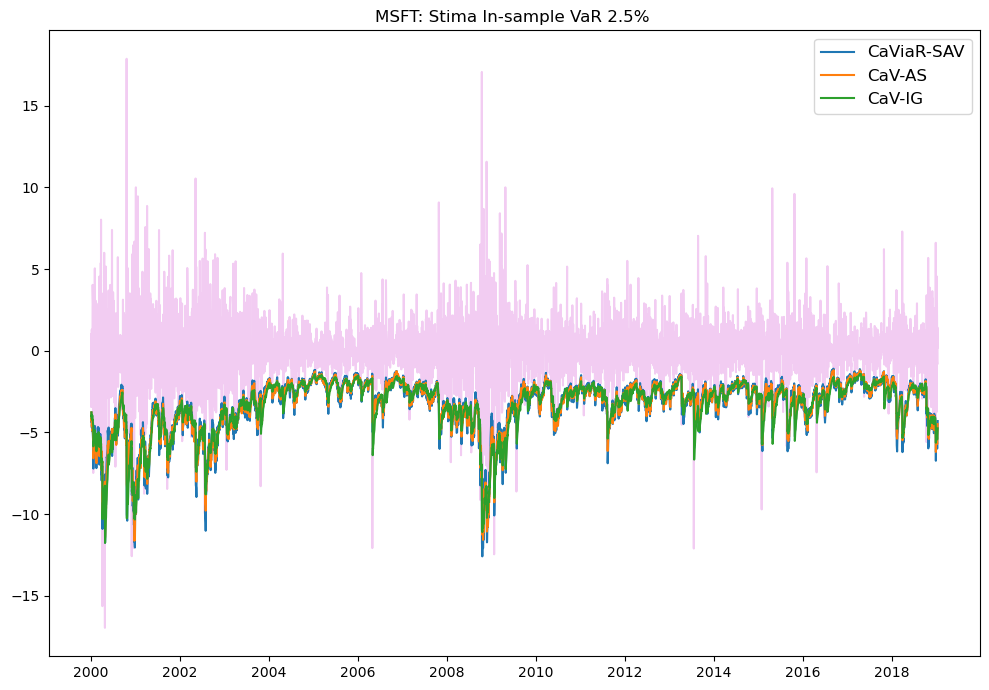

In [127]:
# Figura 24 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(cav25_is, label='CaViaR-SAV')
plt.plot(cav25_as_is, label='CaV-AS')
plt.plot(cav25_ig_is, label='CaV-IG')
plt.title('MSFT: Stima In-sample VaR 2.5% ')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [128]:
'''# VaR forecasting CaViaR
# One-day-ahead VaR forecasts, aggiornando i parametri ogni 25 giorni.
n_fore = len(r_msft[frst_fc:])

# VaR
var25_caviar = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_caviar = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var25_cavas = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_cavas = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var25_cavig = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_cavig = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')


n_wind = len(r_msft[:last_in])
for i in tqdm(range(n_fore)):
    if i % 50 == 0:
        r = r_msft[i:(i + n_wind)]
        q025 = np.quantile(r, 0.025)
        q01 = np.quantile(r, 0.01)
        
        caviar_b0_1 = [-0.15, 0.8, -0.2]
        caviar_b0_25 = [-0.15, 0.8, -0.2]
        caviar25_par = fmin(caviar_loss, x0=caviar_b0_25, args=(r, 0.025, q025), disp=False)
        caviar1_par = fmin(caviar_loss, x0=caviar_b0_1, args=(r, 0.01, q01), disp=False)
        
        caviaras_b0_1 = [-0.15, 0.85, -0.25, -0.25]
        caviaras_b0_25 = [-0.05, 0.9, -0.25, -0.1]
        caviaras25_par = fmin(caviar_as_loss, x0=caviaras_b0_25, args=(r, 0.025, q025), disp=False)
        caviaras1_par = fmin(caviar_as_loss, x0=caviaras_b0_1, args=(r, 0.01, q01), disp=False)
        
        caviarig_b0_1 = [0.15, 0.9, 0.5]
        caviarig_b0_25 = [0.15, 0.9, 0.05]
        caviarig25_par = fmin(caviar_ig_loss, x0=caviarig_b0_25, args=(r, 0.025, q025), disp=False)
        caviarig1_par = fmin(caviar_ig_loss, x0=caviarig_b0_1, args=(r, 0.01, q01), disp=False)
        
        v0 = np.var(r_msft[i:(i + n_wind)])
        
            
    # CaViaR - SAV
    var25 = caviar_update(caviar25_par, r_msft, 0.025, q025)
    var1 = caviar_update(caviar1_par, r_msft, 0.01, q01)
    var25_caviar[i] = var25.loc[var25_caviar.index[i]]
    var1_caviar[i] = var1.loc[var1_caviar.index[i]]
    
    # CaViaR - AS
    var25 = caviar_as_update(caviaras25_par, r_msft, 0.025, q025)
    var1 = caviar_as_update(caviaras1_par, r_msft, 0.01, q01)
    var25_cavas[i] = var25.loc[var25_cavas.index[i]]
    var1_cavas[i] = var1.loc[var1_cavas.index[i]]
    
    # CaViaR - IG
    var25 = caviar_ig_update(caviarig25_par, r_msft, 0.025, q025)
    var1 = caviar_ig_update(caviarig1_par, r_msft, 0.01, q01)
    var25_cavig[i] = var25.loc[var25_cavig.index[i]]
    var1_cavig[i] = var1.loc[var1_cavig.index[i]]
      '''

"# VaR forecasting CaViaR\n# One-day-ahead VaR forecasts, aggiornando i parametri ogni 25 giorni.\nn_fore = len(r_msft[frst_fc:])\n\n# VaR\nvar25_caviar = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar1_caviar = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar25_cavas = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar1_cavas = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar25_cavig = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar1_cavig = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\n\n\nn_wind = len(r_msft[:last_in])\nfor i in tqdm(range(n_fore)):\n    if i % 50 == 0:\n        r = r_msft[i:(i + n_wind)]\n        q025 = np.quantile(r, 0.025)\n        q01 = np.quantile(r, 0.01)\n        \n        caviar_b0_1 = [-0.15, 0.8, -0.2]\n        caviar_b0_25 = [-0.15, 0.8, -0.2]\n        caviar25_par = fmin(caviar_loss, x0=caviar_b0_25, args=(r, 0.025, q025), disp=False)\n        caviar1_par = fmin(caviar_loss, x0

In [129]:
'''# per salvare le previsioni
data_msft_cav25 = pd.DataFrame({'var25_caviar': var25_caviar, 'var25_cavas': var25_cavas, 'var25_cavig': var25_cavig}) 
data_msft_cav25.to_csv("msft_cav_data25.csv")

data_msft_cav1 = pd.DataFrame({'var1_caviar': var1_caviar, 'var1_cavas': var1_cavas, 'var1_cavig': var1_cavig}) 
data_msft_cav1.to_csv("msft_cav_data1.csv")'''

'# per salvare le previsioni\ndata_msft_cav25 = pd.DataFrame({\'var25_caviar\': var25_caviar, \'var25_cavas\': var25_cavas, \'var25_cavig\': var25_cavig}) \ndata_msft_cav25.to_csv("msft_cav_data25.csv")\n\ndata_msft_cav1 = pd.DataFrame({\'var1_caviar\': var1_caviar, \'var1_cavas\': var1_cavas, \'var1_cavig\': var1_cavig}) \ndata_msft_cav1.to_csv("msft_cav_data1.csv")'

In [130]:
#Per importare le previsioni 
data_msft_cav25 = pd.read_csv("msft_cav_data25.csv", index_col = 'Date')
var25_caviar = pd.Series(data=data_msft_cav25.loc[:,'var25_caviar'].values, index=r_msft[frst_fc:].index, dtype='float64')
var25_cavas = pd.Series(data=data_msft_cav25.loc[:,'var25_cavas'].values, index=r_msft[frst_fc:].index, dtype='float64')
var25_cavig = pd.Series(data=data_msft_cav25.loc[:,'var25_cavig'].values, index=r_msft[frst_fc:].index, dtype='float64')

data_msft_cav1 = pd.read_csv("msft_cav_data1.csv", index_col = 'Date')
var1_caviar = pd.Series(data=data_msft_cav1.loc[:,'var1_caviar'].values, index=r_msft[frst_fc:].index, dtype='float64')
var1_cavas = pd.Series(data=data_msft_cav1.loc[:,'var1_cavas'].values, index=r_msft[frst_fc:].index, dtype='float64')
var1_cavig = pd.Series(data=data_msft_cav1.loc[:,'var1_cavig'].values, index=r_msft[frst_fc:].index, dtype='float64')

In [131]:
var25_caviar[0], var1_caviar[0]

(-4.01779895574625, -5.700310287676963)

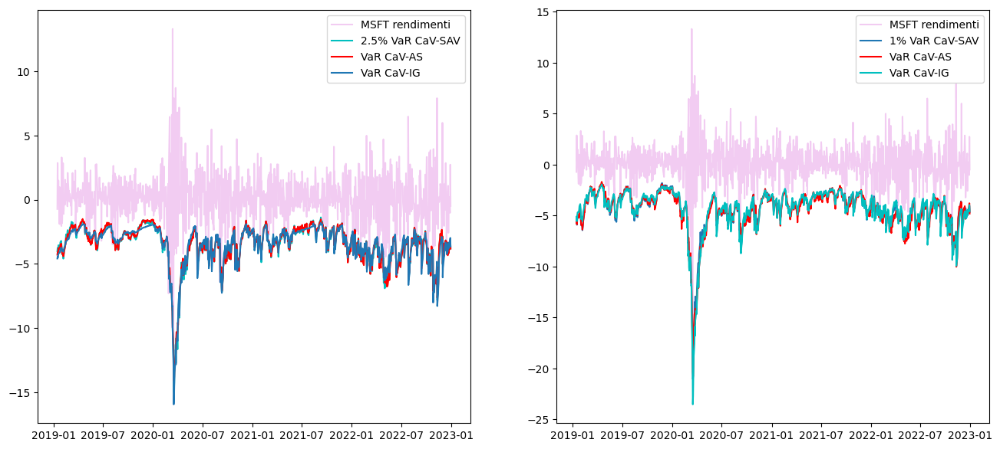

In [132]:
# Figura 25 MSFT
fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
ax[0].plot(var25_caviar, 'c', label='2.5% VaR CaV-SAV')
ax[0].plot(var25_cavas, 'r-', label='VaR CaV-AS')
ax[0].plot(var25_cavig, '-', label='VaR CaV-IG')
ax[0].legend()
# Figure 1%
ax[1].plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
ax[1].plot(var1_caviar, '-', label='1% VaR CaV-SAV')
ax[1].plot(var1_cavas, 'r-', label='VaR CaV-AS')
ax[1].plot(var1_cavig, 'c-', label='VaR CaV-IG')
ax[1].legend()
plt.show()

In [133]:
# Verifica accuratezza previsioni VaR 2.5% 
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch, r_msft[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t, r_msft[frst_fc:], 0.025),
    'C-SAV': check_var_fc(var25_caviar, r_msft[frst_fc:], 0.025),
    'C-AS': check_var_fc(var25_cavas, r_msft[frst_fc:], 0.025),
    'C-IG': check_var_fc(var25_cavig, r_msft[frst_fc:], 0.025),
    },
    index=['Viol.', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t,C-SAV,C-AS,C-IG
Viol.,43.000,36.000,37.000,36.000,41.000
$\hat{p}$,0.043,0.036,0.037,0.036,0.041
$\hat{p}/p$,1.720,1.440,1.480,1.440,1.640
UC,0.000,0.026,0.015,0.026,0.001
Ind,0.910,0.778,0.731,0.778,0.555
DQ,0.003,0.023,0.005,0.040,0.007
Loss,135.394,132.593,130.157,131.121,131.431


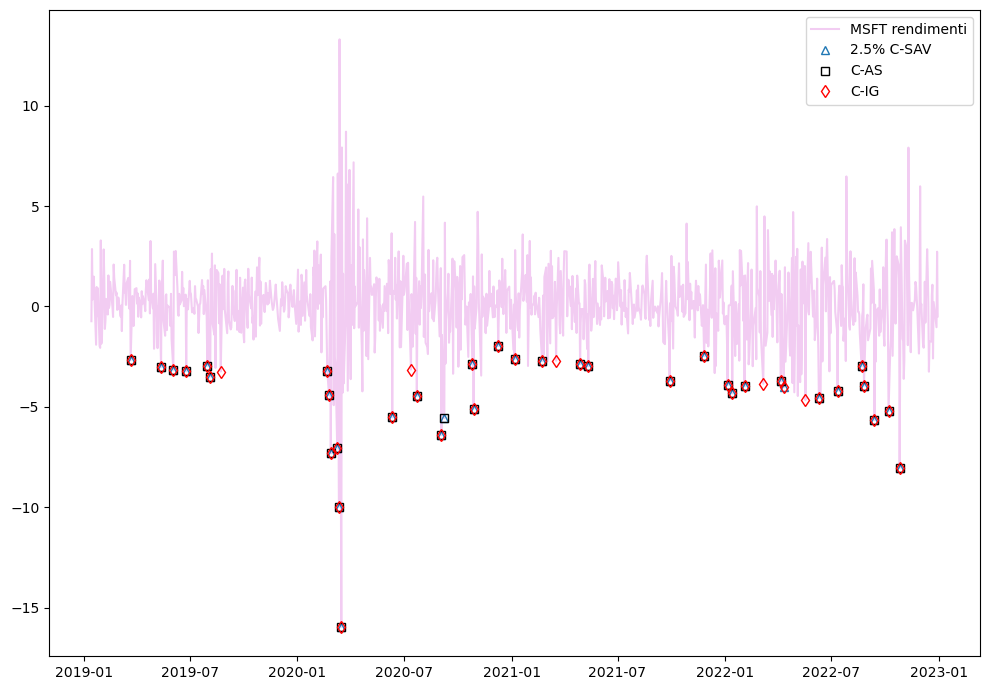

In [134]:
# Figura 26 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_caviar], '^', mfc='none', label='2.5% C-SAV')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_cavas], 'sk', mfc='none', label='C-AS')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_cavig], 'dr', mfc='none', label='C-IG')
plt.legend()
plt.tight_layout()
plt.show()

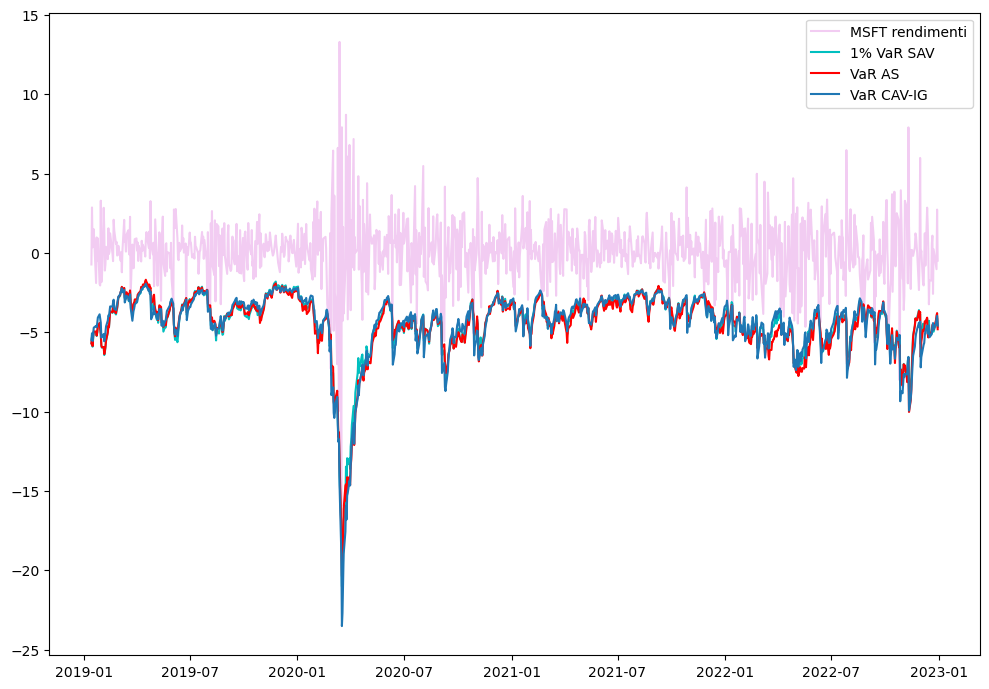

In [135]:
# Figura 27 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_caviar, 'c', label='1% VaR SAV')
plt.plot(var1_cavas, 'r-', label='VaR AS')
plt.plot(var1_cavig, '-', label='VaR CAV-IG')
plt.legend()
plt.tight_layout()
plt.show()

In [136]:
# Verifica accuratezza previsioni 1% 
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch, r_msft[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t, r_msft[frst_fc:], 0.01),
    'C-SAV': check_var_fc(var1_caviar, r_msft[frst_fc:], 0.01),
    'C-AS': check_var_fc(var1_cavas, r_msft[frst_fc:], 0.01),
    'C-IG': check_var_fc(var1_cavig, r_msft[frst_fc:], 0.01),
    },
    index=['Viol.', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t,C-SAV,C-AS,C-IG
Viol.,25.000,12.000,16.000,17.000,17.000
$\hat{p}$,0.025,0.012,0.016,0.017,0.017
$\hat{p}/p$,2.500,1.200,1.600,1.700,1.700
UC,0.000,0.525,0.057,0.026,0.026
Ind,0.257,0.589,0.470,0.443,0.443
DQ,0.000,0.283,0.314,0.057,0.174
Loss,67.375,60.193,60.018,60.591,61.383


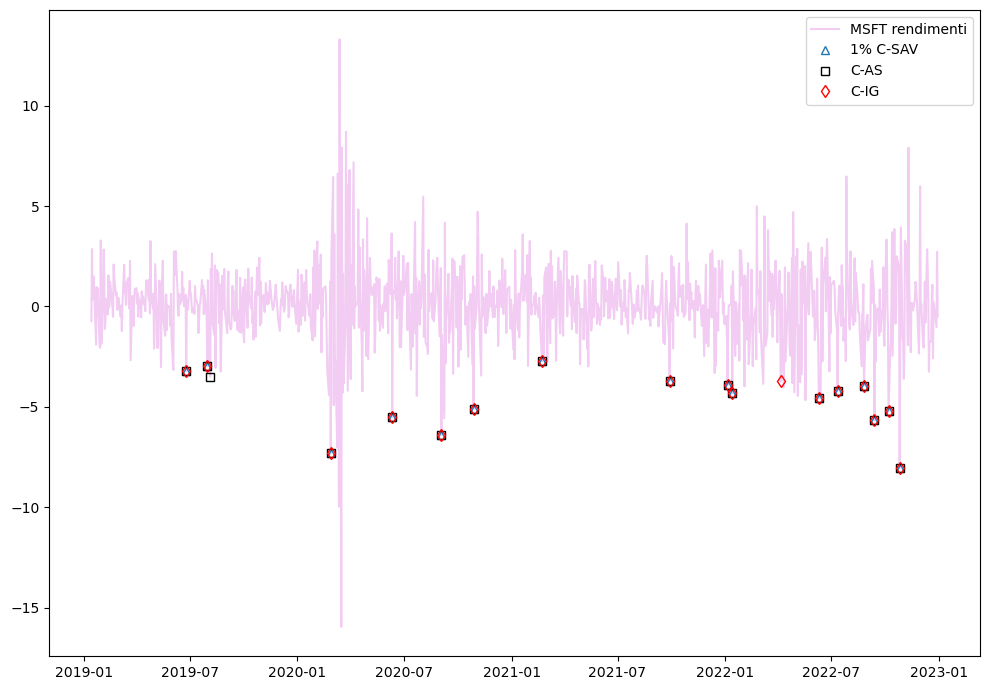

In [137]:
# Figura 28 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_caviar], '^', mfc='none', label='1% C-SAV')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_cavas], 'sk', mfc='none', label='C-AS')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_cavig], 'dr', mfc='none', label='C-IG')
plt.legend()
plt.tight_layout()
plt.show()

### CAViaR Apple

In [138]:
# Stima del modello CAViaR-SAV in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead

r = r_apple[:last_in]
b01 = [-0.1, 0.4, -0.1]
b02 = [-0.15, 0.8, -0.2]
b03 = [-0.2, 0.6, -0.3]
b04 = [-0.25, 0.9, -0.25]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviar25_par1 = fmin(caviar_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviar25_par2 = fmin(caviar_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviar25_par3 = fmin(caviar_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviar25_par4 = fmin(caviar_loss, x0=b04, args=(r, 0.025, q025), disp=True)
caviar1_par1 = fmin(caviar_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviar1_par2 = fmin(caviar_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviar1_par3 = fmin(caviar_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviar1_par4 = fmin(caviar_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviar25_par1.round(4))
print(caviar25_par2.round(4))
print(caviar25_par3.round(4))
print(caviar25_par4.round(4))
print('=' * 37)
print(caviar1_par1.round(4))
print(caviar1_par2.round(4))
print(caviar1_par3.round(4))
print(caviar1_par4.round(4))

Optimization terminated successfully.
         Current function value: 800.986792
         Iterations: 112
         Function evaluations: 203
Optimization terminated successfully.
         Current function value: 800.986917
         Iterations: 87
         Function evaluations: 160
Optimization terminated successfully.
         Current function value: 800.986868
         Iterations: 127
         Function evaluations: 228
Optimization terminated successfully.
         Current function value: 800.986881
         Iterations: 108
         Function evaluations: 195
Optimization terminated successfully.
         Current function value: 440.637597
         Iterations: 92
         Function evaluations: 167
Optimization terminated successfully.
         Current function value: 442.086949
         Iterations: 96
         Function evaluations: 180
Optimization terminated successfully.
         Current function value: 440.728995
         Iterations: 76
         Function evaluations: 141
Optimizati

Il modello CAViaR-SAV sarà:

$$
Q_{t, 0.025} = -0.0489 + 0.9319 Q_{t-1, 0.025} - 0.1435 |r_{t-1}| \\
Q_{t, 0.01} = -0.2227 + 0.8631 Q_{t-1, 0.01} - 0.3306 |r_{t-1}|
$$

In [139]:
# Stima del modello CAViaR-AS in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead

r = r_apple[:last_in]
b01 = [-0.15, 0.85, -0.25, -0.25]
b02 = [-0.15, 0.8, -0.2, -0.1]
b03 = [-0.2, 0.6, -0.3, -0.2]
b04 = [-0.05, 0.9, -0.25, -0.1]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviaras25_par1 = fmin(caviar_as_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviaras25_par2 = fmin(caviar_as_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviaras25_par3 = fmin(caviar_as_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviaras25_par4 = fmin(caviar_as_loss, x0=b04, args=(r, 0.025, q025), disp=True)
caviaras1_par1 = fmin(caviar_as_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviaras1_par2 = fmin(caviar_as_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviaras1_par3 = fmin(caviar_as_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviaras1_par4 = fmin(caviar_as_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviaras25_par1.round(4))
print(caviaras25_par2.round(4))
print(caviaras25_par3.round(4))
print(caviaras25_par4.round(4))
print('=' * 37)
print(caviaras1_par1.round(4))
print(caviaras1_par2.round(4))
print(caviaras1_par3.round(4))
print(caviaras1_par4.round(4))

Optimization terminated successfully.
         Current function value: 799.859839
         Iterations: 254
         Function evaluations: 428
Optimization terminated successfully.
         Current function value: 799.925986
         Iterations: 123
         Function evaluations: 210
Optimization terminated successfully.
         Current function value: 799.903218
         Iterations: 291
         Function evaluations: 480
Optimization terminated successfully.
         Current function value: 800.110565
         Iterations: 114
         Function evaluations: 199
Optimization terminated successfully.
         Current function value: 437.904169
         Iterations: 162
         Function evaluations: 273
Optimization terminated successfully.
         Current function value: 438.700326
         Iterations: 124
         Function evaluations: 216
Optimization terminated successfully.
         Current function value: 437.865749
         Iterations: 262
         Function evaluations: 448
Optimi

CAViaR-AS:

$$
Q_{t, 0.025} = -0.1177 + 0.9058 Q_{t-1, 0.025} - 0.2276 |r_{t-1}|I^{-}_{t-1} - 0.1141 |r_{t-1}|I^{+}_{t-1} \\
Q_{t, 0.01} = -0.1887 + 0.8778 Q_{t-1, 0.01} - 0.3995 |r_{t-1}|I^{-}_{t-1} - 0.2146 |r_{t-1}|I^{+}_{t-1}
$$


In [140]:
# Stima del modello CAViaR-IG in-sample, con diversi set di parametri iniziali
# fmin utilizza l'algoritmo simplex di Nelder-Mead

r = r_apple[:last_in]
b01 = [0.1, 0.4, 0.3]
b02 = [0.05, 0.8, 0.1]
b03 = [0.02, 0.6, 0.3]
b04 = [0.15, 0.9, 0.05]
q025 = np.quantile(r, 0.025)
q01 = np.quantile(r, 0.01)
caviarig25_par1 = fmin(caviar_ig_loss, x0=b01, args=(r, 0.025, q025), disp=True)
caviarig25_par2 = fmin(caviar_ig_loss, x0=b02, args=(r, 0.025, q025), disp=True)
caviarig25_par3 = fmin(caviar_ig_loss, x0=b03, args=(r, 0.025, q025), disp=True)
caviarig25_par4 = fmin(caviar_ig_loss, x0=b04, args=(r, 0.025, q025), disp=True)
b01 = [0.1, 0.7, 0.4]
b02 = [0.05, 0.8, 0.6]
b03 = [0.02, 0.6, 0.3]
b04 = [0.15, 0.9, 0.5]
caviarig1_par1 = fmin(caviar_ig_loss, x0=b01, args=(r, 0.01, q01), disp=True)
caviarig1_par2 = fmin(caviar_ig_loss, x0=b02, args=(r, 0.01, q01), disp=True)
caviarig1_par3 = fmin(caviar_ig_loss, x0=b03, args=(r, 0.01, q01), disp=True)
caviarig1_par4 = fmin(caviar_ig_loss, x0=b04, args=(r, 0.01, q01), disp=True)
print(caviarig25_par1)
print(caviarig25_par2)
print(caviarig25_par3)
print(caviarig25_par4)
print('=' * 37)
print(caviarig1_par1)
print(caviarig1_par2)
print(caviarig1_par3)
print(caviarig1_par4)

Optimization terminated successfully.
         Current function value: 815.296894
         Iterations: 78
         Function evaluations: 139
Optimization terminated successfully.
         Current function value: 817.593843
         Iterations: 81
         Function evaluations: 149
Optimization terminated successfully.
         Current function value: 818.047981
         Iterations: 91
         Function evaluations: 172
Optimization terminated successfully.
         Current function value: 815.258223
         Iterations: 105
         Function evaluations: 182
Optimization terminated successfully.
         Current function value: 451.046235
         Iterations: 103
         Function evaluations: 188
Optimization terminated successfully.
         Current function value: 447.522659
         Iterations: 225
         Function evaluations: 393
Optimization terminated successfully.
         Current function value: 453.648953
         Iterations: 82
         Function evaluations: 158
Optimizati

CAViaR-IG:

$$
Q_{t, 0.025} = - \sqrt{0.14229006 + 0.94990319 Q_{t-1, 0.025}^2 + 0.1472512 r_{t-1}^2} \\
Q_{t, 0.01} = -\sqrt{1.28511597+ 0.86198772 Q_{t-1, 0.01}^2 + 0.67724715 r_{t-1}^2}
$$

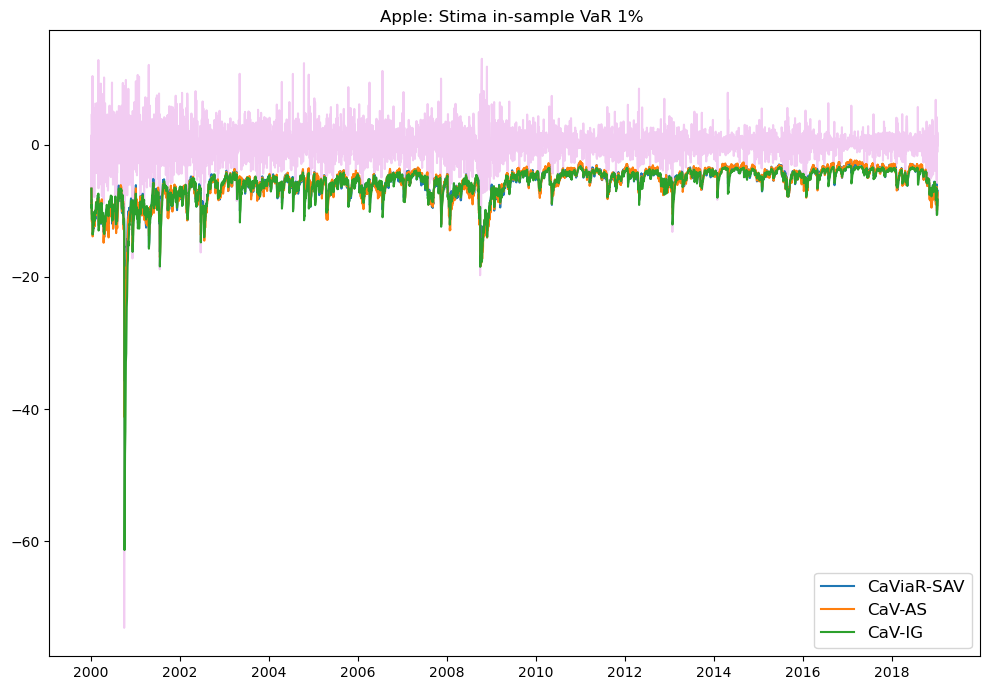

In [141]:
# Figura 23 AAPL
q01 = np.quantile(r, 0.01)
cav1_is_a = caviar_update(caviar1_par4, r, 0.01, q01)
cav1_ig_is_a = caviar_ig_update(caviarig1_par2, r, 0.01, q01)
cav1_as_is_a = caviar_as_update(caviaras1_par3, r, 0.01, q01)

q025 = np.quantile(r, 0.025)
cav25_is_a = caviar_update(caviar25_par1, r, 0.025, q025)
cav25_ig_is_a = caviar_ig_update(caviarig25_par4, r, 0.025, q025)
cav25_as_is_a = caviar_as_update(caviaras25_par1, r, 0.025, q025)


plt.figure(figsize=(10, 7))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(cav1_is_a, label='CaViaR-SAV')
plt.plot(cav1_as_is_a, label='CaV-AS')
plt.plot(cav1_ig_is_a, label='CaV-IG')
plt.title('Apple: Stima in-sample VaR 1% ')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

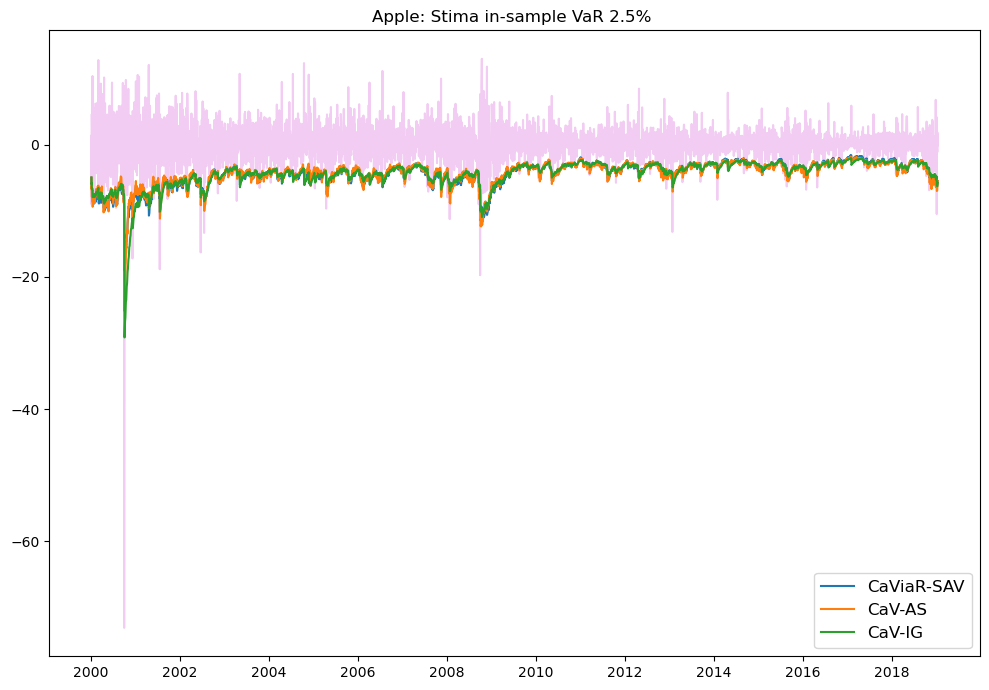

In [142]:
# Figura 24 AAPL
plt.figure(figsize=(10, 7))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(cav25_is_a, label='CaViaR-SAV')
plt.plot(cav25_as_is_a, label='CaV-AS')
plt.plot(cav25_ig_is_a, label='CaV-IG')
plt.title('Apple: Stima in-sample VaR 2.5% ')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [143]:
'''# VaR forecasting CaViaR
# One-day-ahead VaR forecasts, updating parameters every 25 days
n_fore = len(r_apple[frst_fc:])

# VaR
var25_caviar_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_caviar_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var25_cavas_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_cavas_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var25_cavig_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_cavig_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')


n_wind = len(r_apple[:last_in])
for i in tqdm(range(n_fore)):
    if i % 50 == 0:
        r = r_apple[i:(i + n_wind)]
        q025 = np.quantile(r, 0.025)
        q01 = np.quantile(r, 0.01)
        
        caviar_b0_1 = [-0.25, 0.9, -0.25]
        caviar_b0_25 = [-0.1, 0.4, -0.1]
        caviar25_par = fmin(caviar_loss, x0=caviar_b0_25, args=(r, 0.025, q025), disp=False)
        caviar1_par = fmin(caviar_loss, x0=caviar_b0_1, args=(r, 0.01, q01), disp=False)
        
        caviaras_b0_1 = [-0.2, 0.6, -0.3, -0.2]
        caviaras_b0_25 = [-0.15, 0.85, -0.25, -0.25]
        caviaras25_par = fmin(caviar_as_loss, x0=caviaras_b0_25, args=(r, 0.025, q025), disp=False)
        caviaras1_par = fmin(caviar_as_loss, x0=caviaras_b0_1, args=(r, 0.01, q01), disp=False)
        
        caviarig_b0_1 = [0.05, 0.8, 0.6]
        caviarig_b0_25 = [0.15, 0.9, 0.05]
        caviarig25_par = fmin(caviar_ig_loss, x0=caviarig_b0_25, args=(r, 0.025, q025), disp=False)
        caviarig1_par = fmin(caviar_ig_loss, x0=caviarig_b0_1, args=(r, 0.01, q01), disp=False)
        
        v0 = np.var(r_apple[i:(i + n_wind)])
        
            
    # CaViaR - SAV
    var25 = caviar_update(caviar25_par, r_apple, 0.025, q025)
    var1 = caviar_update(caviar1_par, r_apple, 0.01, q01)
    var25_caviar_a[i] = var25.loc[var25_caviar_a.index[i]]
    var1_caviar_a[i] = var1.loc[var1_caviar_a.index[i]]
    
    # CaViaR - AS
    var25 = caviar_as_update(caviaras25_par, r_apple, 0.025, q025)
    var1 = caviar_as_update(caviaras1_par, r_apple, 0.01, q01)
    var25_cavas_a[i] = var25.loc[var25_cavas_a.index[i]]
    var1_cavas_a[i] = var1.loc[var1_cavas_a.index[i]]
    
    # CaViaR - IG
    var25 = caviar_ig_update(caviarig25_par, r_apple, 0.025, q025)
    var1 = caviar_ig_update(caviarig1_par, r_apple, 0.01, q01)
    var25_cavig_a[i] = var25.loc[var25_cavig_a.index[i]]
    var1_cavig_a[i] = var1.loc[var1_cavig_a.index[i]]'''

"# VaR forecasting CaViaR\n# One-day-ahead VaR forecasts, updating parameters every 25 days\nn_fore = len(r_apple[frst_fc:])\n\n# VaR\nvar25_caviar_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar1_caviar_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar25_cavas_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar1_cavas_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar25_cavig_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar1_cavig_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\n\n\nn_wind = len(r_apple[:last_in])\nfor i in tqdm(range(n_fore)):\n    if i % 50 == 0:\n        r = r_apple[i:(i + n_wind)]\n        q025 = np.quantile(r, 0.025)\n        q01 = np.quantile(r, 0.01)\n        \n        caviar_b0_1 = [-0.25, 0.9, -0.25]\n        caviar_b0_25 = [-0.1, 0.4, -0.1]\n        caviar25_par = fmin(caviar_loss, x0=caviar_b0_25, args=(r, 0.025, q025), disp=False)\n        caviar1_par = fmin(

In [144]:
'''# per salvare le previsioni
data_apple_cav25 = pd.DataFrame({'var25_caviar': var25_caviar_a, 'var25_cavas': var25_cavas_a, 'var25_cavig': var25_cavig_a}) 
data_apple_cav25.to_csv("apple_cav_data25.csv")

data_apple_cav1 = pd.DataFrame({'var1_caviar': var1_caviar_a, 'var1_cavas': var1_cavas_a, 'var1_cavig': var1_cavig_a}) 
data_apple_cav1.to_csv("apple_cav_data1.csv")'''

'# per salvare le previsioni\ndata_apple_cav25 = pd.DataFrame({\'var25_caviar\': var25_caviar_a, \'var25_cavas\': var25_cavas_a, \'var25_cavig\': var25_cavig_a}) \ndata_apple_cav25.to_csv("apple_cav_data25.csv")\n\ndata_apple_cav1 = pd.DataFrame({\'var1_caviar\': var1_caviar_a, \'var1_cavas\': var1_cavas_a, \'var1_cavig\': var1_cavig_a}) \ndata_apple_cav1.to_csv("apple_cav_data1.csv")'

In [145]:
#Per importare le previsioni 
data_apple_cav25 = pd.read_csv("apple_cav_data25.csv", index_col = 'Date')
var25_caviar_a = pd.Series(data=data_apple_cav25.loc[:,'var25_caviar'].values, index=r_apple[frst_fc:].index, dtype='float64')
var25_cavas_a = pd.Series(data=data_apple_cav25.loc[:,'var25_cavas'].values, index=r_apple[frst_fc:].index, dtype='float64')
var25_cavig_a = pd.Series(data=data_apple_cav25.loc[:,'var25_cavig'].values, index=r_apple[frst_fc:].index, dtype='float64')

data_apple_cav1 = pd.read_csv("apple_cav_data1.csv", index_col = 'Date')
var1_caviar_a = pd.Series(data=data_apple_cav1.loc[:,'var1_caviar'].values, index=r_apple[frst_fc:].index, dtype='float64')
var1_cavas_a = pd.Series(data=data_apple_cav1.loc[:,'var1_cavas'].values, index=r_apple[frst_fc:].index, dtype='float64')
var1_cavig_a = pd.Series(data=data_apple_cav1.loc[:,'var1_cavig'].values, index=r_apple[frst_fc:].index, dtype='float64')

In [146]:
var25_caviar[0], var1_caviar[0]

(-4.01779895574625, -5.700310287676963)

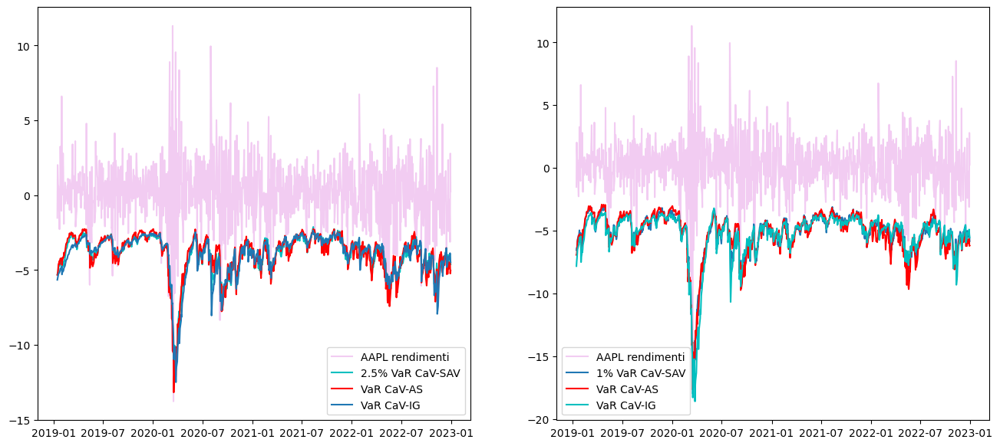

In [147]:
# Figura 25 AAPL
fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
ax[0].plot(var25_caviar_a, 'c', label='2.5% VaR CaV-SAV')
ax[0].plot(var25_cavas_a, 'r-', label='VaR CaV-AS')
ax[0].plot(var25_cavig_a, '-', label='VaR CaV-IG')
ax[0].legend()
# Figure 1%
ax[1].plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
ax[1].plot(var1_caviar_a, '-', label='1% VaR CaV-SAV')
ax[1].plot(var1_cavas_a, 'r-', label='VaR CaV-AS')
ax[1].plot(var1_cavig_a, 'c-', label='VaR CaV-IG')
ax[1].legend()
plt.show()

In [148]:
# Verifica accuratezza previsioni VaR 2.5% VaR 
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch_a, r_apple[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t_a, r_apple[frst_fc:], 0.025),
    'C-SAV': check_var_fc(var25_caviar_a, r_apple[frst_fc:], 0.025),
    'C-AS': check_var_fc(var25_cavas_a, r_apple[frst_fc:], 0.025),
    'C-IG': check_var_fc(var25_cavig_a, r_apple[frst_fc:], 0.025),
    },
    index=['Viol.', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t,C-SAV,C-AS,C-IG
Viol.,32.000,31.000,30.000,26.000,30.000
$\hat{p}$,0.032,0.031,0.030,0.026,0.030
$\hat{p}/p$,1.280,1.240,1.200,1.040,1.200
UC,0.156,0.224,0.311,0.839,0.311
Ind,0.146,0.159,0.173,0.238,0.173
DQ,0.079,0.075,0.010,0.044,0.009
Loss,141.143,143.817,141.440,137.633,143.093


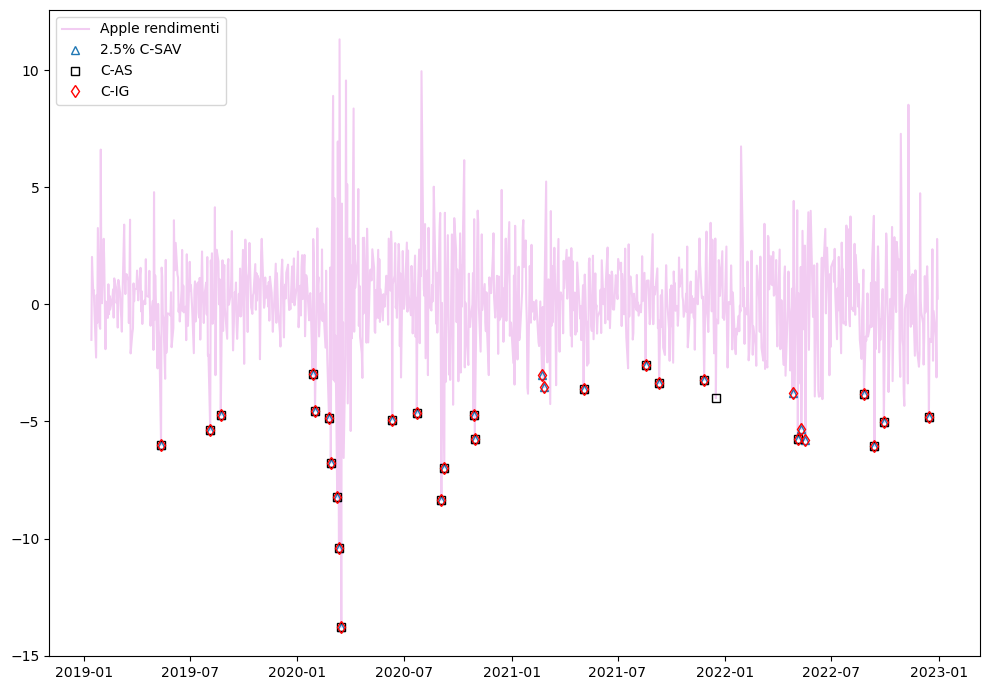

In [149]:
# Figura 26 Apple
plt.figure(figsize=(10, 7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='Apple rendimenti')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_caviar_a], '^', mfc='none', label='2.5% C-SAV')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_cavas_a], 'sk', mfc='none', label='C-AS')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_cavig_a], 'dr', mfc='none', label='C-IG')
plt.legend()
plt.tight_layout()
plt.show()

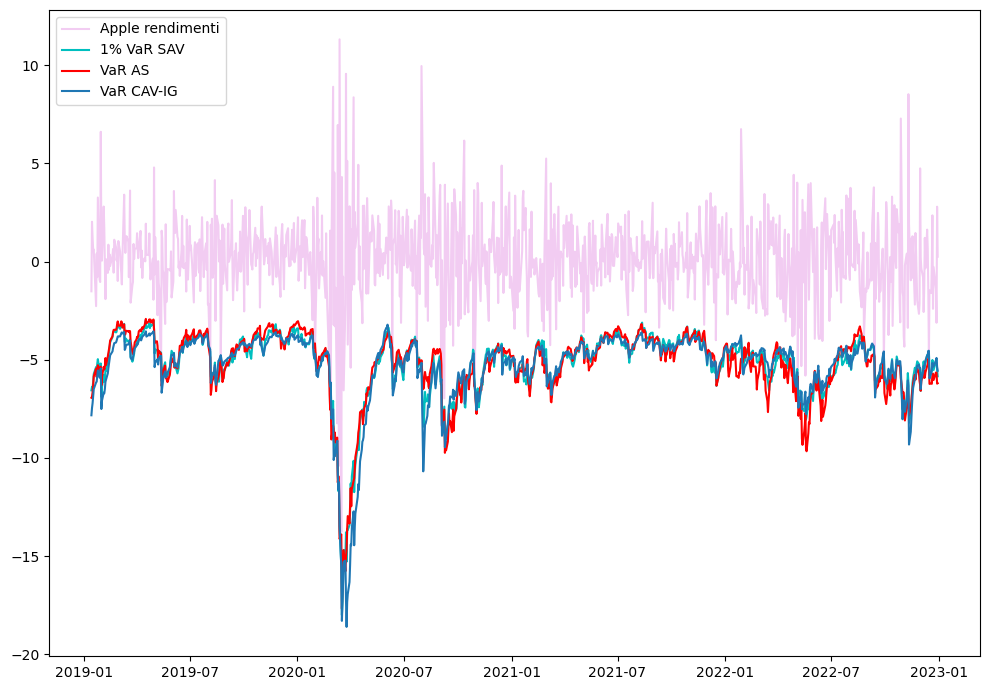

In [150]:
# Figura 27 Apple
plt.figure(figsize=(10, 7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='Apple rendimenti')
plt.plot(var1_caviar_a, 'c', label='1% VaR SAV')
plt.plot(var1_cavas_a, 'r-', label='VaR AS')
plt.plot(var1_cavig_a, '-', label='VaR CAV-IG')
plt.legend()
plt.tight_layout()
plt.show()

In [151]:
# Verifica accuratezza previsioni 1% 
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch_a, r_apple[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t_a, r_apple[frst_fc:], 0.01),
    'C-SAV': check_var_fc(var1_caviar_a, r_apple[frst_fc:], 0.01),
    'C-AS': check_var_fc(var1_cavas_a, r_apple[frst_fc:], 0.01),
    'C-IG': check_var_fc(var1_cavig_a, r_apple[frst_fc:], 0.01),
    },
    index=['Viol.', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t,C-SAV,C-AS,C-IG
Viol.,22.000,14.000,9.000,8.000,10.000
$\hat{p}$,0.022,0.014,0.009,0.008,0.010
$\hat{p}/p$,2.200,1.400,0.900,0.800,1.000
UC,0.000,0.204,0.751,0.525,1.000
Ind,0.320,0.528,0.686,0.719,0.653
DQ,0.000,0.000,0.998,0.959,0.166
Loss,67.513,65.473,60.078,60.998,61.700


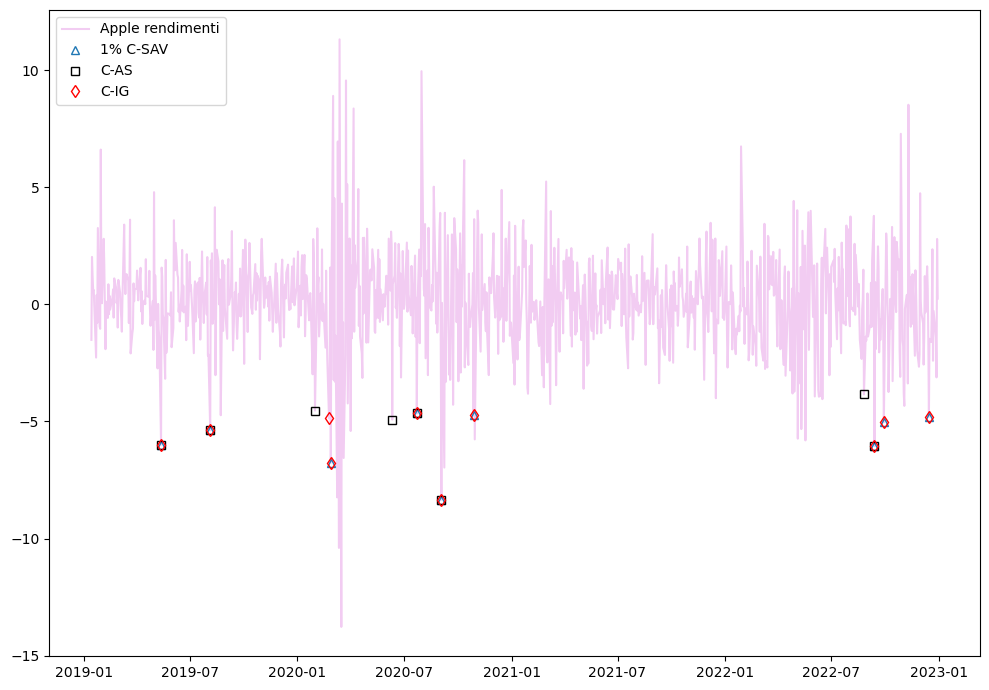

In [152]:
# Figura 28 AAPL
plt.figure(figsize=(10, 7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='Apple rendimenti')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_caviar_a], '^', mfc='none', label='1% C-SAV')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_cavas_a], 'sk', mfc='none', label='C-AS')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_cavig_a], 'dr', mfc='none', label='C-IG')
plt.legend()
plt.tight_layout()
plt.show()

In [153]:
# Calcolo quantile loss MSFT VaR 1%
r=r_msft[frst_fc:]
data_q1 = pd.DataFrame(np.c_[var1_garch,var1_garch_t,var1_caviar,var1_cavas, var1_cavig], columns=['G','G-t','SAV','AS','IG'], index=r_msft[frst_fc:].index)
data_qloss1 = data_q1
for model in ['G','G-t','SAV','AS','IG']:
    data_qloss1[model] = qloss_t(data_q1[model],r,0.01)
    
data_qloss1

,G,G-t,SAV,AS,IG
Date,,,,,
2019-01-14,0.046276,0.056208,0.049681,0.049755,0.047510
2019-01-15,0.080817,0.090354,0.081758,0.082014,0.079303
2019-01-16,0.056363,0.066107,0.062651,0.062210,0.059080
2019-01-17,0.058353,0.067676,0.060352,0.060023,0.057897
2019-01-18,0.064881,0.073826,0.064719,0.064369,0.062030
...,...,...,...,...,...
2022-12-23,0.045654,0.054675,0.051976,0.050532,0.050579
2022-12-27,0.033708,0.042426,0.036914,0.035157,0.036964
2022-12-28,0.029192,0.037610,0.031593,0.029166,0.031247


In [154]:
# Calcolo quantile loss AAPL VaR 1%
r=r_apple[frst_fc:]
data_a_q1 = pd.DataFrame(np.c_[var1_garch,var1_garch_t,var1_caviar,var1_cavas, var1_cavig], columns=['G','G-t','SAV','AS','IG'], index=r_apple[frst_fc:].index)
data_a_qloss1 = data_a_q1
for model in ['G','G-t','SAV','AS','IG']:
    data_a_qloss1[model] = qloss_t(data_a_q1[model],r,0.01)
    
data_a_qloss1

,G,G-t,SAV,AS,IG
Date,,,,,
2019-01-14,0.038447,0.048379,0.041852,0.041926,0.039681
2019-01-15,0.072485,0.082021,0.073425,0.073681,0.070970
2019-01-16,0.064988,0.074733,0.071277,0.070836,0.067706
2019-01-17,0.057275,0.066599,0.059275,0.058945,0.056820
2019-01-18,0.056150,0.065095,0.055987,0.055637,0.053299
...,...,...,...,...,...
2022-12-23,0.040588,0.049608,0.046909,0.045466,0.045512
2022-12-27,0.027174,0.035892,0.030380,0.028624,0.030431
2022-12-28,0.008334,0.016752,0.010735,0.008308,0.010389


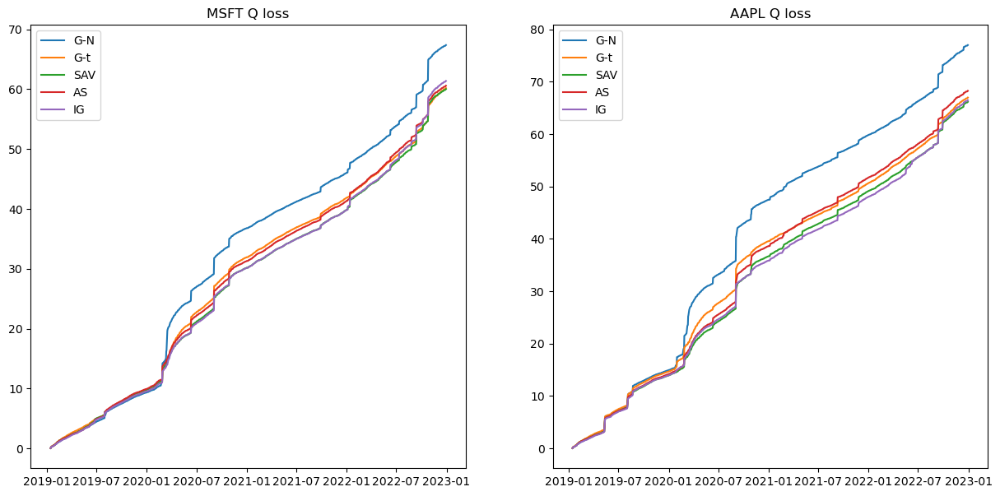

In [155]:
# Figura MSFT+AAPL
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].plot(np.cumsum(data_qloss1.iloc[:,0]), label='G-N')
ax[0].plot(np.cumsum(data_qloss1.iloc[:,1]), label='G-t')
ax[0].plot(np.cumsum(data_qloss1.iloc[:,2]), label='SAV')
ax[0].plot(np.cumsum(data_qloss1.iloc[:,3]), label='AS')
ax[0].plot(np.cumsum(data_qloss1.iloc[:,4]), label='IG')
ax[0].legend()
ax[0].set_title('MSFT Q loss')
ax[1].plot(np.cumsum(data_a_qloss1.iloc[:,0]), label='G-N')
ax[1].plot(np.cumsum(data_a_qloss1.iloc[:,1]), label='G-t')
ax[1].plot(np.cumsum(data_a_qloss1.iloc[:,2]), label='SAV')
ax[1].plot(np.cumsum(data_a_qloss1.iloc[:,3]), label='AS')
ax[1].plot(np.cumsum(data_a_qloss1.iloc[:,4]), label='IG')
ax[1].legend()
ax[1].set_title('AAPL Q loss')
plt.show()

### ES-CAViaR

In [156]:
'''
ES-CaViaR-mult loss function
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: scalar, loss function value.
'''
def es_caviar_m_loss(b, r, p, q0, e0):
    n = len(r)
    q = np.empty(n)
    es = np.empty(n)
    q[0] = q0
    es[0] = e0
    for t in range(1, n):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
    
    es = q * (1 + np.exp(b[3]))
        
    i1 = (r < q).astype(int)
    aes = es ** (-1) * (p-1)
    ees = (r-q) * (p - i1)
    l =  np.sum(-np.log(aes)) - np.sum(ees / es) / p
    l = l / n
    
    return l    

In [157]:
'''
ES-CaViaR-mult update function for VaR
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def es_caviar_m_update_v(b, r, p, q0, e0):
    q = pd.Series(index=r.index, dtype='float64')
    es = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    es[0] = e0
    for t in range(1, len(r)):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        
    es = q * (1 + np.exp(b[3]))    
    return q

In [158]:
'''
ES-CaViaR-mult update function for ES
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def es_caviar_m_update_e(b, r, p, q0, e0):
    q = pd.Series(index=r.index, dtype='float64')
    es = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    es[0] = e0
    for t in range(1, len(r)):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        
    es = q * (1 + np.exp(b[3]))    
    return es

In [159]:
'''
ES-CaViaR-add loss function
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: scalar, loss function value.
'''
def es_caviar_a_loss(b, r, p, q0, e0):
    
    #if b[1] >= 1:
    #    return np.inf
    
    if b[5] >= 1:
        return np.inf
    
    if b[3] < 0:
        return np.inf
    
    if b[4] < 0:
        return np.inf
    
    if b[5] < 0:
        return np.inf
    
    n = len(r)
    q = np.empty(n)
    es = np.empty(n)
    w = np.empty(n)
    q[0] = q0
    es[0] = e0
    w[0] = q0 - e0
    for t in range(1, n):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        if r[t-1] < q[t-1]:
            w[t] = b[3] + b[4] * (q[t-1] - r[t-1]) + b[5] * w[t-1]
        else:
            w[t] = w[t-1]
            
        es[t] = q[t] - w[t]    
           
    i1 = (r < q).astype(int)
    aes = es ** (-1) * (p-1)
    ees = (r-q) * (p - i1)
    l =  np.sum(-np.log(aes)) - np.sum(ees / es) / p
    l = l / n
    
    return l    

In [160]:
'''
ES-CaViaR-add update function for VaR
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def es_caviar_a_update_v(b, r, p, q0, e0):
    q = pd.Series(index=r.index, dtype='float64')
    es = pd.Series(index=r.index, dtype='float64')
    w = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    es[0] = e0
    w[0] = q0 - e0
    for t in range(1, len(r)):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        if r[t-1] < q[t-1]:
            w[t] = b[3] + b[4] * (q[t-1] - r[t-1]) + b[5] * w[t-1]
        else:
            w[t] = w[t-1]
            
        es[t] = q[t] - w[t]    
    
    return q

In [161]:
'''
ES-CaViaR-add update function for ES
b: vector of model parameters.
r: vector of returns.
p: scalar, indicating probability level.
q0: scalar, initial quantile.
returns: vector of one-step-ahead forecasts, aligned with r.
'''
def es_caviar_a_update_e(b, r, p, q0, e0):
    q = pd.Series(index=r.index, dtype='float64')
    es = pd.Series(index=r.index, dtype='float64')
    w = pd.Series(index=r.index, dtype='float64')
    q[0] = q0
    es[0] = e0
    w[0] = q0 - e0
    for t in range(1, len(r)):
        q[t] = b[0] + b[1] * q[t - 1] + b[2] * np.abs(r[t - 1])
        if r[t-1] < q[t-1]:
            w[t] = b[3] + b[4] * (q[t-1] - r[t-1]) + b[5] * w[t-1]
        else:
            w[t] = w[t-1]
            
        es[t] = q[t] - w[t]  
    
    return es

### ES-CAViaR MSFT

In [162]:
# Stima in-sample del modello ES-CAViaR-mult con differenti parametri iniziali

r = r_msft[:last_in]
b01 = [-0.1, 0.4, -0.1, -1]
b02 = [-0.15, 0.8, -0.2, -0.5]
b03 = [-0.2, 0.6, -0.3, -1.5]
b04 = [-0.1, 0.7, -0.5, -1]
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
escavm25_par1 = fmin(es_caviar_m_loss, x0=b01, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par2 = fmin(es_caviar_m_loss, x0=b02, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par3 = fmin(es_caviar_m_loss, x0=b03, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par4 = fmin(es_caviar_m_loss, x0=b04, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm1_par1 = fmin(es_caviar_m_loss, x0=b01, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par2 = fmin(es_caviar_m_loss, x0=b02, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par3 = fmin(es_caviar_m_loss, x0=b03, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par4 = fmin(es_caviar_m_loss, x0=b04, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)

print(escavm25_par1.round(4))
print(escavm25_par2.round(4))
print(escavm25_par3.round(4))
print(escavm25_par4.round(4))
print('=' * 37)
print(escavm1_par1.round(4))
print(escavm1_par2.round(4))
print(escavm1_par3.round(4))
print(escavm1_par4.round(4))
len(r)

Optimization terminated successfully.
         Current function value: 2.528760
         Iterations: 312
         Function evaluations: 533
Optimization terminated successfully.
         Current function value: 2.528775
         Iterations: 247
         Function evaluations: 408
Optimization terminated successfully.
         Current function value: 2.528760
         Iterations: 189
         Function evaluations: 321
Optimization terminated successfully.
         Current function value: 2.528760
         Iterations: 197
         Function evaluations: 331
Optimization terminated successfully.
         Current function value: 2.809526
         Iterations: 206
         Function evaluations: 360
Optimization terminated successfully.
         Current function value: 2.809485
         Iterations: 150
         Function evaluations: 264
Optimization terminated successfully.
         Current function value: 2.807463
         Iterations: 240
         Function evaluations: 386
Optimization termina

4786

ES-CaViaR-M:

$$
2.5\% \,\,: \,\, Q_{t} = -0.0678 + 0.8951 Q_{t-1} - 0.2207 |r_{t-1}| \,\,;\,\, ES_t = Q_t (1 + \exp(-0.7571)) \\
1\% \,\,: \,\, Q_{t} = -0.184 + 0.8455  Q_{t-1} - 0.3744 |r_{t-1}| \,\,;\,\, ES_t = Q_t (1 + \exp(-0.6589))
$$


In [163]:
# Stima in-sample del modello ES-CAViaR-add

r = r_msft[:last_in]
b01 = [-0.1, 0.85, -0.1, 0.1, 0.1, 0.9]
b02 = [-0.15, 0.8, -0.2, 0.1, 0.2, 0.6]
b03 = [-0.2, 0.6, -0.05, 0.01, 0.05, 0.75]
b04 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
escava25_par1 = fmin(es_caviar_a_loss, x0=b01, args=(r, 0.025, q025, e025), disp=True)
escava25_par2 = fmin(es_caviar_a_loss, x0=b02, args=(r, 0.025, q025, e025), disp=True)
escava25_par3 = fmin(es_caviar_a_loss, x0=b03, args=(r, 0.025, q025, e025), disp=True)
escava25_par4 = fmin(es_caviar_a_loss, x0=b04, args=(r, 0.025, q025, e025), disp=True)
escava1_par1 = fmin(es_caviar_a_loss, x0=b01, args=(r, 0.01, q01, e01), disp=True)
escava1_par2 = fmin(es_caviar_a_loss, x0=b02, args=(r, 0.01, q01, e01), disp=True)
escava1_par3 = fmin(es_caviar_a_loss, x0=b03, args=(r, 0.01, q01, e01), disp=True)
escava1_par4 = fmin(es_caviar_a_loss, x0=b04, args=(r, 0.01, q01, e01), disp=True)
print(escava25_par1.round(4))
print(escava25_par2.round(4))
print(escava25_par3.round(4))
print(escava25_par4.round(4))
print('=' * 37)
print(escava1_par1.round(4))
print(escava1_par2.round(4))
print(escava1_par3.round(4))
print(escava1_par4.round(4))

Optimization terminated successfully.
         Current function value: 2.552886
         Iterations: 340
         Function evaluations: 591
Optimization terminated successfully.
         Current function value: 2.526504
         Iterations: 287
         Function evaluations: 471


C:\Users\Marco\AppData\Local\Temp\ipykernel_2256\225748059.py:45: RuntimeWarning: invalid value encountered in log
  l =  np.sum(-np.log(aes)) - np.sum(ees / es) / p


Optimization terminated successfully.
         Current function value: 2.569201
         Iterations: 165
         Function evaluations: 291
Optimization terminated successfully.
         Current function value: 2.525649
         Iterations: 241
         Function evaluations: 410
Optimization terminated successfully.
         Current function value: 2.805845
         Iterations: 309
         Function evaluations: 508
Optimization terminated successfully.
         Current function value: 2.808464
         Iterations: 535
         Function evaluations: 898
Optimization terminated successfully.
         Current function value: 2.812376
         Iterations: 433
         Function evaluations: 716
Optimization terminated successfully.
         Current function value: 2.803351
         Iterations: 420
         Function evaluations: 693
[-0.1066  0.9167 -0.1376  0.      0.0541  0.9261]
[-0.0672  0.8412 -0.376   0.2515  0.      0.803 ]
[-0.0148  0.9759 -0.055   0.0157  0.0404  0.8986]
[-0.0943  

ES-CaViaR-A models:

2.5\% 
\begin{align*}
Q_{t} &= -0.0943 + 0.8504 Q_{t-1} - 0.3203 |r_{t-1}| \\
   w_{t} &= 0.0667 + 0 w_{t-1} + 0.9434 (r_{t-1}-Q_{t-1}), \,\, r_{t-1}<Q_{t-1} \\ 
   w_{t} &= w_{t-1}, \,\, r_{t-1} \ge Q_{t-1} \\
   ES_t &= Q_t-w_t
\end{align*}

1\%  
\begin{align*}
Q_{t} &= -0.0267 + 0.8762 Q_{t-1} - 0.4238 |r_{t-1}| \\
   w_{t} &= 0.0496 + 0w_{t-1} + 0.9673 (r_{t-1}-Q_{t-1}), \,\, r_{t-1}<Q_{t-1} \\ 
   w_{t} &= w_{t-1}, \,\, r_{t-1} \ge Q_{t-1} \\
   ES_t &= Q_t-w_t
\end{align*}

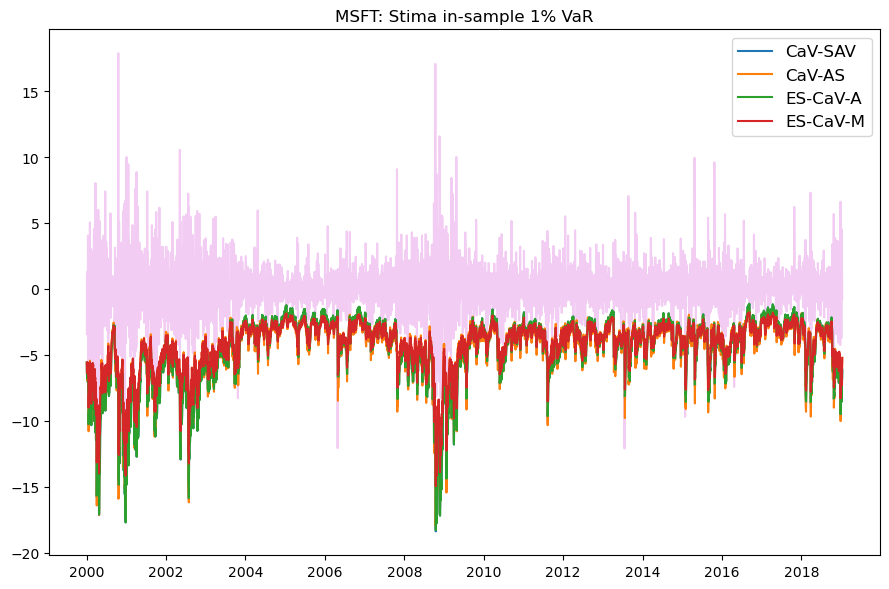

In [164]:
# Figura 29 MSFT VaR CAV, ES-CAV
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])

v1_escav_a_is = es_caviar_a_update_v(escava1_par4, r, 0.01, q01, e01)
v1_escav_m_is = es_caviar_m_update_v(escavm1_par3, r, 0.01, q01, e01)

v25_escav_a_is = es_caviar_a_update_v(escava25_par4, r, 0.025, q025, e025)
v25_escav_m_is = es_caviar_m_update_v(escavm25_par1, r, 0.025, q025, e025)


plt.figure(figsize=(9, 6))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(cav1_is, label='CaV-SAV')
plt.plot(cav1_as_is, label='CaV-AS')
plt.plot(v1_escav_a_is, label='ES-CaV-A')
plt.plot(v1_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Stima in-sample 1% VaR')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

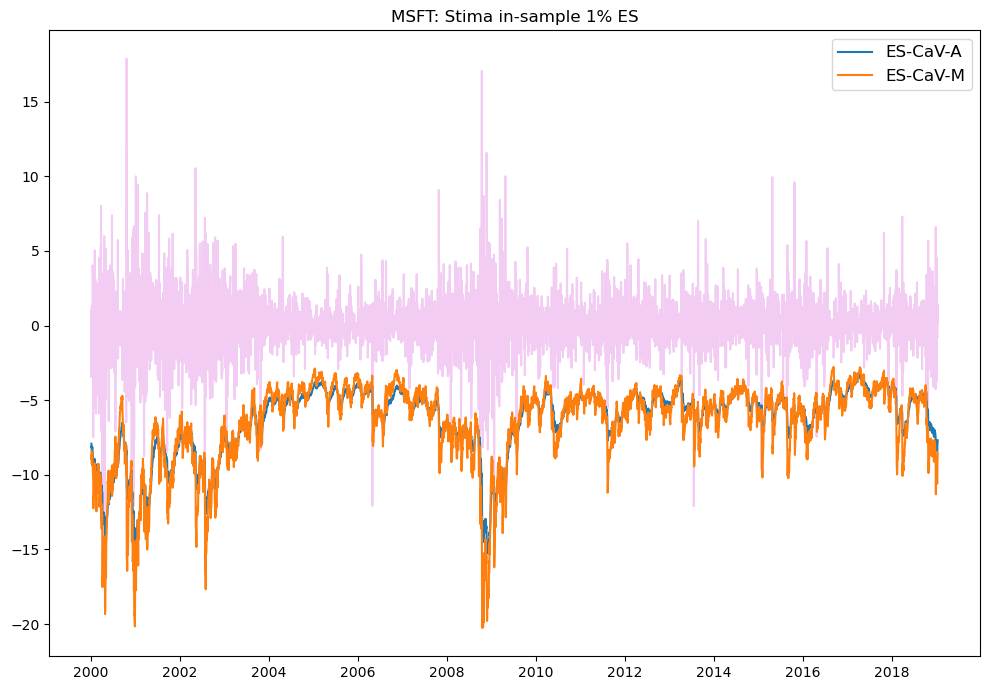

In [165]:
# Figura 30 MSFT  ES  ES-CAV-A/M

es1_escav_a_is = es_caviar_a_update_e(escava1_par3, r, 0.01, q01, e01)
es1_escav_m_is = es_caviar_m_update_e(escavm1_par4, r, 0.01, q01, e01)

es25_escav_a_is = es_caviar_a_update_e(escava25_par1, r, 0.025, q025, e025)
es25_escav_m_is = es_caviar_m_update_e(escavm25_par4, r, 0.025, q025, e025)


plt.figure(figsize=(10, 7))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(es1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Stima in-sample 1% ES')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

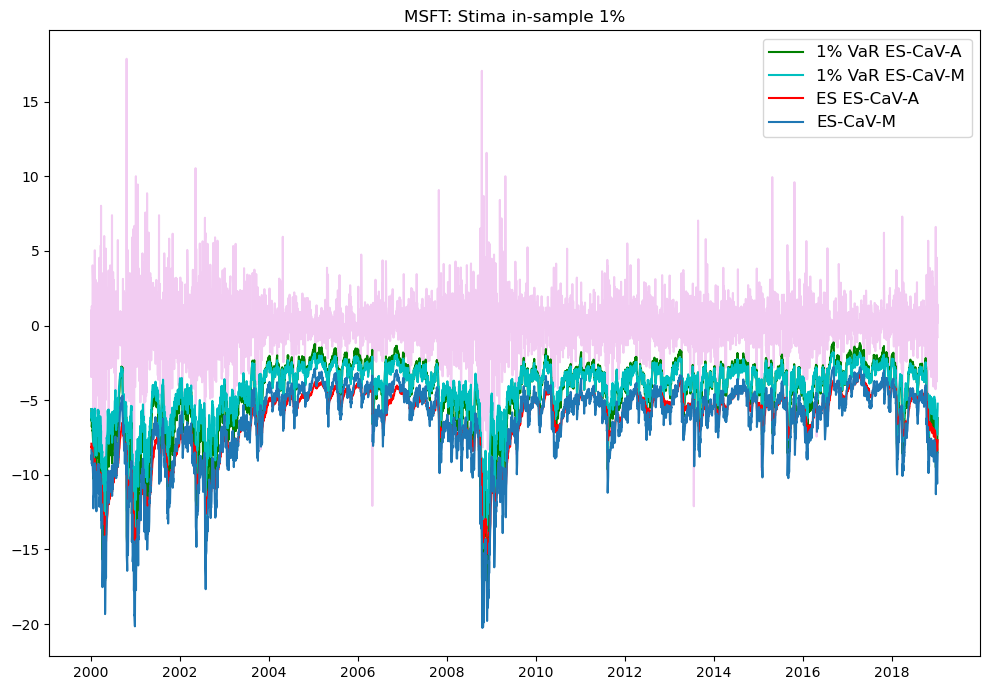

In [166]:
# Figura 31 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(v1_escav_a_is, 'g', label='1% VaR ES-CaV-A')
plt.plot(v1_escav_m_is, 'c', label='1% VaR ES-CaV-M')
plt.plot(es1_escav_a_is, 'r', label='ES ES-CaV-A')
plt.plot(es1_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Stima in-sample 1%')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

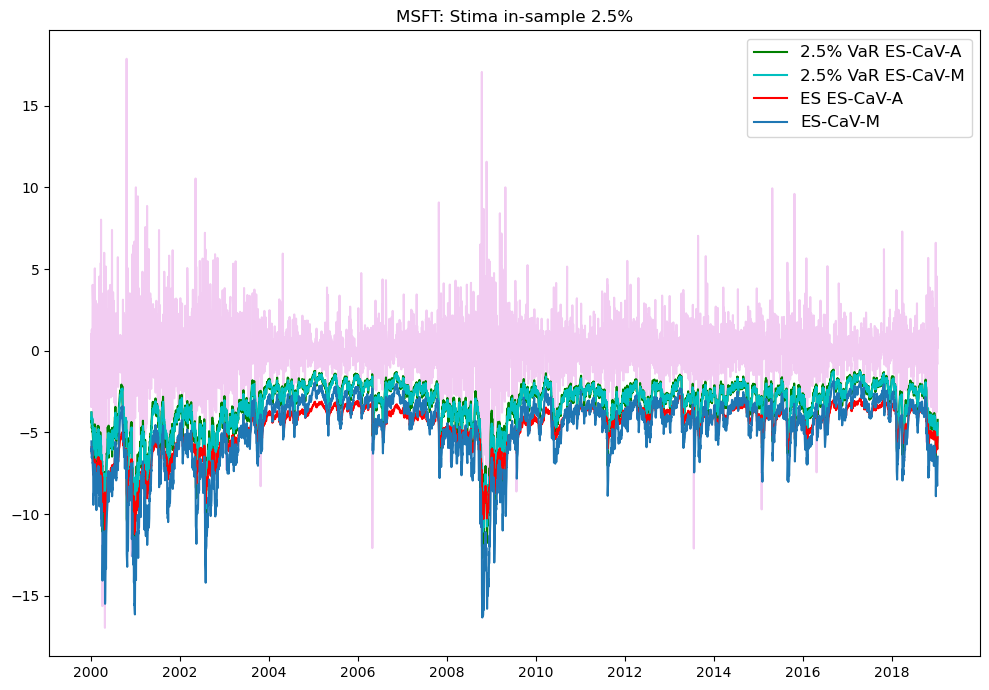

In [167]:
# Figura 32 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(v25_escav_a_is, 'g', label='2.5% VaR ES-CaV-A')
plt.plot(v25_escav_m_is, 'c', label='2.5% VaR ES-CaV-M')
plt.plot(es25_escav_a_is, 'r', label='ES ES-CaV-A')
plt.plot(es25_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Stima in-sample 2.5%')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

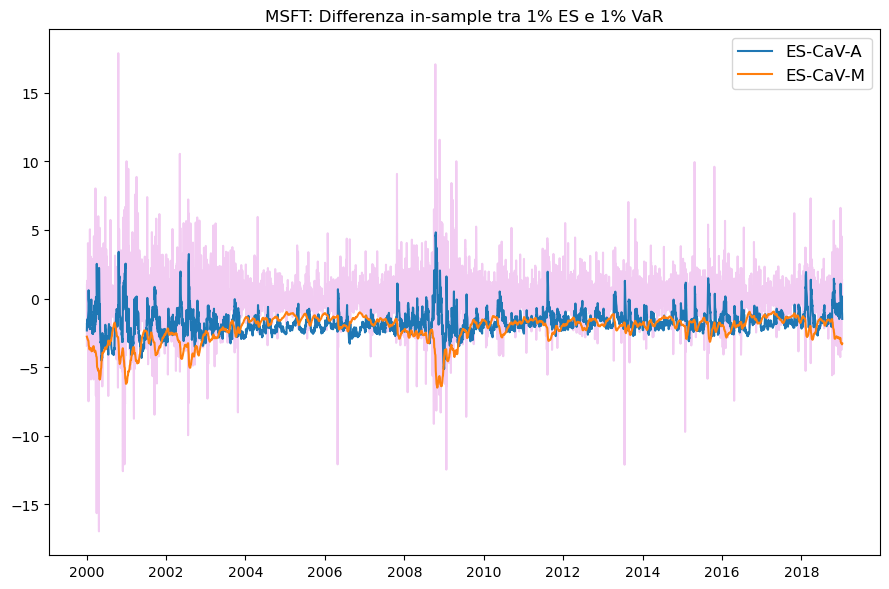

In [168]:
# Figura 33 MSFT
plt.figure(figsize=(9, 6))
plt.plot(r_msft[:last_in], '-m', alpha=0.2)
plt.plot(es1_escav_a_is-v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is-v1_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Differenza in-sample tra 1% ES e 1% VaR')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

I valori positivi indicano che l'ES è più grande del VaR, mentre i valori negativi indicano che l'ES è più piccolo del VaR.

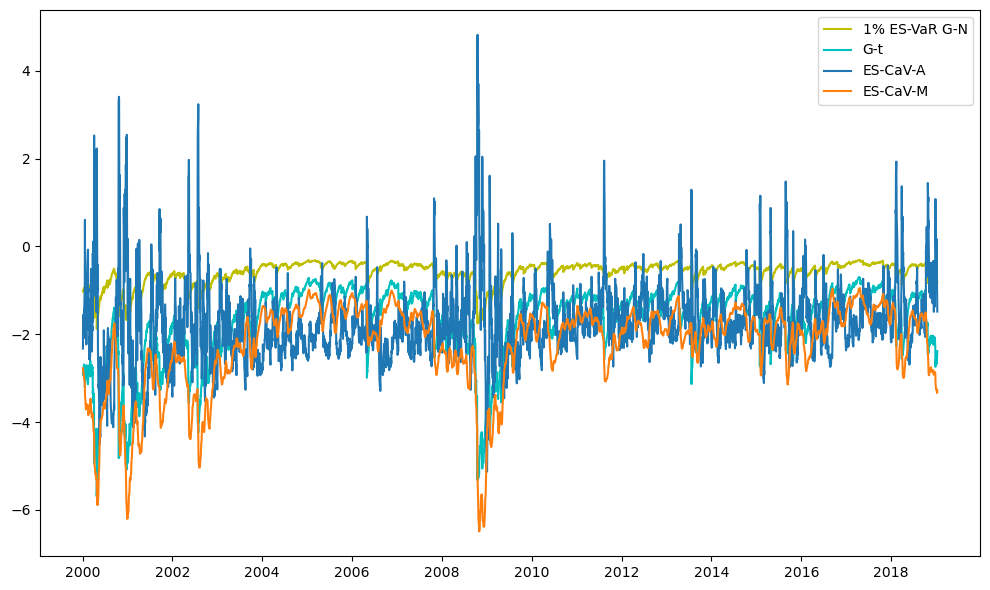

In [169]:
# Figura 34 MSFT
plt.figure(figsize=(10, 6))
plt.plot(es1_g_is-var1_g_is, 'y', label='1% ES-VaR G-N')
plt.plot(es1_gt_is-var1_gt_is, 'c', label='G-t')
plt.plot(es1_escav_a_is-v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is-v1_escav_m_is, label='ES-CaV-M')
plt.legend()
plt.tight_layout()
plt.show()

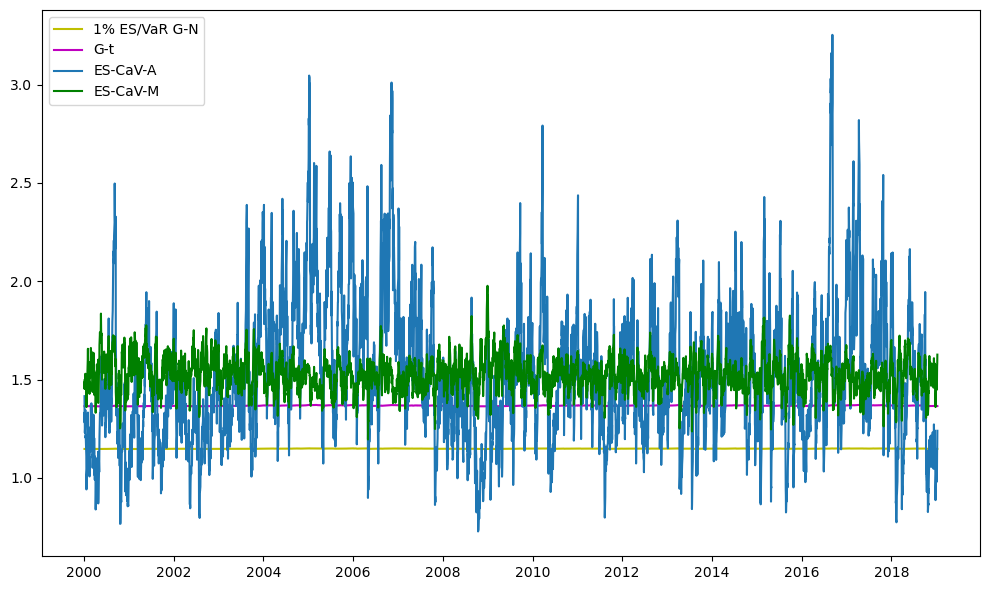

In [170]:
# Figura 35 MSFT
plt.figure(figsize=(10, 6))
plt.plot(es1_g_is/var1_g_is, 'y', label='1% ES/VaR G-N')
plt.plot(es1_gt_is/var1_gt_is, 'm', label='G-t')
plt.plot(es1_escav_a_is/v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is/v1_escav_m_is, 'g', label='ES-CaV-M')
plt.legend()
plt.tight_layout()
plt.show()

In [171]:
print(qloss(v25_escav_a_is,r,0.025),qloss(v25_escav_m_is,r,0.025))
print(qloss(v1_escav_a_is,r,0.01), qloss(v1_escav_m_is,r,0.01))

579.0435385550797 579.0686746478902
305.81821641108576 307.42749369755575


In [172]:
print(jointloss(es1_escav_a_is,v1_escav_a_is,r,0.01),jointloss(es1_escav_m_is,v1_escav_m_is,r,0.01))

2.8018040154276997 2.8041675913777473


In [173]:
print(jointloss(es25_escav_a_is,v25_escav_a_is,r,0.025),jointloss(es25_escav_m_is,v25_escav_m_is,r,0.025))

2.5340398300770475 2.5287596000565364


In [174]:
'''# VaR and ES forecasting
# One-day-ahead VaR and ES forecasts, updating parameters every 25 days
n_fore = len(r_msft[frst_fc:])

# VaR
var25_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var25_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
var1_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

# ES
es25_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es1_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es25_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')
es1_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')

n_wind = len(r_msft[:last_in])
for i in tqdm(range(n_fore)):
    if i % 100 == 0:
        r = r_msft[i:(i + n_wind)]
        q025 = np.quantile(r, 0.025)
        e025 = np.mean(r[r<q025])
        q01 = np.quantile(r, 0.01)
        e01 = np.mean(r[r<q01])
        
        escavab0_1 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
        escavab0_25 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
        escav25_a_par = fmin(es_caviar_a_loss, x0=escavab0_25, args=(r, 0.025, q025, e025), disp=False)
        escav1_a_par = fmin(es_caviar_a_loss, x0=escavab0_1, args=(r, 0.01, q01, e01), disp=False)
        
        
        escavmb0_1 = [-0.2, 0.6, -0.3, -1.5]
        escavmb0_25 = [-0.1, 0.4, -0.1, -1]
        escav25_m_par = fmin(es_caviar_m_loss, x0=escavmb0_1, args=(r, 0.025, q025, e025), disp=False)
        escav1_m_par = fmin(es_caviar_m_loss, x0=escavmb0_25, args=(r, 0.01, q01, e01), disp=False)
        
               
        v0 = np.var(r_msft[i:(i + n_wind)])
        
            
    # ES-CaViaR - Add
    var25 = es_caviar_a_update_v(escav25_a_par, r_msft, 0.025, q025, e025)
    var1 = es_caviar_a_update_v(escav1_a_par, r_msft, 0.01, q01, e01)
    var25_escav_a[i] = var25.loc[var25_escav_a.index[i]]
    var1_escav_a[i] = var1.loc[var1_escav_a.index[i]]
    es25 = es_caviar_a_update_e(escav25_a_par, r_msft, 0.025, q025, e025)
    es1 = es_caviar_a_update_e(escav1_a_par, r_msft, 0.01, q01, e01)
    es25_escav_a[i] = es25.loc[var25_escav_a.index[i]]
    es1_escav_a[i] = es1.loc[var1_escav_a.index[i]]
    
    
    # ES-CaViaR - Mult
    var25 = es_caviar_m_update_v(escav25_m_par, r_msft, 0.025, q025, e025)
    var1 = es_caviar_m_update_v(escav1_m_par, r_msft, 0.01, q01, e01)
    var25_escav_m[i] = var25.loc[var25_escav_m.index[i]]
    var1_escav_m[i] = var1.loc[var1_escav_m.index[i]]
    es25 = es_caviar_m_update_e(escav25_m_par, r_msft, 0.025, q025, e025)
    es1 = es_caviar_m_update_e(escav1_m_par, r_msft, 0.01, q01, e01)
    es25_escav_m[i] = es25.loc[var25_escav_m.index[i]]
    es1_escav_m[i] = es1.loc[var1_escav_m.index[i]]
 
 #   print(es25_escav_a[i], es25_escav_a2[i], es25_escav_m[i], es25_escav_m2[i])'''

"# VaR and ES forecasting\n# One-day-ahead VaR and ES forecasts, updating parameters every 25 days\nn_fore = len(r_msft[frst_fc:])\n\n# VaR\nvar25_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar1_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar25_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nvar1_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\n\n# ES\nes25_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nes1_escav_a = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nes25_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\nes1_escav_m = pd.Series(index=r_msft[frst_fc:].index, dtype='float64')\n\nn_wind = len(r_msft[:last_in])\nfor i in tqdm(range(n_fore)):\n    if i % 100 == 0:\n        r = r_msft[i:(i + n_wind)]\n        q025 = np.quantile(r, 0.025)\n        e025 = np.mean(r[r<q025])\n        q01 = np.quantile(r, 0.01)\n        e01 = np.mean(r[r<q01])\n  

In [175]:
'''# Saving the forecasts 
data_msft_escav25 = pd.DataFrame({'var25_escav_a': var25_escav_a, 'es25_escav_a': es25_escav_a,  'var25_escav_m': var25_escav_m, 'es25_escav_m': es25_escav_m,}) 
data_msft_escav25.to_csv("msft_escav_data25.csv")

data_msft_escav1 = pd.DataFrame({'var1_escav_a': var1_escav_a, 'es1_escav_a': es1_escav_a, 'var1_escav_m': var1_escav_m, 'es1_escav_m': es1_escav_m}) 
data_msft_escav1.to_csv("msft_escav_data1.csv")'''

'# Saving the forecasts \ndata_msft_escav25 = pd.DataFrame({\'var25_escav_a\': var25_escav_a, \'es25_escav_a\': es25_escav_a,  \'var25_escav_m\': var25_escav_m, \'es25_escav_m\': es25_escav_m,}) \ndata_msft_escav25.to_csv("msft_escav_data25.csv")\n\ndata_msft_escav1 = pd.DataFrame({\'var1_escav_a\': var1_escav_a, \'es1_escav_a\': es1_escav_a, \'var1_escav_m\': var1_escav_m, \'es1_escav_m\': es1_escav_m}) \ndata_msft_escav1.to_csv("msft_escav_data1.csv")'

In [176]:
# Import the previously saved ES-CaV forecasts
data_msft_escav25 = pd.read_csv("msft_escav_data25.csv", index_col = 'Date')
var25_escav_a = pd.Series(data=data_msft_escav25.loc[:,'var25_escav_a'].values, index=r_msft[frst_fc:].index, dtype='float64')
var25_escav_m = pd.Series(data=data_msft_escav25.loc[:,'var25_escav_m'].values, index=r_msft[frst_fc:].index, dtype='float64')
es25_escav_a = pd.Series(data=data_msft_escav25.loc[:,'es25_escav_a'].values, index=r_msft[frst_fc:].index, dtype='float64')
es25_escav_m = pd.Series(data=data_msft_escav25.loc[:,'es25_escav_m'].values, index=r_msft[frst_fc:].index, dtype='float64')

data_msft_escav1 = pd.read_csv("msft_escav_data1.csv", index_col = 'Date')
var1_escav_a = pd.Series(data=data_msft_escav1.loc[:,'var1_escav_a'].values, index=r_msft[frst_fc:].index, dtype='float64')
var1_escav_m = pd.Series(data=data_msft_escav1.loc[:,'var1_escav_m'].values, index=r_msft[frst_fc:].index, dtype='float64')
es1_escav_a = pd.Series(data=data_msft_escav1.loc[:,'es1_escav_a'].values, index=r_msft[frst_fc:].index, dtype='float64')
es1_escav_m = pd.Series(data=data_msft_escav1.loc[:,'es1_escav_m'].values, index=r_msft[frst_fc:].index, dtype='float64')

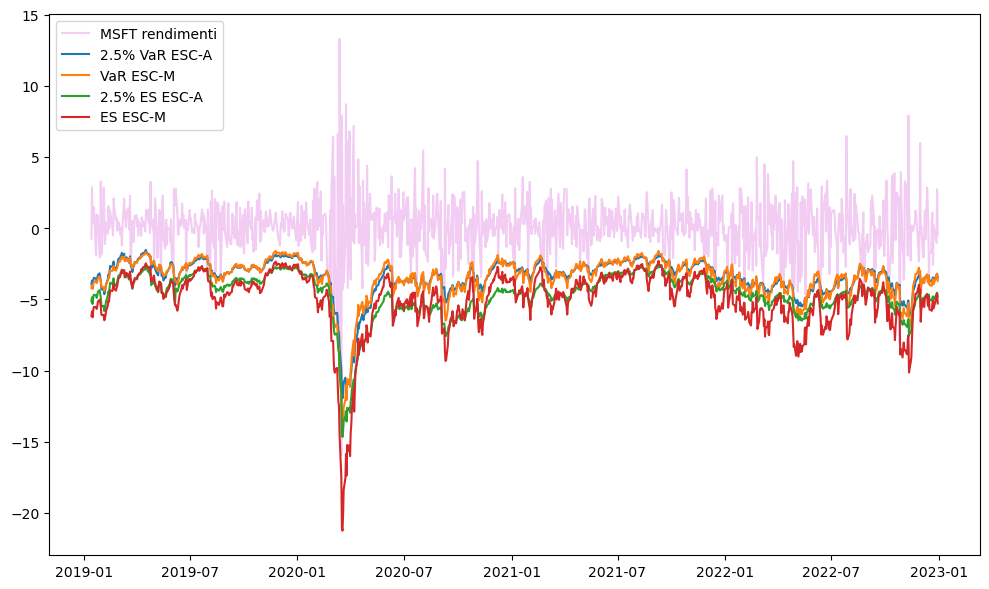

In [177]:
# Figura 36 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var25_escav_a, label='2.5% VaR ESC-A')
plt.plot(var25_escav_m, label='VaR ESC-M')
plt.plot(es25_escav_a, label='2.5% ES ESC-A')
plt.plot(es25_escav_m, label='ES ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

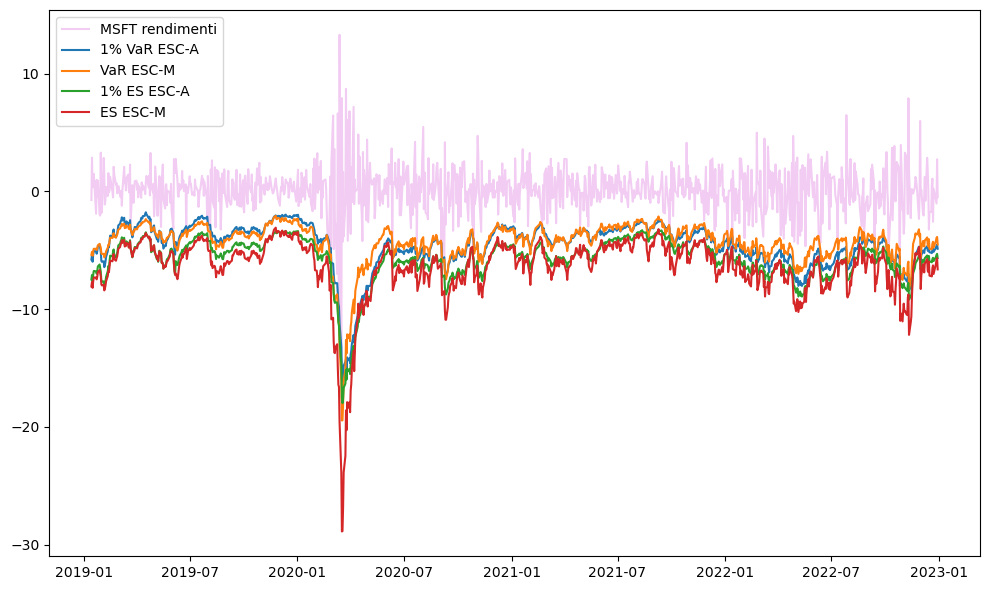

In [178]:
# Figura 37 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(var1_escav_a, label='1% VaR ESC-A')
plt.plot(var1_escav_m, label='VaR ESC-M')
plt.plot(es1_escav_a, label='1% ES ESC-A')
plt.plot(es1_escav_m, label='ES ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

In [179]:
# 2.5% VaR forecast accuracy checks
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch, r_msft[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t, r_msft[frst_fc:], 0.025),
    'C-SAV': check_var_fc(var25_caviar, r_msft[frst_fc:], 0.025),
    'C-AS': check_var_fc(var25_cavas, r_msft[frst_fc:], 0.025),
    'C-IG': check_var_fc(var25_cavig, r_msft[frst_fc:], 0.025),
    'ESC-A': check_var_fc(var25_escav_a, r_msft[frst_fc:], 0.025),
    'ESC-M': check_var_fc(var25_escav_m, r_msft[frst_fc:], 0.025),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t,C-SAV,C-AS,C-IG,ESC-A,ESC-M
Viol.(25),43.000,36.000,37.000,36.000,41.000,38.000,37.000
$\hat{p}$,0.043,0.036,0.037,0.036,0.041,0.038,0.037
$\hat{p}/p$,1.720,1.440,1.480,1.440,1.640,1.520,1.480
UC,0.000,0.026,0.015,0.026,0.001,0.008,0.015
Ind,0.910,0.778,0.731,0.778,0.555,0.649,0.731
DQ,0.003,0.023,0.005,0.040,0.007,0.008,0.006
Loss,135.394,132.593,130.157,131.121,131.431,132.685,129.756


In [180]:
# 2.5% ES forecast accuracy checks
tbl_es25 = pd.DataFrame({
    'G-t': check_es_fc(es25_garch_t, var25_garch_t, s_garch_t, r_msft[frst_fc:], 0.025),
    'ESC-A': check_es_fc(es25_escav_a, var25_escav_a, var25_escav_a, r_msft[frst_fc:], 0.025),
    'ESC-M': check_es_fc(es25_escav_m, var25_escav_m, var25_escav_m, r_msft[frst_fc:], 0.025),
    },
    index=['VaR Viol. (25)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es25.round(3)

,G-t,ESC-A,ESC-M
VaR Viol. (25),36.000,38.000,37.000
Q loss,132.593,132.685,129.756
Joint loss,2.621,2.624,2.608
Mean xi,0.293,0.097,0.490
Mean xsi/s,0.172,-0.081,-0.132
t-stat,2.055,-1.493,-3.214
p-val,0.047,0.144,0.003
RMSE,0.951,1.262,1.105
MAD,0.787,0.924,0.900


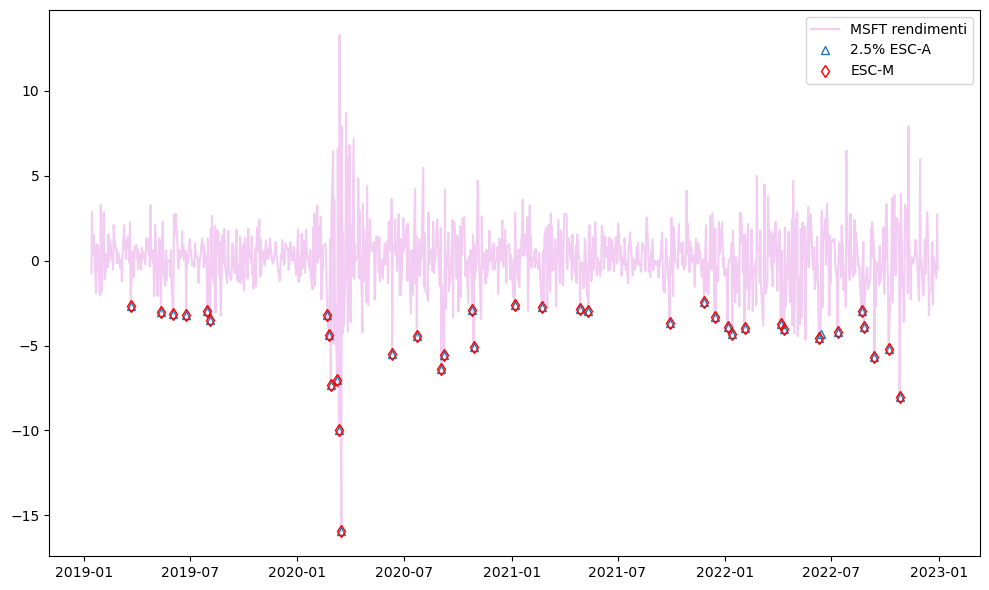

In [181]:
# Figura 38 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')

plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_escav_a], '^', mfc='none', label='2.5% ESC-A')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var25_escav_m], 'dr', mfc='none', label='ESC-M')


plt.legend()
plt.tight_layout()
plt.show()

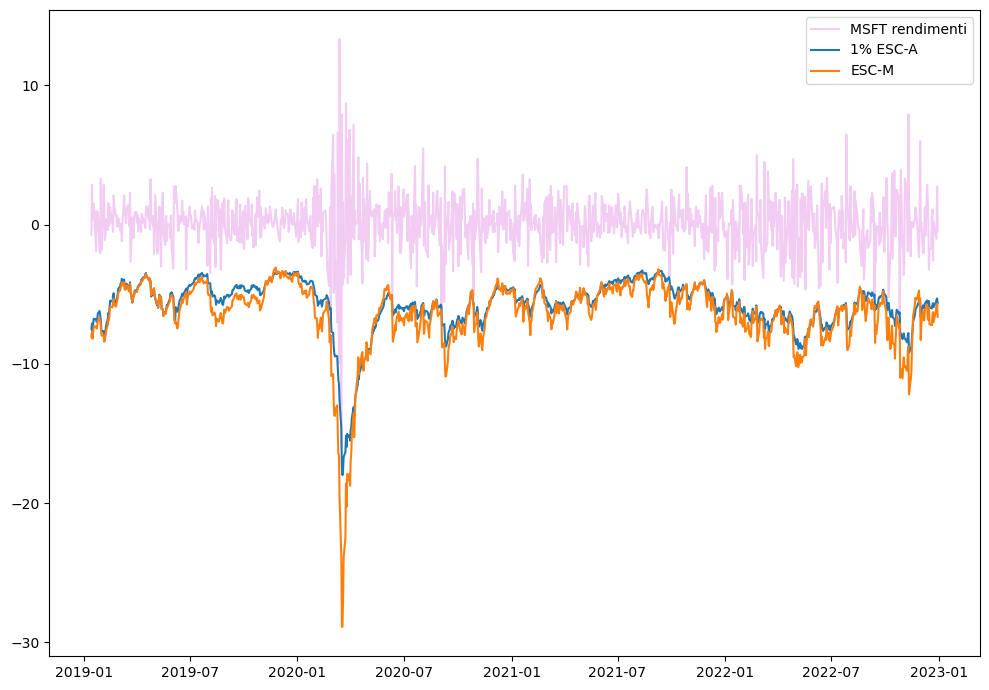

In [182]:
# Figura 39 MSFT
plt.figure(figsize=(10, 7))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(es1_escav_a, label='1% ESC-A')
plt.plot(es1_escav_m, label='ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

In [183]:
# 1% VaR forecast accuracy checks
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch, r_msft[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t, r_msft[frst_fc:], 0.01),
    'C-SAV': check_var_fc(var1_caviar, r_msft[frst_fc:], 0.01),
    'C-AS': check_var_fc(var1_cavas, r_msft[frst_fc:], 0.01),
    'C-IG': check_var_fc(var1_cavig, r_msft[frst_fc:], 0.01),
    'ESC-A': check_var_fc(var1_escav_a, r_msft[frst_fc:], 0.01),
    'ESC-M': check_var_fc(var1_escav_m, r_msft[frst_fc:], 0.01),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t,C-SAV,C-AS,C-IG,ESC-A,ESC-M
Viol.(25),25.000,12.000,16.000,17.000,17.000,15.000,15.000
$\hat{p}$,0.025,0.012,0.016,0.017,0.017,0.015,0.015
$\hat{p}/p$,2.500,1.200,1.600,1.700,1.700,1.500,1.500
UC,0.000,0.525,0.057,0.026,0.026,0.112,0.112
Ind,0.257,0.589,0.470,0.443,0.443,0.499,0.499
DQ,0.000,0.283,0.314,0.057,0.174,0.000,0.193
Loss,67.375,60.193,60.018,60.591,61.383,63.099,59.192


In [184]:
# 1% ES forecast accuracy checks
tbl_es1 = pd.DataFrame({
    'G-t': check_es_fc(es1_garch_t, var1_garch_t, s_garch_t, r_msft[frst_fc:], 0.01),
    'ESC-A': check_es_fc(es1_escav_a, var1_escav_a, var1_escav_a, r_msft[frst_fc:], 0.01),
    'ESC-M': check_es_fc(es1_escav_m, var1_escav_m, var1_escav_m, r_msft[frst_fc:], 0.01),
},
    index=['VaR Viol. (10)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es1.round(3)

,G-t,ESC-A,ESC-M
VaR Viol. (10),12.000,15.000,15.000
Q loss,60.193,63.099,59.192
Joint loss,2.741,2.785,2.743
Mean xi,0.860,0.119,0.876
Mean xsi/s,0.381,-0.065,-0.239
t-stat,3.038,-1.147,-5.027
p-val,0.011,0.271,0.000
RMSE,1.661,0.974,1.109
MAD,1.077,0.848,0.993


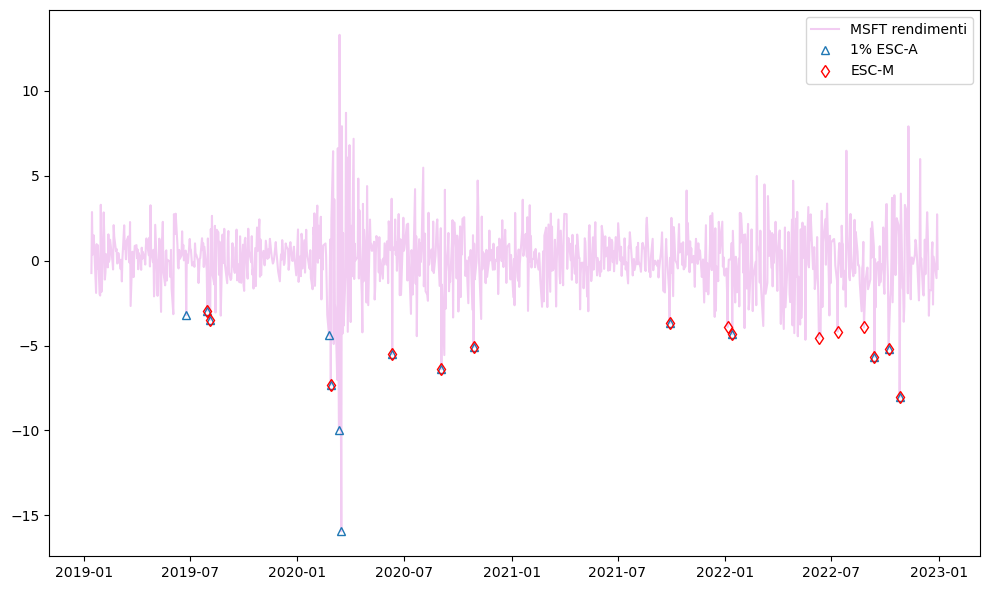

In [185]:
# Figura 40 MSFT
plt.figure(figsize=(10, 6))
plt.plot(r_msft[frst_fc:], 'm-', alpha=0.2, label='MSFT rendimenti')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_escav_a], '^', mfc='none', label='1% ESC-A')
plt.plot(r_msft[frst_fc:][r_msft[frst_fc:] < var1_escav_m], 'dr', mfc='none', label='ESC-M')

plt.legend()
plt.tight_layout()
plt.show()

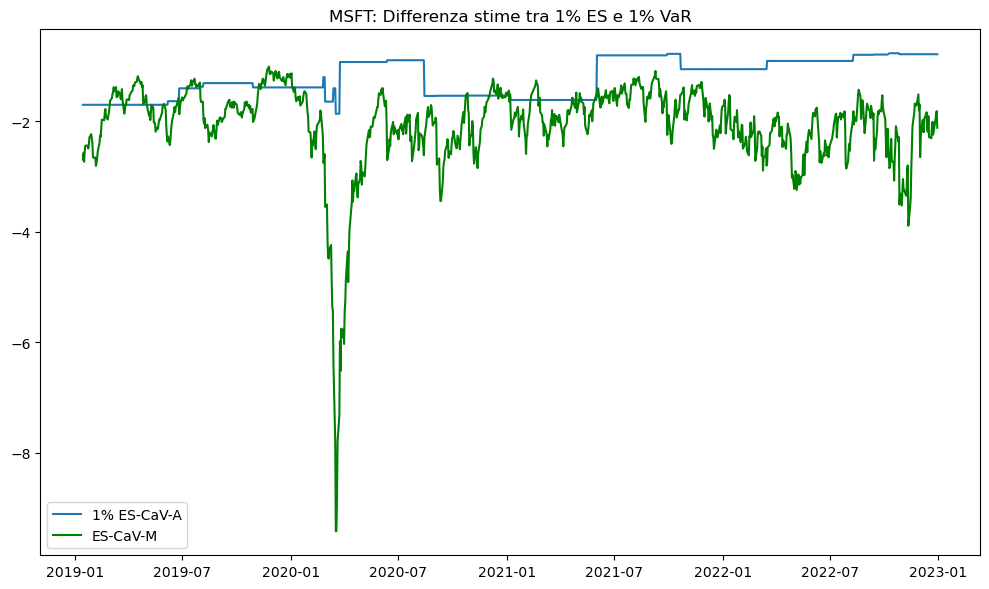

In [186]:
# Figura 41 MSFT
plt.figure(figsize=(10, 6))
plt.plot(es1_escav_a-var1_escav_a, label='1% ES-CaV-A')
plt.plot(es1_escav_m-var1_escav_m, 'g', label='ES-CaV-M')
plt.title('MSFT: Differenza stime tra 1% ES e 1% VaR')
plt.legend()
plt.tight_layout()
plt.show()

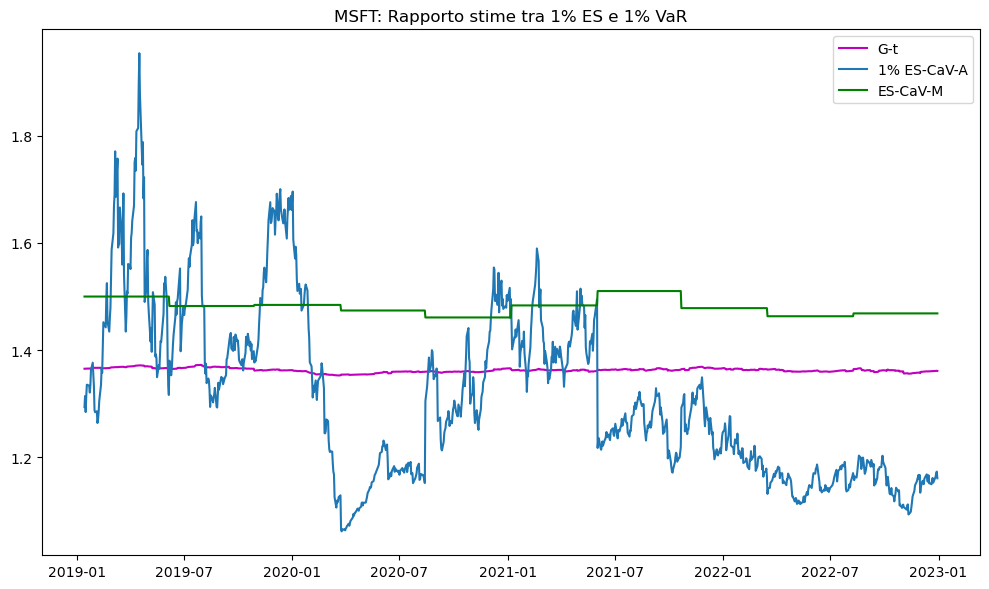

In [187]:
# Figura 42 MSFT
plt.figure(figsize=(10, 6))
plt.plot(es1_garch_t/var1_garch_t, 'm', label='G-t')
plt.plot(es1_escav_a/var1_escav_a, label='1% ES-CaV-A')
plt.plot(es1_escav_m/var1_escav_m, 'g', label='ES-CaV-M')
plt.title('MSFT: Rapporto stime tra 1% ES e 1% VaR')
plt.legend()
plt.tight_layout()
plt.show()

### ES-CAViaR-Apple

In [188]:
# Stima in-sample del modello ES-CAViaR-mult con differenti parametri iniziali

r = r_apple[:last_in]
b01 = [-0.1, 0.4, -0.1, -1]
b02 = [-0.15, 0.8, -0.2, -0.5]
b03 = [-0.2, 0.6, -0.3, -1.5]
b04 = [-0.1, 0.7, -0.5, -1]
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
escavm25_par1 = fmin(es_caviar_m_loss, x0=b01, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par2 = fmin(es_caviar_m_loss, x0=b02, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par3 = fmin(es_caviar_m_loss, x0=b03, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm25_par4 = fmin(es_caviar_m_loss, x0=b04, args=(r, 0.025, q025, e025), maxiter=1000, disp=True)
escavm1_par1 = fmin(es_caviar_m_loss, x0=b01, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par2 = fmin(es_caviar_m_loss, x0=b02, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par3 = fmin(es_caviar_m_loss, x0=b03, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)
escavm1_par4 = fmin(es_caviar_m_loss, x0=b04, args=(r, 0.01, q01, e01), maxiter=1000, disp=True)

print(escavm25_par1.round(4))
print(escavm25_par2.round(4))
print(escavm25_par3.round(4))
print(escavm25_par4.round(4))
print('=' * 37)
print(escavm1_par1.round(4))
print(escavm1_par2.round(4))
print(escavm1_par3.round(4))
print(escavm1_par4.round(4))
len(r)

Optimization terminated successfully.
         Current function value: 2.816178
         Iterations: 217
         Function evaluations: 370
Optimization terminated successfully.
         Current function value: 2.816178
         Iterations: 244
         Function evaluations: 400
Optimization terminated successfully.
         Current function value: 2.816178
         Iterations: 271
         Function evaluations: 470
Optimization terminated successfully.
         Current function value: 2.816178
         Iterations: 220
         Function evaluations: 364
Optimization terminated successfully.
         Current function value: 3.073243
         Iterations: 414
         Function evaluations: 702
Optimization terminated successfully.
         Current function value: 3.073243
         Iterations: 189
         Function evaluations: 319
Optimization terminated successfully.
         Current function value: 3.073248
         Iterations: 402
         Function evaluations: 673
Optimization termina

4786

ES-CaViaR-M:

$$
2.5\% \,\,: \,\, Q_{t} = -0.048 + 0.9201 Q_{t-1} - 0.1743 |r_{t-1}| \,\,;\,\, ES_t = Q_t (1 + \exp(-0.7108)) \\
1\% \,\,: \,\, Q_{t} = -0.153 + 0.8498  Q_{t-1} - 0.4283 |r_{t-1}| \,\,;\,\, ES_t = Q_t (1 + \exp(-0.8044))
$$


In [189]:
# Stima in-sample del modello ES-CAViaR-add

r = r_apple[:last_in]
b01 = [-0.1, 0.85, -0.1, 0.1, 0.1, 0.9]
b02 = [-0.15, 0.8, -0.2, 0.1, 0.2, 0.6]
b03 = [-0.2, 0.6, -0.05, 0.01, 0.05, 0.75]
b04 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
escava25_par1 = fmin(es_caviar_a_loss, x0=b01, args=(r, 0.025, q025, e025), disp=True)
escava25_par2 = fmin(es_caviar_a_loss, x0=b02, args=(r, 0.025, q025, e025), disp=True)
escava25_par3 = fmin(es_caviar_a_loss, x0=b03, args=(r, 0.025, q025, e025), disp=True)
escava25_par4 = fmin(es_caviar_a_loss, x0=b04, args=(r, 0.025, q025, e025), disp=True)
escava1_par1 = fmin(es_caviar_a_loss, x0=b01, args=(r, 0.01, q01, e01), disp=True)
escava1_par2 = fmin(es_caviar_a_loss, x0=b02, args=(r, 0.01, q01, e01), disp=True)
escava1_par3 = fmin(es_caviar_a_loss, x0=b03, args=(r, 0.01, q01, e01), disp=True)
escava1_par4 = fmin(es_caviar_a_loss, x0=b04, args=(r, 0.01, q01, e01), disp=True)
print(escava25_par1.round(4))
print(escava25_par2.round(4))
print(escava25_par3.round(4))
print(escava25_par4.round(4))
print('=' * 37)
print(escava1_par1.round(4))
print(escava1_par2.round(4))
print(escava1_par3.round(4))
print(escava1_par4.round(4))

Optimization terminated successfully.
         Current function value: 2.845049
         Iterations: 183
         Function evaluations: 323
Optimization terminated successfully.
         Current function value: 2.837029
         Iterations: 402
         Function evaluations: 698
Optimization terminated successfully.
         Current function value: 2.862589
         Iterations: 295
         Function evaluations: 500
Optimization terminated successfully.
         Current function value: 2.829216
         Iterations: 549
         Function evaluations: 931
Optimization terminated successfully.
         Current function value: 3.096067
         Iterations: 337
         Function evaluations: 575
Optimization terminated successfully.
         Current function value: 3.098203
         Iterations: 508
         Function evaluations: 851
Optimization terminated successfully.
         Current function value: 3.217624
         Iterations: 236
         Function evaluations: 413
Optimization termina

ES-CaViaR-A models:

2.5\% 
\begin{align*}
Q_{t} &= -0.1269 + 0.8911 Q_{t-1} - 0.2186 |r_{t-1}| \\
   w_{t} &= 0.0448 + 0 w_{t-1} + 0.9608 (r_{t-1}-Q_{t-1}), \,\, r_{t-1}<Q_{t-1} \\ 
   w_{t} &= w_{t-1}, \,\, r_{t-1} \ge Q_{t-1} \\
   ES_t &= Q_t-w_t
\end{align*}

1\%  
\begin{align*}
Q_{t} &= -0.1392 + 0.8508 Q_{t-1} - 0.4338 |r_{t-1}| \\
   w_{t} &= 0.0005 + 0 w_{t-1} + 0.9748 (r_{t-1}-Q_{t-1}), \,\, r_{t-1}<Q_{t-1} \\ 
   w_{t} &= w_{t-1}, \,\, r_{t-1} \ge Q_{t-1} \\
   ES_t &= Q_t-w_t
\end{align*}


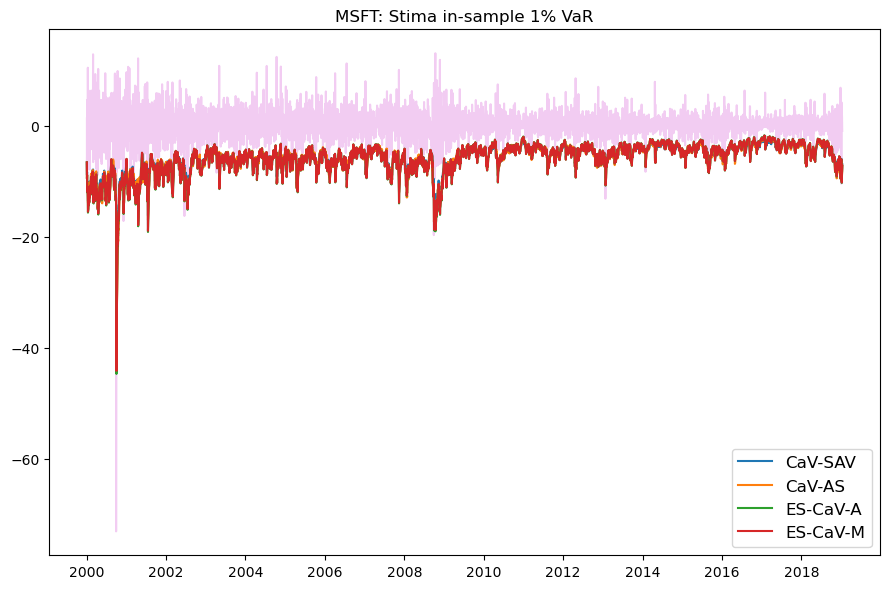

In [190]:
# Figura 29 AAPl VaR CAV, ES-CAV
q01 = np.quantile(r, 0.01)
e01 = np.mean(r[r<q01])
q025 = np.quantile(r, 0.025)
e025 = np.mean(r[r<q025])

v1_escav_a_is = es_caviar_a_update_v(escava1_par4, r, 0.01, q01, e01)
v1_escav_m_is = es_caviar_m_update_v(escavm1_par4, r, 0.01, q01, e01)

v25_escav_a_is = es_caviar_a_update_v(escava25_par4, r, 0.025, q025, e025)
v25_escav_m_is = es_caviar_m_update_v(escavm25_par1, r, 0.025, q025, e025)


plt.figure(figsize=(9, 6))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(cav1_is_a, label='CaV-SAV')
plt.plot(cav1_as_is_a, label='CaV-AS')
plt.plot(v1_escav_a_is, label='ES-CaV-A')
plt.plot(v1_escav_m_is, label='ES-CaV-M')
plt.title('MSFT: Stima in-sample 1% VaR')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

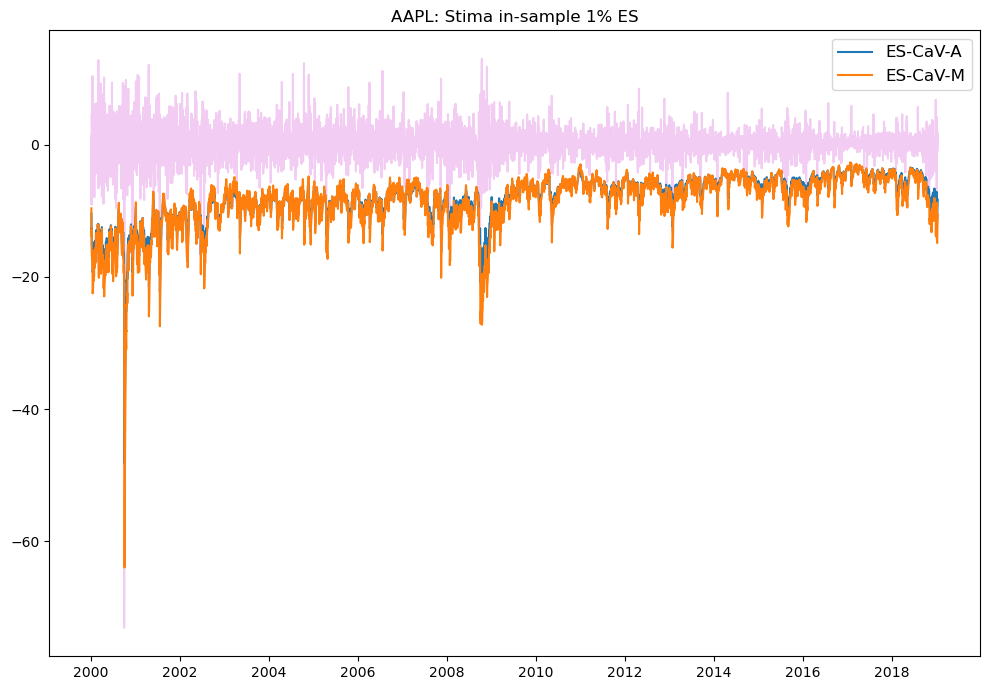

In [191]:
# Figura 30 AAPl  ES G-t, ES-CAV

es1_escav_a_is = es_caviar_a_update_e(escava1_par4, r, 0.01, q01, e01)
es1_escav_m_is = es_caviar_m_update_e(escavm1_par4, r, 0.01, q01, e01)

es25_escav_a_is = es_caviar_a_update_e(escava25_par4, r, 0.025, q025, e025)
es25_escav_m_is = es_caviar_m_update_e(escavm25_par1, r, 0.025, q025, e025)


plt.figure(figsize=(10, 7))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(es1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is, label='ES-CaV-M')
plt.title('AAPL: Stima in-sample 1% ES')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


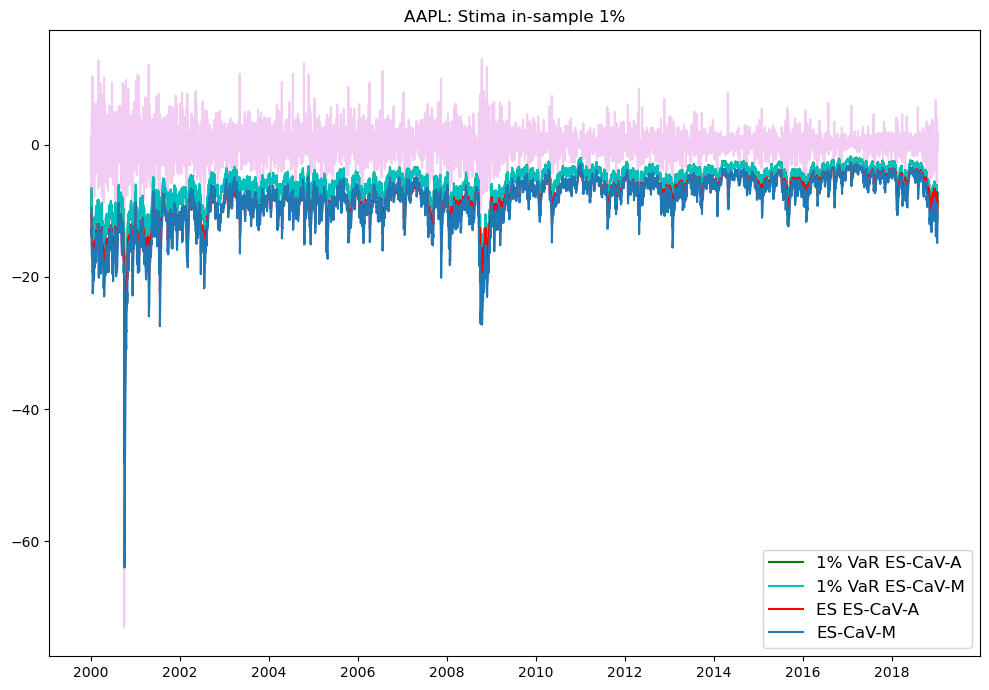

In [192]:
# Figura 31 AAPl
plt.figure(figsize=(10, 7))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(v1_escav_a_is, 'g', label='1% VaR ES-CaV-A')
plt.plot(v1_escav_m_is, 'c', label='1% VaR ES-CaV-M')
plt.plot(es1_escav_a_is, 'r', label='ES ES-CaV-A')
plt.plot(es1_escav_m_is, label='ES-CaV-M')
plt.title('AAPL: Stima in-sample 1%')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

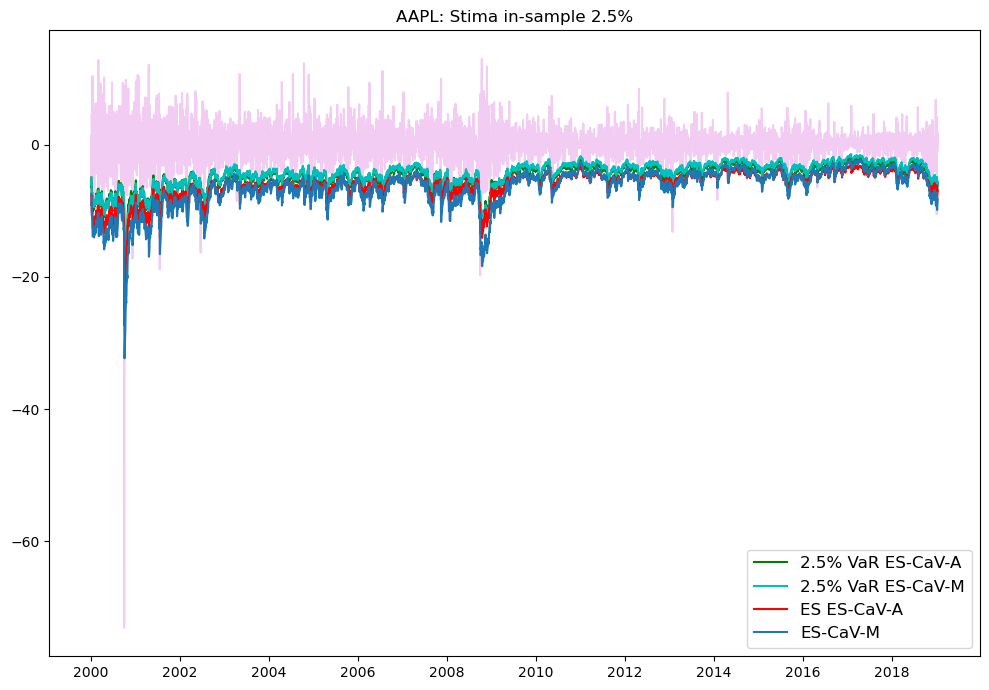

In [193]:
# Figura 32 AAPl
plt.figure(figsize=(10, 7))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(v25_escav_a_is, 'g', label='2.5% VaR ES-CaV-A')
plt.plot(v25_escav_m_is, 'c', label='2.5% VaR ES-CaV-M')
plt.plot(es25_escav_a_is, 'r', label='ES ES-CaV-A')
plt.plot(es25_escav_m_is, label='ES-CaV-M')
plt.title('AAPL: Stima in-sample 2.5%')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

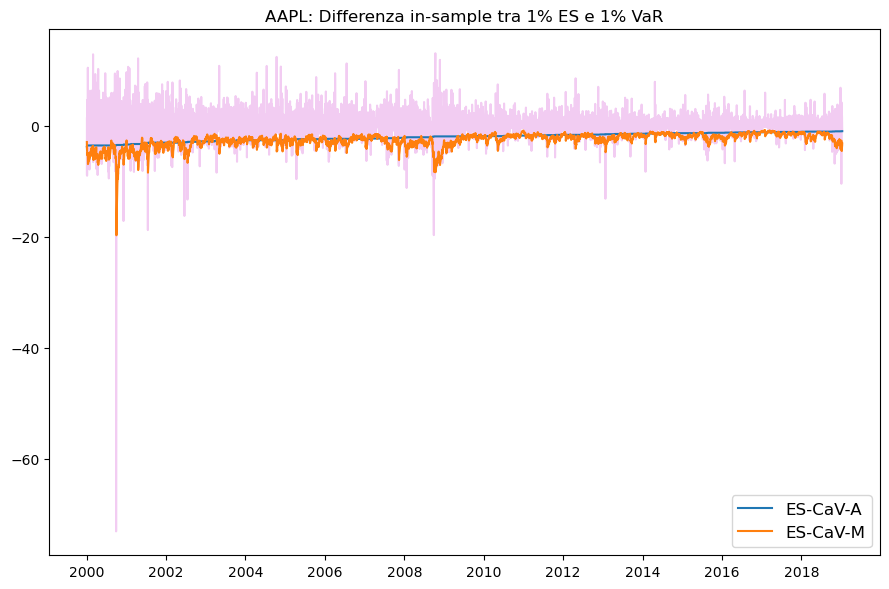

In [194]:
# Figura 33 AAPl
plt.figure(figsize=(9, 6))
plt.plot(r_apple[:last_in], '-m', alpha=0.2)
plt.plot(es1_escav_a_is-v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is-v1_escav_m_is, label='ES-CaV-M')
plt.title('AAPL: Differenza in-sample tra 1% ES e 1% VaR')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

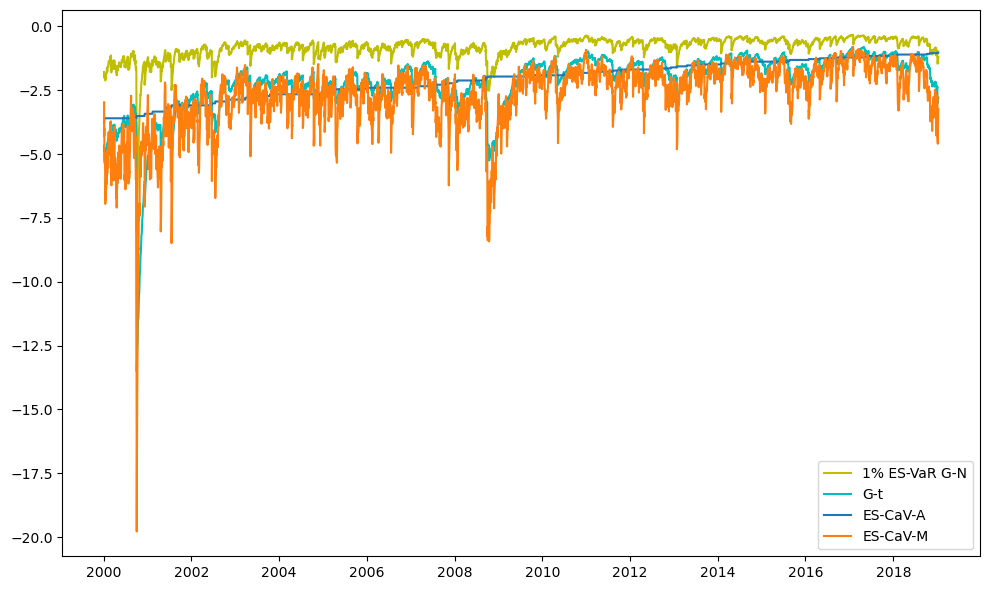

In [195]:
# Figura 34 AAPl
plt.figure(figsize=(10, 6))
plt.plot(es1_g_is_a-var1_g_is_a, 'y', label='1% ES-VaR G-N')
plt.plot(es1_gt_is_a-var1_gt_is_a, 'c', label='G-t')
plt.plot(es1_escav_a_is-v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is-v1_escav_m_is, label='ES-CaV-M')
plt.legend()
plt.tight_layout()
plt.show()

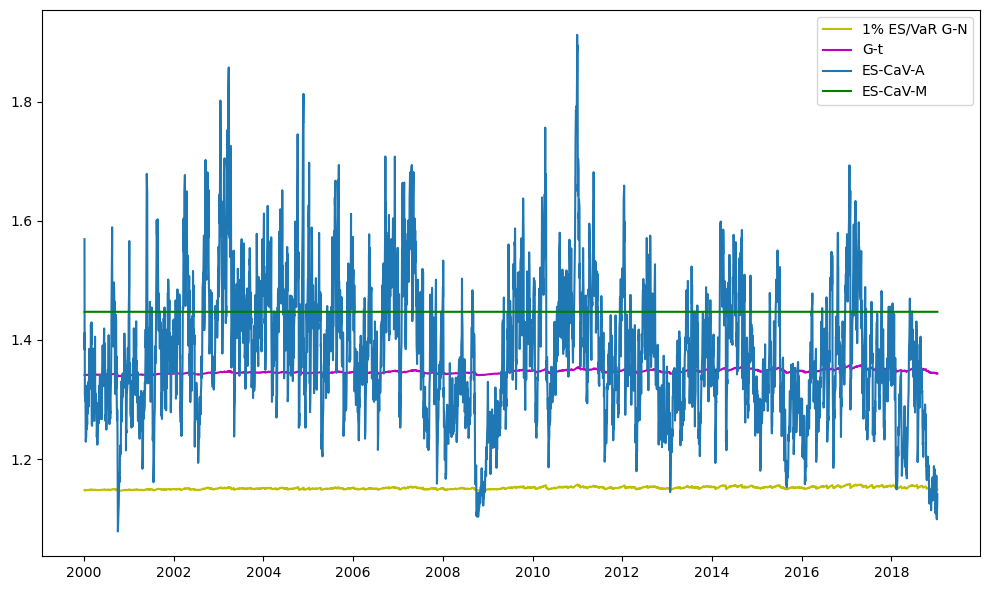

In [196]:
# Figura 35 AAPl
plt.figure(figsize=(10, 6))
plt.plot(es1_g_is_a/var1_g_is_a, 'y', label='1% ES/VaR G-N')
plt.plot(es1_gt_is_a/var1_gt_is_a, 'm', label='G-t')
plt.plot(es1_escav_a_is/v1_escav_a_is, label='ES-CaV-A')
plt.plot(es1_escav_m_is/v1_escav_m_is, 'g', label='ES-CaV-M')
plt.legend()
plt.tight_layout()
plt.show()

In [197]:
print(qloss(v25_escav_a_is,r,0.025),qloss(v25_escav_m_is,r,0.025))
print(qloss(v1_escav_a_is,r,0.01), qloss(v1_escav_m_is,r,0.01))

806.4909145539343 802.1987143338707
442.27082599718085 442.0194990276847


In [198]:
print(jointloss(es1_escav_a_is,v1_escav_a_is,r,0.01),jointloss(es1_escav_m_is,v1_escav_m_is,r,0.01))

3.0805097660959895 3.0732427393528567


In [199]:
print(jointloss(es25_escav_a_is,v25_escav_a_is,r,0.025),jointloss(es25_escav_m_is,v25_escav_m_is,r,0.025))

2.8292159684040157 2.816177660484189


In [200]:
'''# VaR and ES forecasting
# One-day-ahead VaR and ES forecasts, updating parameters every 25 days
n_fore = len(r_apple[frst_fc:])

# VaR
var25_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var25_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
var1_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

# ES
es25_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es1_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es25_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')
es1_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')

n_wind = len(r_apple[:last_in])
for i in tqdm(range(n_fore)):
    if i % 100 == 0:
        r = r_apple[i:(i + n_wind)]
        q025 = np.quantile(r, 0.025)
        e025 = np.mean(r[r<q025])
        q01 = np.quantile(r, 0.01)
        e01 = np.mean(r[r<q01])
        
        escavab0_1 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
        escavab0_25 = [-0.1, 0.75, -0.15, 0.05, 0.25, 0.85]
        escav25_a_par = fmin(es_caviar_a_loss, x0=escavab0_25, args=(r, 0.025, q025, e025), disp=False)
        escav1_a_par = fmin(es_caviar_a_loss, x0=escavab0_1, args=(r, 0.01, q01, e01), disp=False)
        
        
        escavmb0_1 = [-0.1, 0.7, -0.5, -1]
        escavmb0_25 = [-0.1, 0.4, -0.1, -1]
        escav25_m_par = fmin(es_caviar_m_loss, x0=escavmb0_1, args=(r, 0.025, q025, e025), disp=False)
        escav1_m_par = fmin(es_caviar_m_loss, x0=escavmb0_25, args=(r, 0.01, q01, e01), disp=False)
               
        v0 = np.var(r_apple[i:(i + n_wind)])
        
            
    # ES-CaViaR - Add
    var25 = es_caviar_a_update_v(escav25_a_par, r_apple, 0.025, q025, e025)
    var1 = es_caviar_a_update_v(escav1_a_par, r_apple, 0.01, q01, e01)
    var25_escav_a_a[i] = var25.loc[var25_escav_a_a.index[i]]
    var1_escav_a_a[i] = var1.loc[var1_escav_a_a.index[i]]
    es25 = es_caviar_a_update_e(escav25_a_par, r_apple, 0.025, q025, e025)
    es1 = es_caviar_a_update_e(escav1_a_par, r_apple, 0.01, q01, e01)
    es25_escav_a_a[i] = es25.loc[var25_escav_a_a.index[i]]
    es1_escav_a_a[i] = es1.loc[var1_escav_a_a.index[i]]
    
    
    # ES-CaViaR - Mult
    var25 = es_caviar_m_update_v(escav25_m_par, r_apple, 0.025, q025, e025)
    var1 = es_caviar_m_update_v(escav1_m_par, r_apple, 0.01, q01, e01)
    var25_escav_m_a[i] = var25.loc[var25_escav_m_a.index[i]]
    var1_escav_m_a[i] = var1.loc[var1_escav_m_a.index[i]]
    es25 = es_caviar_m_update_e(escav25_m_par, r_apple, 0.025, q025, e025)
    es1 = es_caviar_m_update_e(escav1_m_par, r_apple, 0.01, q01, e01)
    es25_escav_m_a[i] = es25.loc[var25_escav_m_a.index[i]]
    es1_escav_m_a[i] = es1.loc[var1_escav_m_a.index[i]]
 
 #   print(es25_escav_a[i], es25_escav_a2[i], es25_escav_m[i], es25_escav_m2[i])'''

"# VaR and ES forecasting\n# One-day-ahead VaR and ES forecasts, updating parameters every 25 days\nn_fore = len(r_apple[frst_fc:])\n\n# VaR\nvar25_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar1_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar25_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nvar1_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\n\n# ES\nes25_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nes1_escav_a_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nes25_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\nes1_escav_m_a = pd.Series(index=r_apple[frst_fc:].index, dtype='float64')\n\nn_wind = len(r_apple[:last_in])\nfor i in tqdm(range(n_fore)):\n    if i % 100 == 0:\n        r = r_apple[i:(i + n_wind)]\n        q025 = np.quantile(r, 0.025)\n        e025 = np.mean(r[r<q025])\n        q01 = np.quantile(r, 0.01)\n        

In [201]:
'''# Saving the forecasts 
data_apple_escav25 = pd.DataFrame({'var25_escav_a': var25_escav_a_a, 'es25_escav_a': es25_escav_a_a,  'var25_escav_m': var25_escav_m_a, 'es25_escav_m': es25_escav_m_a}) 
data_apple_escav25.to_csv("apple_escav_data25.csv")

data_apple_escav1 = pd.DataFrame({'var1_escav_a': var1_escav_a_a, 'es1_escav_a': es1_escav_a_a, 'var1_escav_m': var1_escav_m_a, 'es1_escav_m': es1_escav_m_a}) 
data_apple_escav1.to_csv("apple_escav_data1.csv")'''

'# Saving the forecasts \ndata_apple_escav25 = pd.DataFrame({\'var25_escav_a\': var25_escav_a_a, \'es25_escav_a\': es25_escav_a_a,  \'var25_escav_m\': var25_escav_m_a, \'es25_escav_m\': es25_escav_m_a}) \ndata_apple_escav25.to_csv("apple_escav_data25.csv")\n\ndata_apple_escav1 = pd.DataFrame({\'var1_escav_a\': var1_escav_a_a, \'es1_escav_a\': es1_escav_a_a, \'var1_escav_m\': var1_escav_m_a, \'es1_escav_m\': es1_escav_m_a}) \ndata_apple_escav1.to_csv("apple_escav_data1.csv")'

In [202]:
# Import the previously saved ES-CaV forecasts
data_apple_escav25 = pd.read_csv("apple_escav_data25.csv", index_col = 'Date')
var25_escav_a_a = pd.Series(data=data_apple_escav25.loc[:,'var25_escav_a'].values, index=r_apple[frst_fc:].index, dtype='float64')
var25_escav_m_a = pd.Series(data=data_apple_escav25.loc[:,'var25_escav_m'].values, index=r_apple[frst_fc:].index, dtype='float64')
es25_escav_a_a = pd.Series(data=data_apple_escav25.loc[:,'es25_escav_a'].values, index=r_apple[frst_fc:].index, dtype='float64')
es25_escav_m_a = pd.Series(data=data_apple_escav25.loc[:,'es25_escav_m'].values, index=r_apple[frst_fc:].index, dtype='float64')

data_apple_escav1 = pd.read_csv("apple_escav_data1.csv", index_col = 'Date')
var1_escav_a_a = pd.Series(data=data_apple_escav1.loc[:,'var1_escav_a'].values, index=r_apple[frst_fc:].index, dtype='float64')
var1_escav_m_a = pd.Series(data=data_apple_escav1.loc[:,'var1_escav_m'].values, index=r_apple[frst_fc:].index, dtype='float64')
es1_escav_a_a = pd.Series(data=data_apple_escav1.loc[:,'es1_escav_a'].values, index=r_apple[frst_fc:].index, dtype='float64')
es1_escav_m_a = pd.Series(data=data_apple_escav1.loc[:,'es1_escav_m'].values, index=r_apple[frst_fc:].index, dtype='float64')

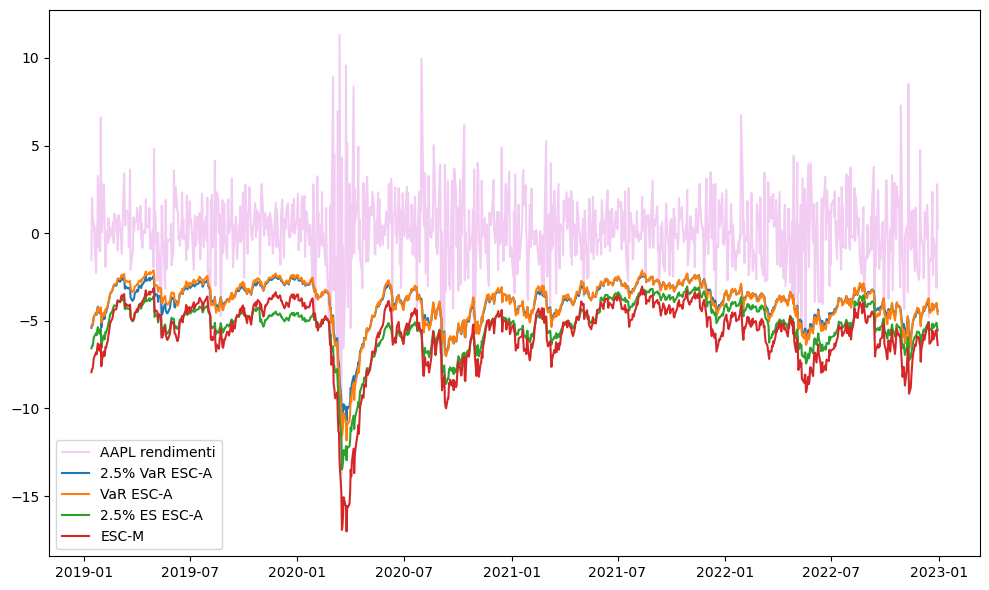

In [203]:
# Figura 36 AAPl
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var25_escav_a_a, label='2.5% VaR ESC-A')
plt.plot(var25_escav_m_a, label='VaR ESC-A')
plt.plot(es25_escav_a_a, label='2.5% ES ESC-A')
plt.plot(es25_escav_m_a, label='ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

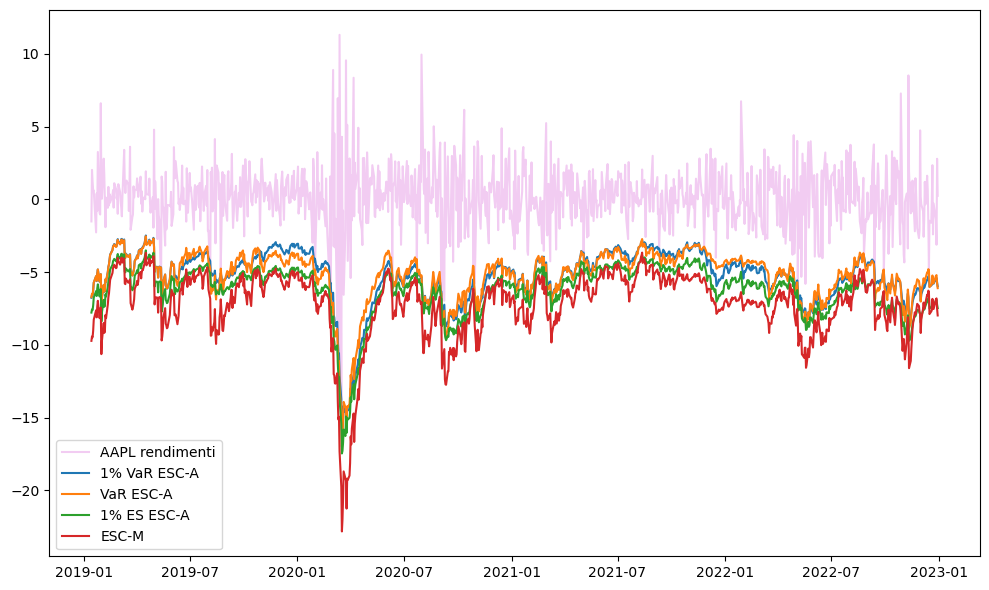

In [204]:
# Figura 37 AAPl
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(var1_escav_a_a, label='1% VaR ESC-A')
plt.plot(var1_escav_m_a, label='VaR ESC-A')
plt.plot(es1_escav_a_a, label='1% ES ESC-A')
plt.plot(es1_escav_m_a, label='ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

In [205]:
# 2.5% VaR forecast accuracy checks
tbl_var25 = pd.DataFrame({
    'G': check_var_fc(var25_garch_a, r_apple[frst_fc:], 0.025),
    'G-t': check_var_fc(var25_garch_t_a, r_apple[frst_fc:], 0.025),
    'C-SAV': check_var_fc(var25_caviar_a, r_apple[frst_fc:], 0.025),
    'C-AS': check_var_fc(var25_cavas_a, r_apple[frst_fc:], 0.025),
    'C-IG': check_var_fc(var25_cavig_a, r_apple[frst_fc:], 0.025),
    'ESC-A': check_var_fc(var25_escav_a_a, r_apple[frst_fc:], 0.025),
    'ESC-M': check_var_fc(var25_escav_m_a, r_apple[frst_fc:], 0.025),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var25.round(3)

,G,G-t,C-SAV,C-AS,C-IG,ESC-A,ESC-M
Viol.(25),32.000,31.000,30.000,26.000,30.000,30.000,30.000
$\hat{p}$,0.032,0.031,0.030,0.026,0.030,0.030,0.030
$\hat{p}/p$,1.280,1.240,1.200,1.040,1.200,1.200,1.200
UC,0.156,0.224,0.311,0.839,0.311,0.311,0.311
Ind,0.146,0.159,0.173,0.238,0.173,0.173,0.173
DQ,0.079,0.075,0.010,0.044,0.009,0.060,0.009
Loss,141.143,143.817,141.440,137.633,143.093,141.310,140.753


In [206]:
# 2.5% ES forecast accuracy checks
tbl_es25 = pd.DataFrame({
    'G-t': check_es_fc(es25_garch_t_a, var25_garch_t_a, s_garch_t_a, r_apple[frst_fc:], 0.025),
    'ESC-A': check_es_fc(es25_escav_a_a, var25_escav_a_a, var25_escav_a_a, r_apple[frst_fc:], 0.025),
    'ESC-M': check_es_fc(es25_escav_m_a, var25_escav_m_a, var25_escav_m_a, r_apple[frst_fc:], 0.025),
    },
    index=['VaR Viol. (25)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es25.round(3)

,G-t,ESC-A,ESC-M
VaR Viol. (25),31.000,30.000,30.000
Q loss,143.817,141.310,140.753
Joint loss,2.732,2.702,2.699
Mean xi,0.337,0.103,0.497
Mean xsi/s,0.136,-0.054,-0.119
t-stat,1.602,-1.229,-3.215
p-val,0.120,0.229,0.003
RMSE,1.014,0.978,0.956
MAD,0.846,0.809,0.804


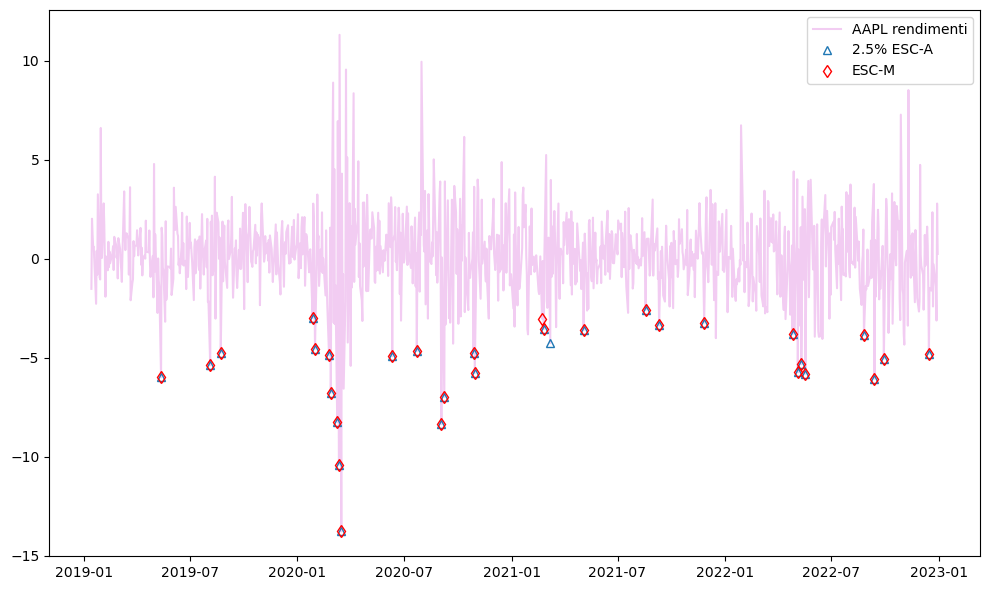

In [207]:
# Figura 38 AAPl
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')

plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_escav_a_a], '^', mfc='none', label='2.5% ESC-A')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var25_escav_m_a], 'dr', mfc='none', label='ESC-M')


plt.legend()
plt.tight_layout()
plt.show()


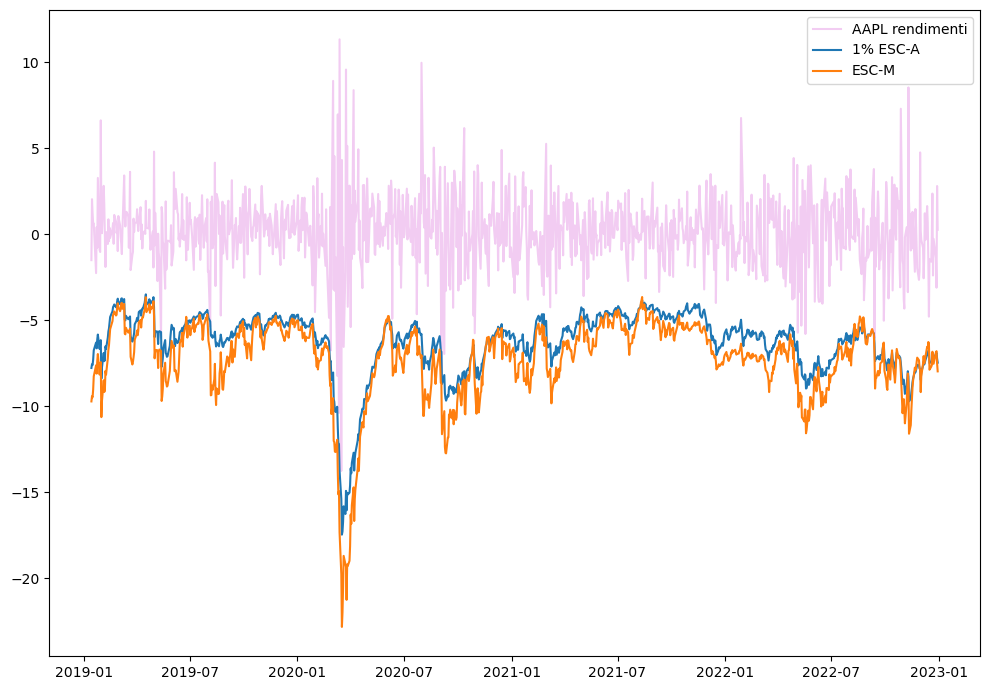

In [208]:
# Figura 39 AAPl
plt.figure(figsize=(10, 7))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(es1_escav_a_a, label='1% ESC-A')
plt.plot(es1_escav_m_a, label='ESC-M')
plt.legend()
plt.tight_layout()
plt.show()

In [209]:
# 1% VaR forecast accuracy checks
tbl_var1 = pd.DataFrame({
    'G': check_var_fc(var1_garch_a, r_apple[frst_fc:], 0.01),
    'G-t': check_var_fc(var1_garch_t_a, r_apple[frst_fc:], 0.01),
    'C-SAV': check_var_fc(var1_caviar_a, r_apple[frst_fc:], 0.01),
    'C-AS': check_var_fc(var1_cavas_a, r_apple[frst_fc:], 0.01),
    'C-IG': check_var_fc(var1_cavig_a, r_apple[frst_fc:], 0.01),
    'ESC-A': check_var_fc(var1_escav_a_a, r_apple[frst_fc:], 0.01),
    'ESC-M': check_var_fc(var1_escav_m_a, r_apple[frst_fc:], 0.01),
    },
    index=['Viol.(25)', '$\hat{p}$', '$\hat{p}/p$', 'UC', 'Ind', 'DQ', 'Loss']
)
tbl_var1.round(3)

,G,G-t,C-SAV,C-AS,C-IG,ESC-A,ESC-M
Viol.(25),22.000,14.000,9.000,8.000,10.000,9.000,8.000
$\hat{p}$,0.022,0.014,0.009,0.008,0.010,0.009,0.008
$\hat{p}/p$,2.200,1.400,0.900,0.800,1.000,0.900,0.800
UC,0.000,0.204,0.751,0.525,1.000,0.751,0.525
Ind,0.320,0.528,0.686,0.719,0.653,0.686,0.719
DQ,0.000,0.000,0.998,0.959,0.166,0.112,0.996
Loss,67.513,65.473,60.078,60.998,61.700,61.683,59.449


In [210]:
# 1% ES forecast accuracy checks
tbl_es1 = pd.DataFrame({
    'G-t': check_es_fc(es1_garch_t_a, var1_garch_t_a, s_garch_t_a, r_apple[frst_fc:], 0.01),
    'ESC-A': check_es_fc(es1_escav_a_a, var1_escav_a_a, var1_escav_a_a, r_apple[frst_fc:], 0.01),
    'ESC-M': check_es_fc(es1_escav_m_a, var1_escav_m_a, var1_escav_m_a, r_apple[frst_fc:], 0.01),
},
    index=['VaR Viol. (10)', 'Q loss', 'Joint loss', 'Mean xi', 'Mean xsi/s', 't-stat', 'p-val',  'RMSE', 'MAD']
    )
tbl_es1.round(3)

,G-t,ESC-A,ESC-M
VaR Viol. (10),14.000,9.000,8.000
Q loss,65.473,61.683,59.449
Joint loss,2.860,2.791,2.770
Mean xi,1.263,0.358,1.130
Mean xsi/s,0.483,-0.086,-0.224
t-stat,4.801,-1.380,-7.071
p-val,0.000,0.205,0.000
RMSE,1.792,0.961,1.218
MAD,1.321,0.822,1.130


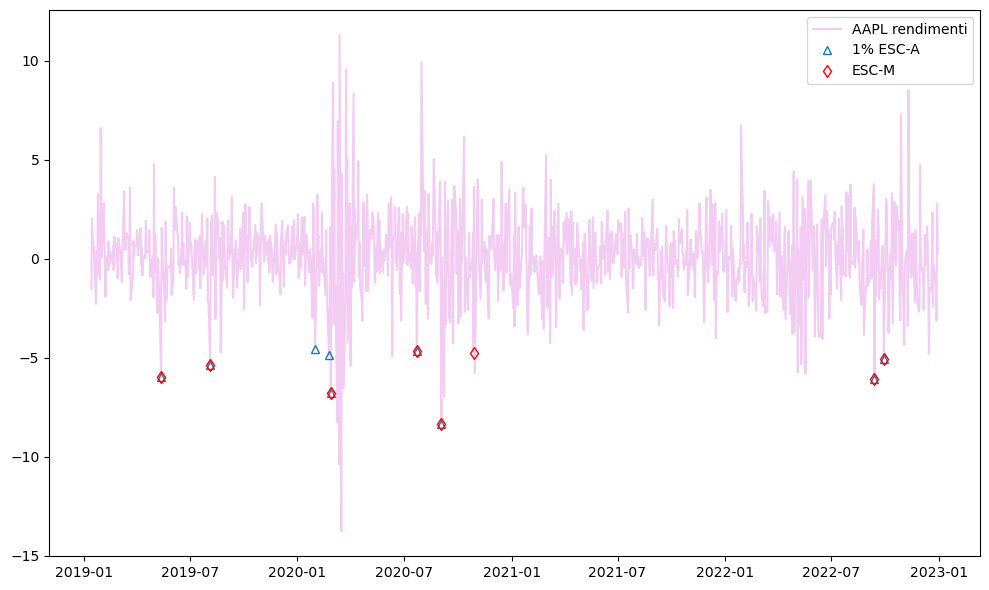

In [211]:
# Figura 40 AAPl
plt.figure(figsize=(10, 6))
plt.plot(r_apple[frst_fc:], 'm-', alpha=0.2, label='AAPL rendimenti')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_escav_a_a], '^', mfc='none', label='1% ESC-A')
plt.plot(r_apple[frst_fc:][r_apple[frst_fc:] < var1_escav_m_a], 'dr', mfc='none', label='ESC-M')

plt.legend()
plt.tight_layout()
plt.show()

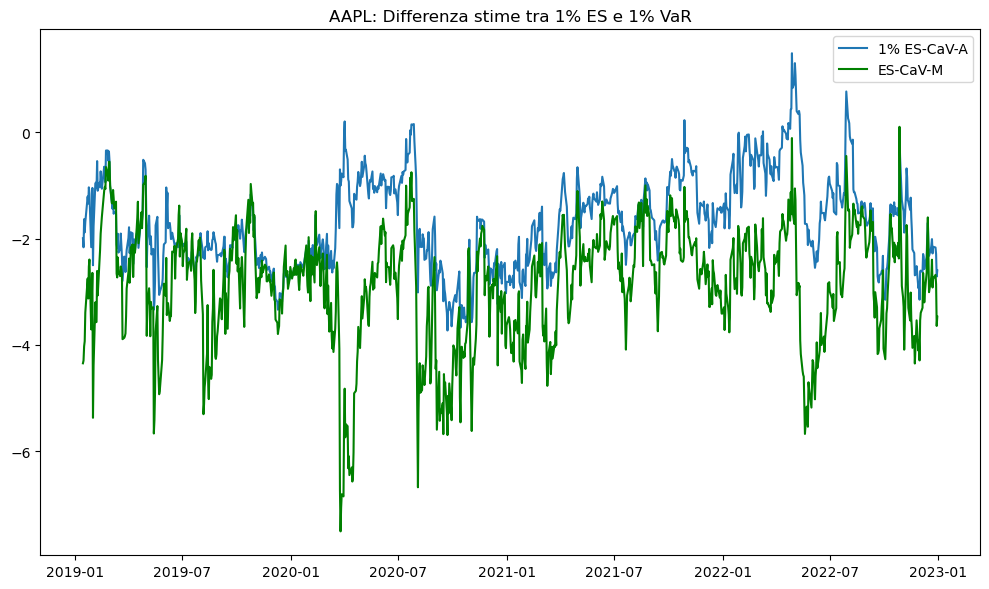

In [212]:
# Figura 41 AAPl
plt.figure(figsize=(10, 6))
plt.plot(es1_escav_a_a-var1_escav_a, label='1% ES-CaV-A')
plt.plot(es1_escav_m_a-var1_escav_m, 'g', label='ES-CaV-M')
plt.title('AAPL: Differenza stime tra 1% ES e 1% VaR')
plt.legend()
plt.tight_layout()
plt.show()

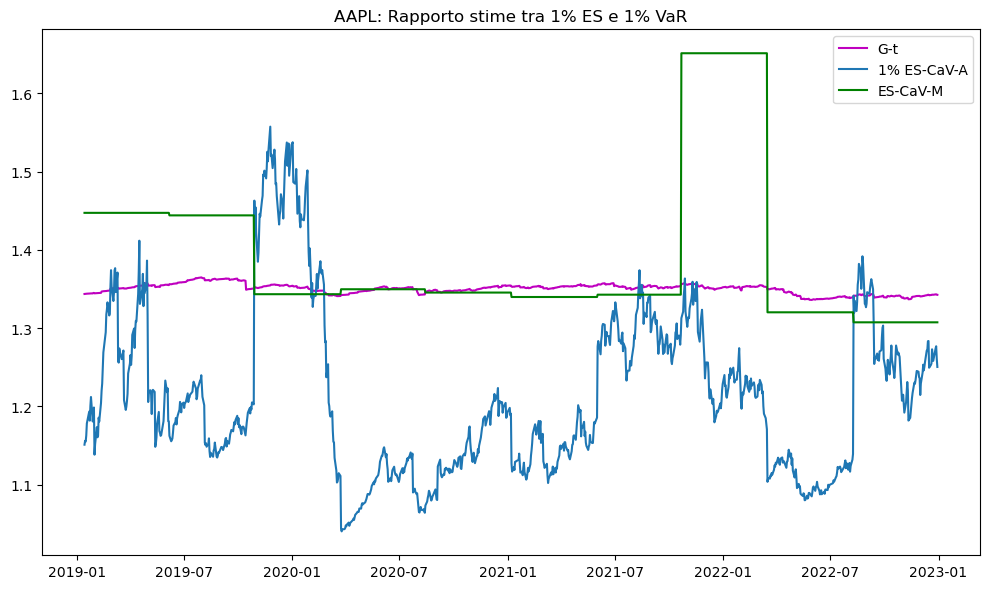

In [213]:
# Figura 42 AAPl
plt.figure(figsize=(10, 6))
plt.plot(es1_garch_t_a/var1_garch_t_a, 'm', label='G-t')
plt.plot(es1_escav_a_a/var1_escav_a_a, label='1% ES-CaV-A')
plt.plot(es1_escav_m_a/var1_escav_m_a, 'g', label='ES-CaV-M')
plt.title('AAPL: Rapporto stime tra 1% ES e 1% VaR')
plt.legend()
plt.tight_layout()
plt.show()